<h2><center>The Experiments for Margin and RC on Cifar10</center></h2>

In [1]:
# change the display more comfortable
import seaborn as sbn
sbn.set()

from IPython.display import HTML
CSS="""#notebook-container {
    width: 100%
}

.code_cell {
   flex-direction: row !important;
}

.code_cell .input {
    width: 50%
}

.code_cell .output_wrapper {
    width: 50%
}"""
HTML('<style>{}</style>'.format(CSS))

In [2]:
# -*- coding: utf-8 -*-
__author__ = 'huangyf'

import os
import re
import sys
import pickle
import torch
import time
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats
from torch import nn, optim
import torch.nn.functional as F
from data_loader import get_loader
from torchvision import transforms
from models import basic_cnn
from utils import AverageMeter, accuracy, get_margin, ramp_loss, margin_error

os.environ["CUDA_VISIBLE_DEVICES"] = "2"

use_gpu = torch.cuda.is_available()


def train_model(model, criterion, optimizer, log_saver, g0, num_epochs=100):
    since = time.time()
    steps = 0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 10)

        for phase in ['train', 'train1', 'test']:

            margin = []
            loss_meter = AverageMeter()
            rloss_meter = AverageMeter()
            ramp_loss_meter = AverageMeter()
            acc_meter = AverageMeter()
            margin_error_meter = AverageMeter()

            if phase == 'train':
                model.train(True)
            else:
                model.train(False)

            for i, data in enumerate(loaders[re.findall('[a-zA-Z]+',
                                                        phase)[0]]):
                inputs, labels = data
                if use_gpu:
                    inputs = inputs.cuda()
                    labels = labels.cuda()

                optimizer.zero_grad()

                outputs = model(inputs)
                _, preds = torch.max(outputs.data, 1)

                loss = criterion(outputs, labels)

                if phase == 'train':
                    loss.backward()
                    optimizer.step()
                    steps += 1

                N = outputs.size(0)

                margin = np.append(margin, get_margin(outputs, labels))
                loss_meter.update(loss.data.item(), N)
                acc_meter.update(
                    accuracy(outputs.data, labels.data)[-1].item(), N)

                if phase != 'train':
                    gamma = log_saver['Lip'][-1] * g0
                    ramp_loss_meter.update(
                        ramp_loss(get_margin(outputs, labels), gamma), N)
                    rloss_meter.update(
                        criterion(outputs / log_saver['Lip'][-1],
                                  labels).data.item(), N)
                    margin_error_meter.update(
                        margin_error(get_margin(outputs, labels), gamma), N)

            epoch_loss = loss_meter.avg
            epoch_error = 1 - acc_meter.avg / 100

            if phase == 'train':
                model.eval()
                lip = 1
                for i in range(6):
                    if i <= 4:
                        size = eval('model.features.conv%d.weight.size()' % i)
                        # here to compute the l1 norm between each CNN layer
                        w_cnn = eval(
                            'model.features.conv%d.weight.view(size[0],-1)' %
                            i)
                        w_bn = eval('model.features.bn%d.weight' % i)
                        var_bn = eval('model.features.bn%d.running_var' % i)
                        eps_bn = eval('model.features.bn%d.eps' % i)
                        scale = w_bn / (var_bn.sqrt() + eps_bn)
                        w_cnn_new = w_cnn * scale.view(-1, 1)
                        w_norm = w_cnn_new.norm(1).data.item()
                        log_saver['w%d' % i].append(w_norm)
                    else:
                        w_norm = model.classifier.weight.norm(2).data.item()
                        log_saver['w_fc'].append(w_norm)
                    lip *= w_norm / 1000
                log_saver['Lip'].append(lip)

            if phase == 'train1':

                log_saver['train_loss'].append(epoch_loss)
                log_saver['train_error'].append(epoch_error)
                log_saver['margin_train'].append(margin)
                log_saver['train_rloss'].append(rloss_meter.avg)
                log_saver['train_ramp_loss'].append(ramp_loss_meter.avg)
                log_saver['train_margin_error'].append(margin_error_meter.avg)

            elif phase == 'test':

                log_saver['test_loss'].append(epoch_loss)
                log_saver['test_error'].append(epoch_error)
                log_saver['margin_test'].append(margin)
                log_saver['test_rloss'].append(rloss_meter.avg)
                log_saver['test_ramp_loss'].append(ramp_loss_meter.avg)
                log_saver['test_margin_error'].append(margin_error_meter.avg)

            if phase != 'train':
                print(
                    f'{phase} Loss: {epoch_loss:.4f} rLoss: {rloss_meter.avg:.4f} Error: {epoch_error:.4f}',
                    f'RampLoss: {ramp_loss_meter.avg:.6f} MarginError: {margin_error_meter.avg:.4f}',
                    f"Margin: {min(margin):.4f} Lip: {log_saver['Lip'][-1]:.4e}"
                )

        if epoch % 30 == 0 or epoch == num_epochs - 1:
            print('Saving..')
            state = {'net': model, 'epoch': epoch, 'log': log_saver}

            if not os.path.isdir('checkpoint_CNN'):
                os.mkdir('checkpoint_CNN')
            torch.save(state,
                       './checkpoint_CNN/ckpt_epoch_{}.t7'.format(epoch))

    time_elapsed = time.time() - since
    print(
        f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s'
    )

    return model, log_saver

/home/yhuangcc/.conda/envs/pytorch/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [90]:
def plot(log, q, result_dir):
    fontdict = {'size': 30}

    def get_fig(i, title):
        fig = plt.figure(i, figsize=(20, 10))
        ax = fig.add_subplot(111)

        plt.xticks(fontsize=20)
        plt.yticks(fontsize=20)
        return fig, ax

    def get_qmargin(margins, q):
        q1 = int(len(margins[0]) * q)
        return [np.partition(margin, q1)[q1] for margin in margins]

    fig1, ax1 = get_fig(1, 'Loss on Cifar10')
    fig2, ax2 = get_fig(2, 'Error on Cifar10')
    fig3, ax3 = get_fig(3, 'l1-norm of conv weights in 5-layer CNN on Cifar10')
    fig4, ax4 = get_fig(4, 'Margin($\gamma$) of 5-layer CNN on Cifar10')
    fig5, ax5 = get_fig(5, r'Normalised Margin')
    fig6, ax6 = get_fig(6, 'l2-norm of fc weight in 5-layer CNN on Cifar10')
    fig7, ax7 = get_fig(7, r'Normalised qMargin(.8)')
    fig8, ax8 = get_fig(8, r'qMargin(.8)')
    fig9, ax9 = get_fig(9, r'Rademacher Complexity')
    fig10, ax10 = get_fig(10, r'train rloss and test rloss')
    fig11, ax11 = get_fig(11, r'train rloss and test error')
    fig12, ax12 = get_fig(12, r'rc and test error')
    fig13, ax13 = get_fig(13, r'rloss')
    fig14, ax14 = get_fig(14, r'ramp loss')
    fig15, ax15 = get_fig(15, r'margin error and test error')
    fig16, ax16 = get_fig(16, r'margin error')

    ax1.plot(log['train_loss'],'r', linewidth=3, label='training')
    ax1.plot(log['test_loss'],'b', linewidth=3, label='test')
    ax1.set_ylabel('loss',fontdict=fontdict)
    ax2.plot(log['train_error'],'r', linewidth=3, label='training')
    ax2.plot(log['test_error'],'b', linewidth=3,label='test')
    ax2.set_ylabel('error',fontdict=fontdict)
    ax4.plot(
        [min(x) for x in log['margin_train']],'r', linewidth=3, label='training')
    ax4.plot([min(x) for x in log['margin_test']],'b', linewidth=3, label='test')

    ax14.plot(log['train_ramp_loss'],'r', linewidth=3, label='training')
    ax14.plot(log['test_ramp_loss'],'b', linewidth=3, label='test')

    ax8.plot(
        get_qmargin(log['margin_train'], q),'r', linewidth=3, label='training')
    ax8.plot(get_qmargin(log['margin_test'], q),'b', linewidth=3, label='test')
    ax13.plot(log['train_rloss'],'r', linewidth=3, label='training')
    ax13.plot(log['test_rloss'],'b', linewidth=3, label='test')

    ax16.plot(log['train_margin_error'],'r', linewidth=3, label='training')
    ax16.plot(log['test_margin_error'],'b', linewidth=3, label='test')

    log['nMargin_train'] = np.array([min(x) for x in log['margin_train']
                                     ]) / np.array(log['Lip'])
    log['nMargin_test'] = np.array([min(x) for x in log['margin_test']
                                    ]) / np.array(log['Lip'])

    ax5.plot(log['nMargin_train'],'r', linewidth=3, label='training')
    ax5.plot(log['nMargin_test'],'b', linewidth=3, label='test')

    log['nqMargin_train'] = np.array(get_qmargin(log['margin_train'],
                                                 q)) / np.array(log['Lip'])
    log['nqMargin_test'] = np.array(get_qmargin(log['margin_test'],
                                                q)) / np.array(log['Lip'])

    ax7.plot(1/log['nqMargin_train'],'r', linewidth=5, label=r'$1/\hat{\gamma}_{q,t}$')
    ax7.plot(log['test_error'],'b', linewidth=5, label='test error')
    ax7.set_ylim(0,0.6)
    x1=np.argmin(1/log['nqMargin_train'])
    x2=np.argmin(log['test_error'])
    ax7.scatter(x1,1/log['nqMargin_train'][x1],s=250,c='k',marker='x',linewidth=5)
    ax7.scatter(x2,log['test_error'][x2],s=250,c='k',marker='x',linewidth=5)
    ticks=np.array([0,x2,19,39,59,79,99])
    ax7.set_xticks(ticks)
    ax7.set_xticklabels(ticks+1)

    ax9.plot(
        np.array(log['Lip']) / np.array(get_qmargin(log['margin_train'], 0.3)),'r',
        linewidth=3,
        label='q=0.3')
    ax9.plot(
        np.array(log['Lip']) / np.array(get_qmargin(log['margin_train'], 0.5)),'r',
        linewidth=3,
        label='q=0.5')
    ax9.plot(
        np.array(log['Lip']) / np.array(get_qmargin(log['margin_train'], 0.8)),'r',
        linewidth=3,
        label='q=0.8')

    ax10.scatter(
        log['train_rloss'],
        log['test_rloss'],
        label=
        f"corrcoef= {np.corrcoef(log['train_rloss'], log['test_rloss'])[0,1]:.4f}"
    )

    ax11.scatter(
        log['train_rloss'],
        log['test_error'],
        label=
        f"corrcoef= {np.corrcoef(log['train_rloss'], log['test_error'])[0,1]:.4f}"
    )

    log['RC'] = np.array(log['Lip']) / np.array(
        get_qmargin(log['margin_train'], q))
    ax12.scatter(
        log['RC'][10:],
        log['test_error'][10:],
        label=
        f"corrcoef= {np.corrcoef(log['RC'][10:], log['test_error'][10:])[0,1]:.4f}"
    )

    ax15.scatter(
        log['train_margin_error'],
        log['test_error'],
        label=
        f"corrcoef= {np.corrcoef(log['train_margin_error'], log['test_error'])[0,1]:.4f}"
    )

    for i in range(5):
        ax3.plot(log['w%d' % i], linewidth=3, label='conv-%d weight' % i)

    ax6.plot(log['w_fc'], linewidth=3, label='fc weight')

    for ax in [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax13, ax14, ax16]:
        ax.set_xlabel('Epoch', fontdict=fontdict)
        ax.legend(loc='upper right', fontsize=20)

    ax10.set_xlabel('train rloss', fontdict=fontdict)
    ax10.set_ylabel('test rloss', fontdict=fontdict)
    ax10.legend(loc='upper right', fontsize=20)

    ax11.set_xlabel('train rloss', fontdict=fontdict)
    ax11.set_ylabel('test error', fontdict=fontdict)
    ax11.legend(loc='upper right', fontsize=20)

    ax12.set_xlabel('train RC', fontdict=fontdict)
    ax12.set_ylabel('test error', fontdict=fontdict)
    ax12.legend(loc='upper right', fontsize=20)

    ax15.set_xlabel('train margin error', fontdict=fontdict)
    ax15.set_ylabel('test error', fontdict=fontdict)
    ax15.legend(loc='upper right', fontsize=20)

    if not os.path.exists(result_dir):
        os.mkdir(result_dir)
    fig1.savefig(result_dir + 'loss%d.png' % channels)
    fig2.savefig(result_dir + 'error%d.png' % channels)
    fig3.savefig(result_dir + 'conv_weight%d.png' % channels)
    fig4.savefig(result_dir + 'margin%d.png' % channels)
    fig5.savefig(result_dir + 'n_margin%d.png' % channels)
    fig6.savefig(result_dir + 'fc_weight%d.png' % channels)
    fig7.savefig(result_dir + 'nq_margin%d.png' % channels)
    fig8.savefig(result_dir + 'q_margin%d.png' % channels)
    fig9.savefig(result_dir + 'rc%d.png' % channels)
    fig10.savefig(result_dir + 'rloss_rloss%d.png' % channels)
    fig11.savefig(result_dir + 'rloss_error%d.png' % channels)
    fig12.savefig(result_dir + 'rc_error%d.png' % channels)
    fig13.savefig(result_dir + 'rloss%d.png' % channels)
    fig14.savefig(result_dir + 'ramp_loss%d.png' % channels)
    fig15.savefig(result_dir + 'margin_error_test_error%d.png' % channels)
    fig16.savefig(result_dir + 'margin_error%d.png' % channels)

# The experiment on Cifar10 with no-noise

In [142]:
from torchsummary import summary
summary(basic_cnn.CNN(50,10).cuda(),[3,32,32])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 50, 16, 16]           1,400
       BatchNorm2d-2           [-1, 50, 16, 16]             100
              ReLU-3           [-1, 50, 16, 16]               0
            Conv2d-4             [-1, 50, 8, 8]          22,550
       BatchNorm2d-5             [-1, 50, 8, 8]             100
              ReLU-6             [-1, 50, 8, 8]               0
            Conv2d-7             [-1, 50, 4, 4]          22,550
       BatchNorm2d-8             [-1, 50, 4, 4]             100
              ReLU-9             [-1, 50, 4, 4]               0
           Conv2d-10             [-1, 50, 2, 2]          22,550
      BatchNorm2d-11             [-1, 50, 2, 2]             100
             ReLU-12             [-1, 50, 2, 2]               0
           Conv2d-13             [-1, 50, 1, 1]          22,550
      BatchNorm2d-14             [-1, 5

In [44]:
# %%
root = './'
lr = 0.005
BATCH_SIZE = 100
weight_decay = 0.
label_mode = 'original'
g0 = 20

print(f'****** label mode: {label_mode} ******')

img_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])
(training_dataset, testing_dataset), \
(training_loader, testing_loader) = get_loader(root, BATCH_SIZE, label_mode, img_transforms)

loaders = {'train': training_loader, 'test': testing_loader}

log = {
    'num_params': [],
    'train_loss': [],
    'train_rloss': [],
    'train_error': [],
    'train_margin_error': [],
    'train_ramp_loss': [],
    'test_ramp_loss': [],
    'test_loss': [],
    'test_rloss': [],
    'test_error': [],
    'test_margin_error': [],
    'Lip': [],
    'w0': [],
    'w1': [],
    'w2': [],
    'w3': [],
    'w4': [],
    'w_fc': [],
    'margin_train': [],
    'margin_test': []
}

# %% run the model
num_epochs = 100
channels = 100
# here use with_bn to control batch normalisation
model = basic_cnn.CNN(channels, 10, with_bn=True)

number_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'total parameters: {number_params}')

log['num_params'].append(number_params)

if use_gpu:
    model = model.cuda()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=lr, weight_decay=weight_decay)

****** label mode: original ******


/home/yhuangcc/.conda/envs/pytorch/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


total parameters: 365210


In [45]:
model, log = train_model(
    model, criterion, optimizer, log, g0, num_epochs=num_epochs)

Epoch 1/100
----------
train1 Loss: 1.7287 rLoss: 3.1314 Error: 0.5717 RampLoss: 0.904234 MarginError: 0.9998 Margin: -4.5454 Lip: 1.0776e-01
test Loss: 1.7407 rLoss: 3.1725 Error: 0.5793 RampLoss: 0.905593 MarginError: 0.9998 Margin: -3.3831 Lip: 1.0776e-01
Saving..
Epoch 2/100
----------
train1 Loss: 1.4699 rLoss: 3.3793 Error: 0.4942 RampLoss: 0.828320 MarginError: 0.9851 Margin: -4.9455 Lip: 1.1050e-01
test Loss: 1.4944 rLoss: 3.5339 Error: 0.5015 RampLoss: 0.832385 MarginError: 0.9862 Margin: -4.6525 Lip: 1.1050e-01
Epoch 3/100
----------
train1 Loss: 1.3012 rLoss: 3.2463 Error: 0.4435 RampLoss: 0.770333 MarginError: 0.9618 Margin: -5.3144 Lip: 1.1984e-01
test Loss: 1.3492 rLoss: 3.5885 Error: 0.4645 RampLoss: 0.780352 MarginError: 0.9617 Margin: -5.5966 Lip: 1.1984e-01
Epoch 4/100
----------
train1 Loss: 1.1737 rLoss: 2.9695 Error: 0.3995 RampLoss: 0.725873 MarginError: 0.9415 Margin: -5.3839 Lip: 1.2824e-01
test Loss: 1.2462 rLoss: 3.4372 Error: 0.4358 RampLoss: 0.743929 MarginE

test Loss: 1.2823 rLoss: 2.1401 Error: 0.3508 RampLoss: 0.703889 MarginError: 0.9652 Margin: -14.8437 Lip: 5.2408e-01
Epoch 33/100
----------
train1 Loss: 0.0883 rLoss: 0.0525 Error: 0.0171 RampLoss: 0.550094 MarginError: 0.9719 Margin: -6.4754 Lip: 5.4935e-01
test Loss: 1.3555 rLoss: 2.1930 Error: 0.3562 RampLoss: 0.717451 MarginError: 0.9745 Margin: -15.4957 Lip: 5.4935e-01
Epoch 34/100
----------
train1 Loss: 0.0690 rLoss: 0.0349 Error: 0.0104 RampLoss: 0.534337 MarginError: 0.9706 Margin: -6.0336 Lip: 5.5521e-01
test Loss: 1.3503 rLoss: 2.1687 Error: 0.3545 RampLoss: 0.709742 MarginError: 0.9705 Margin: -16.2818 Lip: 5.5521e-01
Epoch 35/100
----------
train1 Loss: 0.0586 rLoss: 0.0281 Error: 0.0084 RampLoss: 0.522940 MarginError: 0.9687 Margin: -5.1004 Lip: 5.5933e-01
test Loss: 1.3395 rLoss: 2.1437 Error: 0.3432 RampLoss: 0.705565 MarginError: 0.9695 Margin: -16.6070 Lip: 5.5933e-01
Epoch 36/100
----------
train1 Loss: 0.0975 rLoss: 0.0737 Error: 0.0240 RampLoss: 0.556485 MarginEr

train1 Loss: 0.0033 rLoss: 0.0008 Error: 0.0000 RampLoss: 0.508437 MarginError: 0.9867 Margin: 1.4367 Lip: 7.9632e-01
test Loss: 1.7213 rLoss: 2.0900 Error: 0.3582 RampLoss: 0.731337 MarginError: 0.9850 Margin: -21.6455 Lip: 7.9632e-01
Epoch 65/100
----------
train1 Loss: 0.0039 rLoss: 0.0012 Error: 0.0001 RampLoss: 0.504647 MarginError: 0.9853 Margin: -2.1169 Lip: 7.9449e-01
test Loss: 1.7185 rLoss: 2.0907 Error: 0.3566 RampLoss: 0.727864 MarginError: 0.9828 Margin: -20.5748 Lip: 7.9449e-01
Epoch 66/100
----------
train1 Loss: 0.0035 rLoss: 0.0009 Error: 0.0000 RampLoss: 0.504662 MarginError: 0.9865 Margin: 0.6347 Lip: 7.8957e-01
test Loss: 1.7182 rLoss: 2.1018 Error: 0.3556 RampLoss: 0.728642 MarginError: 0.9843 Margin: -22.4174 Lip: 7.8957e-01
Epoch 67/100
----------
train1 Loss: 0.0033 rLoss: 0.0009 Error: 0.0000 RampLoss: 0.509369 MarginError: 0.9881 Margin: 0.4652 Lip: 8.0402e-01
test Loss: 1.7240 rLoss: 2.0760 Error: 0.3553 RampLoss: 0.731530 MarginError: 0.9859 Margin: -20.6073

train1 Loss: 0.0012 rLoss: 0.0005 Error: 0.0000 RampLoss: 0.503700 MarginError: 0.9899 Margin: 2.9359 Lip: 8.8956e-01
test Loss: 1.8744 rLoss: 2.0741 Error: 0.3591 RampLoss: 0.735332 MarginError: 0.9871 Margin: -21.2710 Lip: 8.8956e-01
Epoch 97/100
----------
train1 Loss: 0.0012 rLoss: 0.0005 Error: 0.0000 RampLoss: 0.501374 MarginError: 0.9897 Margin: 3.0076 Lip: 8.8014e-01
test Loss: 1.8543 rLoss: 2.0703 Error: 0.3583 RampLoss: 0.734971 MarginError: 0.9872 Margin: -22.6288 Lip: 8.8014e-01
Epoch 98/100
----------
train1 Loss: 0.0011 rLoss: 0.0005 Error: 0.0000 RampLoss: 0.503931 MarginError: 0.9910 Margin: 3.4640 Lip: 8.9290e-01
test Loss: 1.8632 rLoss: 2.0545 Error: 0.3583 RampLoss: 0.737110 MarginError: 0.9885 Margin: -21.9388 Lip: 8.9290e-01
Epoch 99/100
----------
train1 Loss: 0.0010 rLoss: 0.0005 Error: 0.0000 RampLoss: 0.504713 MarginError: 0.9912 Margin: 2.7963 Lip: 8.9819e-01
test Loss: 1.8753 rLoss: 2.0573 Error: 0.3598 RampLoss: 0.737307 MarginError: 0.9879 Margin: -21.9877 

In [286]:
import pickle
pickle.dump(log,open('./results_original/log_original.log','wb'))

In [4]:
import pickle
log=pickle.load(open('./results_original/log_original.log','rb'))

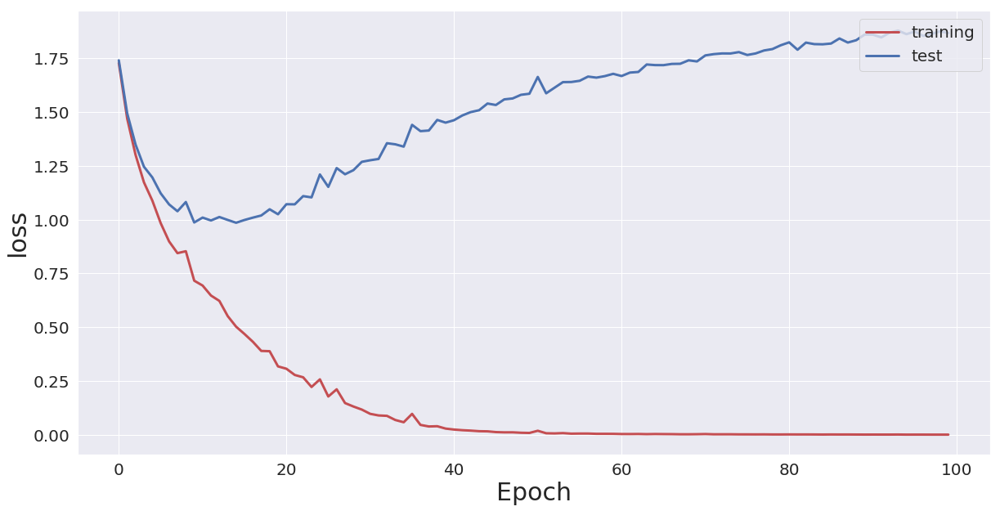

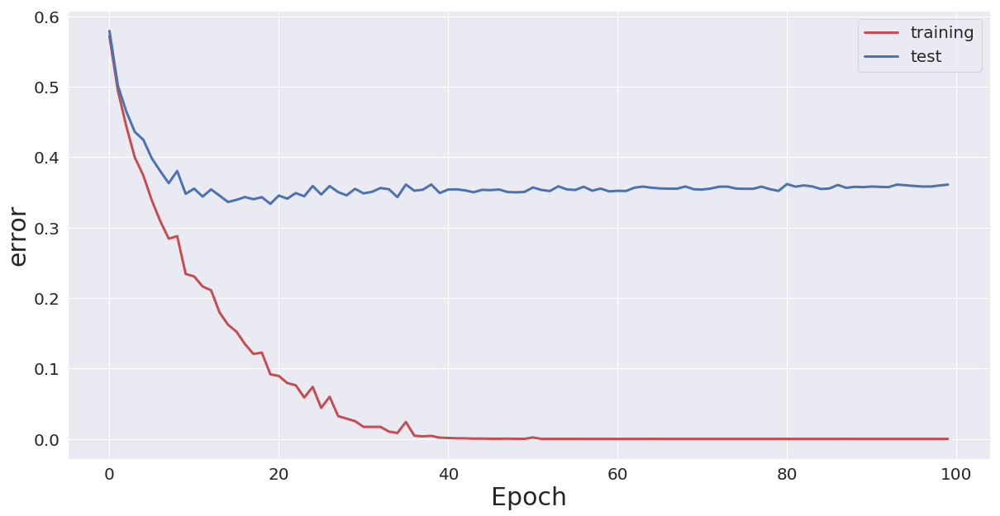

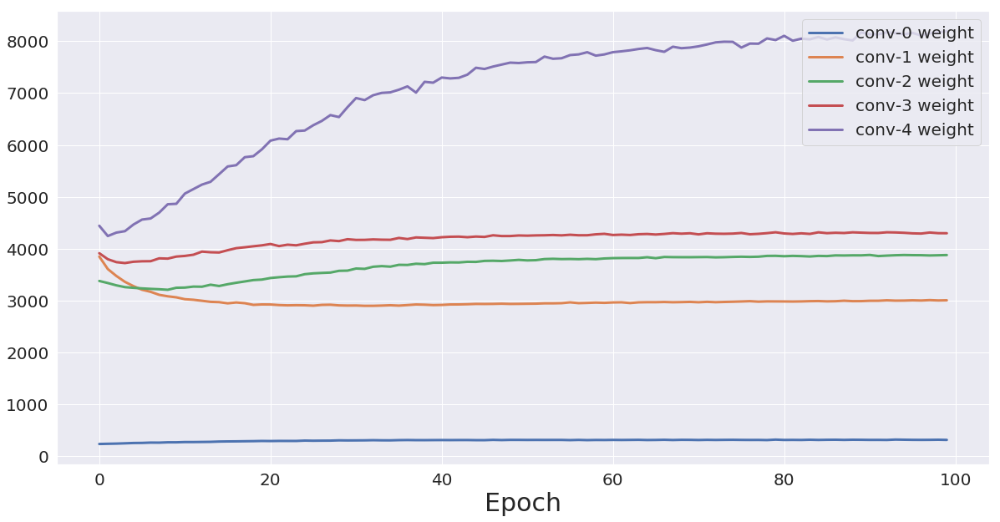

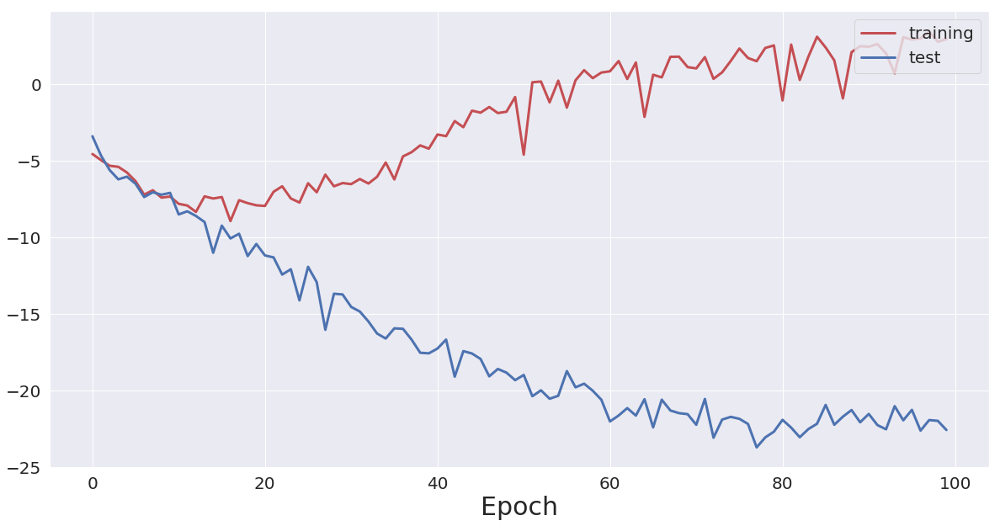

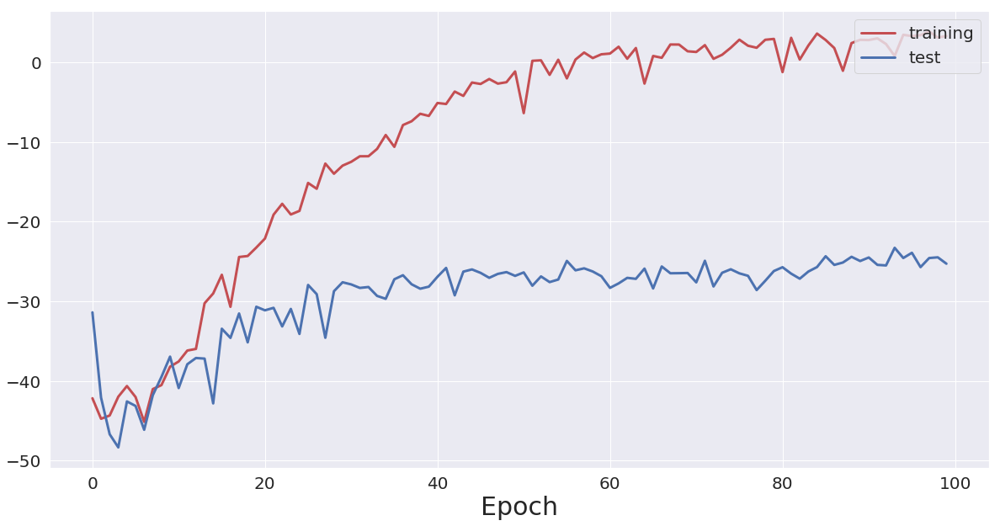

...

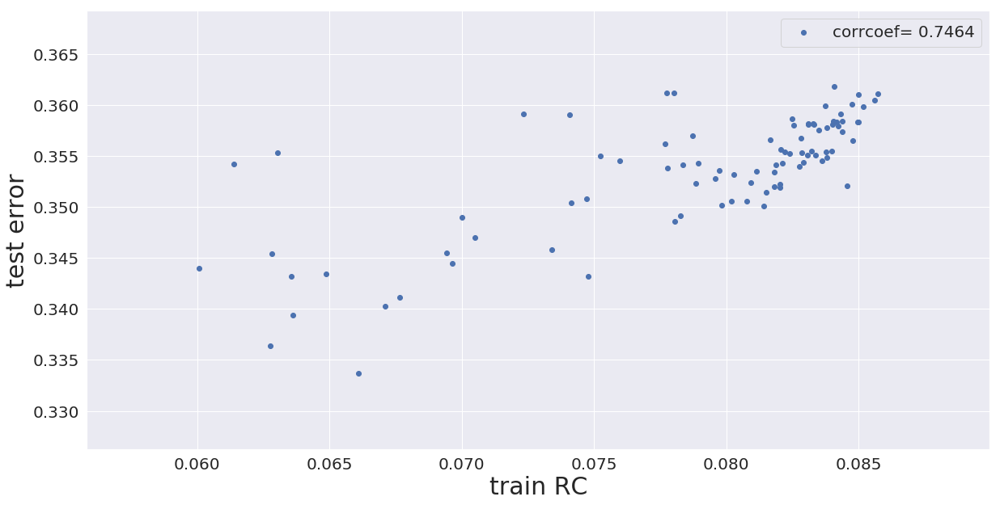

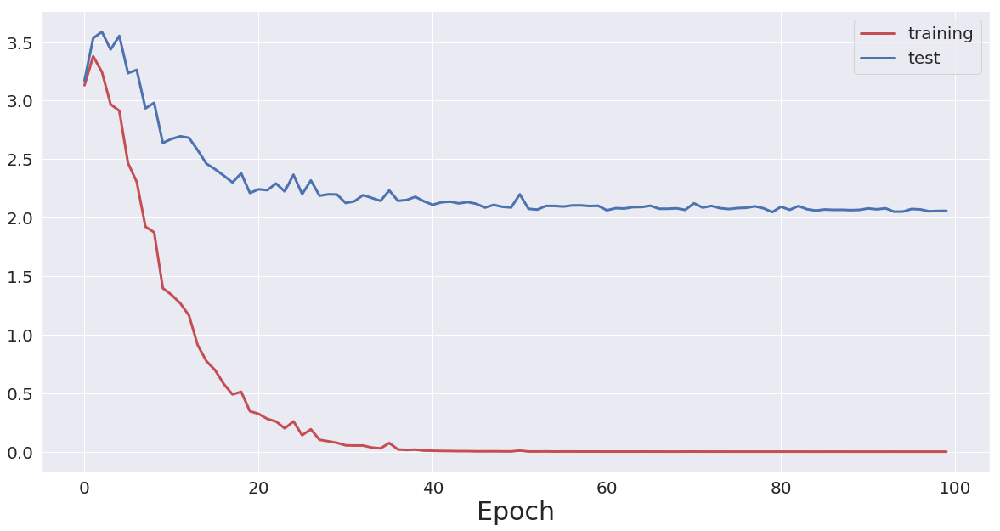

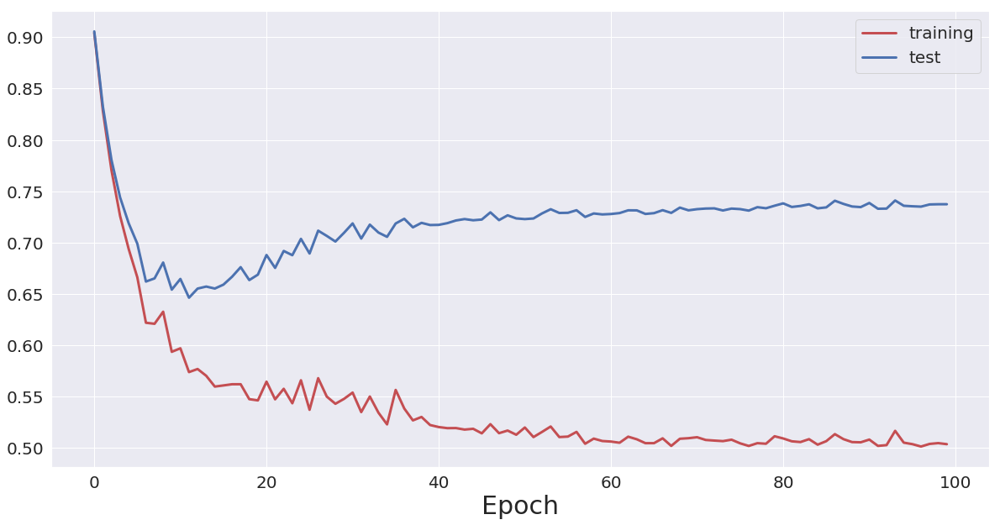

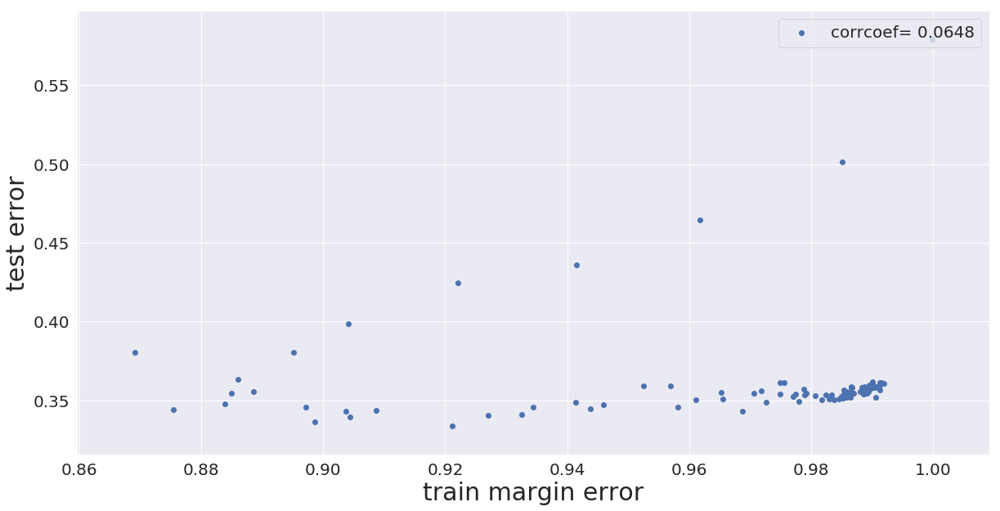

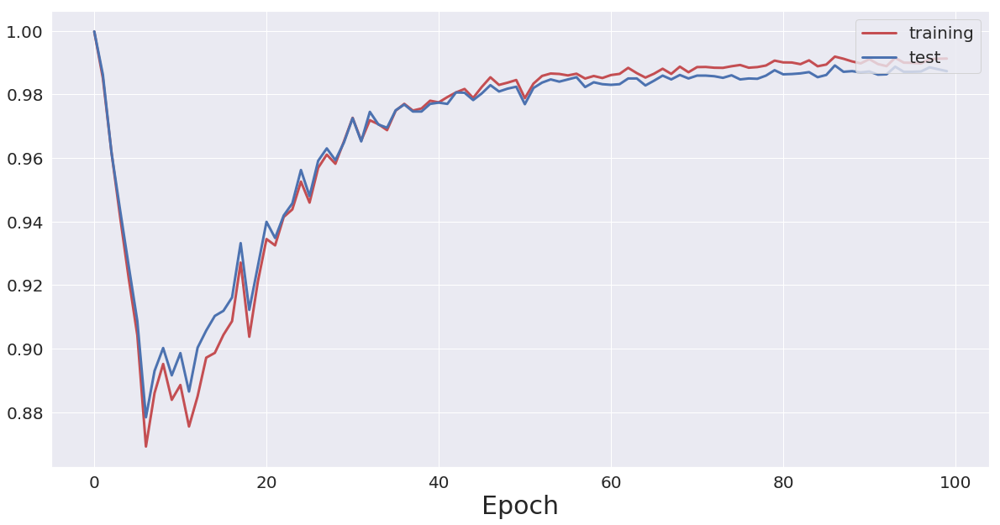

In [87]:
plot(log, 0.8, './results_original/')
plt.show()

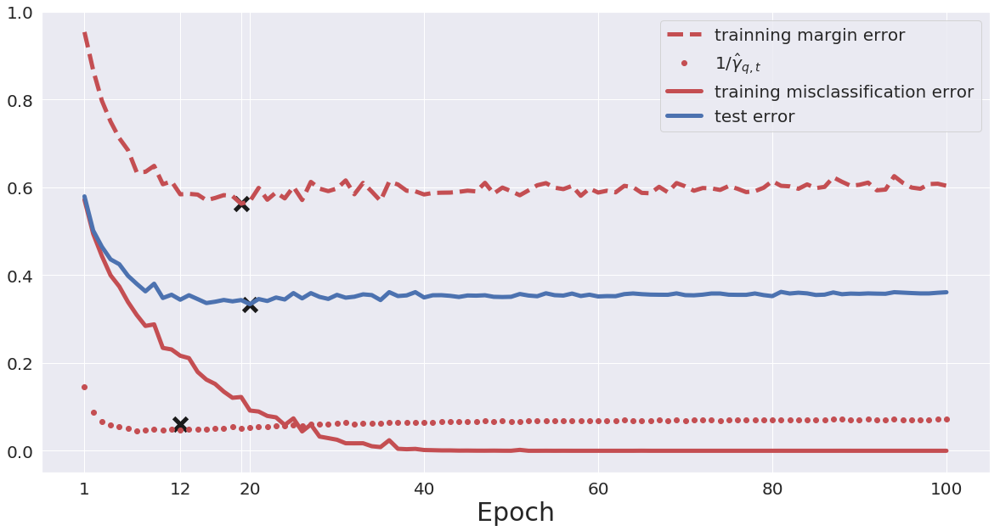

In [282]:
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

train_merror=[margin_error(margin, lip * 9.8) for (margin, lip) in zip(log['margin_train'], log['Lip'])]
nqMargin_train = np.array(get_qmargin(log['margin_train'],
                                                 0.9)) / np.array(log['Lip'])

ax.plot(train_merror
    ,'r--',linewidth=5,
    label='trainning margin error')
ax.plot(1/nqMargin_train,'ro', linewidth=5, label=r'$1/\hat{\gamma}_{q,t}$')

ax.plot(log['train_error'],'r',linewidth=5,label='training misclassification error')
ax.plot(log['test_error'],'b',linewidth=5,label='test error')

#ax.set_xlim(0,100)
ax.set_ylim(-0.05,1)
x1=np.argmin(log['test_error'])
ax.scatter(x1,log['test_error'][x1],s=250,c='k',marker='x',linewidth=5)
x2=np.argmin(train_merror)
ax.scatter(x2,train_merror[x2],s=250,c='k',marker='x',linewidth=5)

ax.set_xlabel('Epoch',fontdict={'size': 30})


x3=np.argmin(1/log['nqMargin_train'])
ax.scatter(x3,1/log['nqMargin_train'][x3],s=250,c='k',marker='x',linewidth=5)
ax.set_xticks([0,x1,x2,x3,39,59,79,99])
ax.set_xticklabels([1,x1+1,'',x3+1,40,60,80,100])
ax.legend(loc='best',fontsize=20)
fig.savefig('./results_original/margin_error_and_test_error.png')

plt.show()

best q  0.6000000000000001


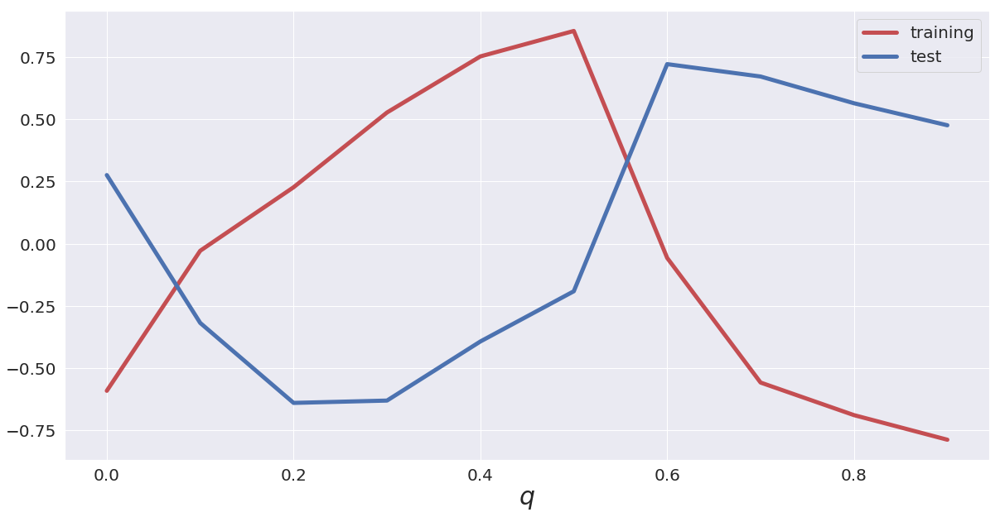

In [76]:
import scipy.stats
def get_qmargin(margins, q):
    q1 = int(len(margins[0]) * q)
    return [np.partition(margin, q1)[q1] for margin in margins]
spe_train,spe_test = [],[]
qs = np.linspace(0., 0.9, 10)
for q in qs:
    nqMargin_train = np.array(get_qmargin(log['margin_train'], q)) / np.array(
        log['Lip'])
    spe_test.append(
        scipy.stats.stats.spearmanr(1/nqMargin_train, log['test_error'])[0])
    spe_train.append(
        scipy.stats.stats.spearmanr(1/nqMargin_train, log['train_error'])[0])
print('best q ',qs[np.argmax(spe_test)])
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
#plt.title(r'$1/\hat{\rho}_{q}$ and test error', fontsize=30, y=1.04)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
ax.plot(qs, spe_train,'r',linewidth=5, label='training')
ax.plot(qs, spe_test,'b',linewidth=5, label='test')
ax.set_xlabel(r'$q$',fontdict={'size':30})
#ax.set_ylabel("Spearman's rank Correlation",fontdict={'size':30})
ax.legend(loc='best',fontsize=20)
fig.savefig('./results_original/rank_corr.png')
plt.show()

best q  0.6000000000000001


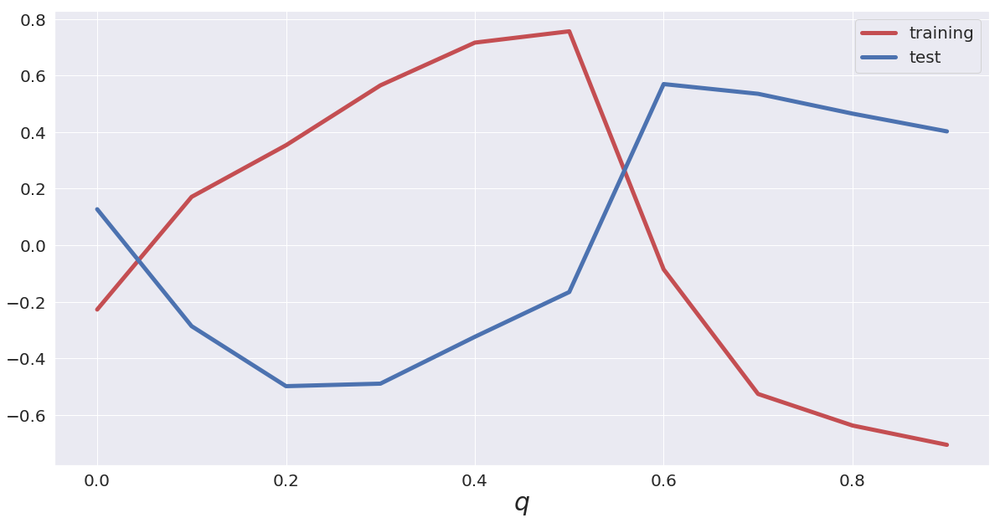

In [283]:
import scipy.stats
def get_qmargin(margins, q):
    q1 = int(len(margins[0]) * q)
    return [np.partition(margin, q1)[q1] for margin in margins]
spe_train,spe_test = [],[]
qs = np.linspace(0., 0.9, 10)
for q in qs:
    nqMargin_train = np.array(get_qmargin(log['margin_train'], q)) / np.array(
        log['Lip'])
    spe_test.append(
        scipy.stats.stats.kendalltau(1/nqMargin_train, log['test_error'])[0])
    spe_train.append(
        scipy.stats.stats.kendalltau(1/nqMargin_train, log['train_error'])[0])
print('best q ',qs[np.argmax(spe_test)])
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
#plt.title(r'$1/\hat{\rho}_{q}$ and test error', fontsize=30, y=1.04)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
ax.plot(qs, spe_train,'r',linewidth=5, label='training')
ax.plot(qs, spe_test,'b',linewidth=5, label='test')
ax.set_xlabel(r'$q$',fontdict={'size':30})
#ax.set_ylabel("Spearman's rank Correlation",fontdict={'size':30})
ax.legend(loc='best',fontsize=20)
fig.savefig('./results_original/ken_rank_corr.png')
plt.show()

best g0 10.0


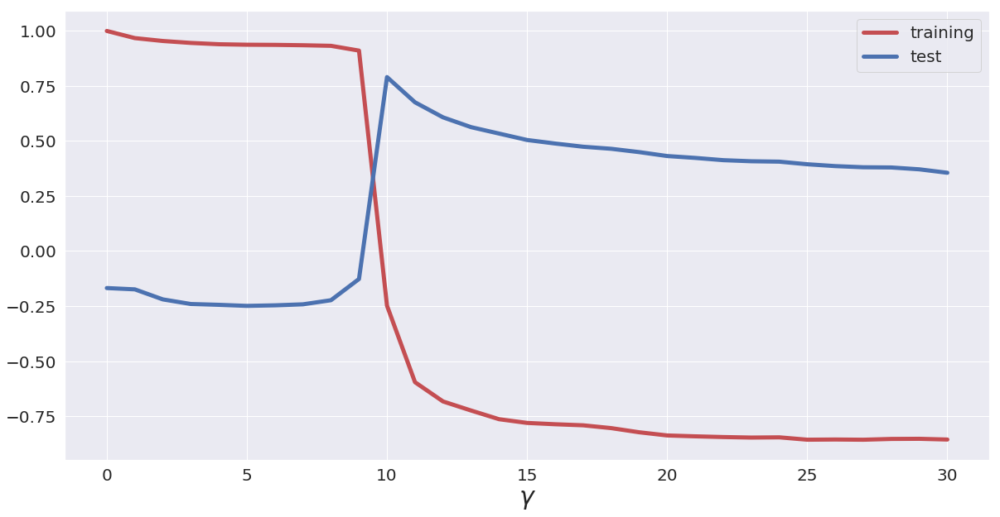

In [284]:
gs = np.linspace(0, 30, 31)
spe_train,spe_test = [],[]
for g in gs:
    m_error = [
        margin_error(margin, lip * g)
        for (margin, lip) in zip(log['margin_train'], log['Lip'])
    ]
    spe_train.append(scipy.stats.stats.spearmanr(m_error, log['train_error'])[0])
    spe_test.append(scipy.stats.stats.spearmanr(m_error, log['test_error'])[0])
print('best g0',gs[np.argmax(spe_test)])
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
#plt.title(r'Training margin error and test error', fontsize=30, y=1.04)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
ax.plot(gs, spe_train,'r',linewidth=5, label='training')
ax.plot(gs, spe_test,'b',linewidth=5, label='test')
ax.set_xlabel(r'$\gamma$',fontdict={'size':30})
#ax.set_ylabel("Spearman's rank correlation",fontdict={'size':30})
ax.legend(loc='upper right',fontsize=20)
fig.savefig('./results_original/rank_corr_1.png')
plt.show()

best g0 10.0


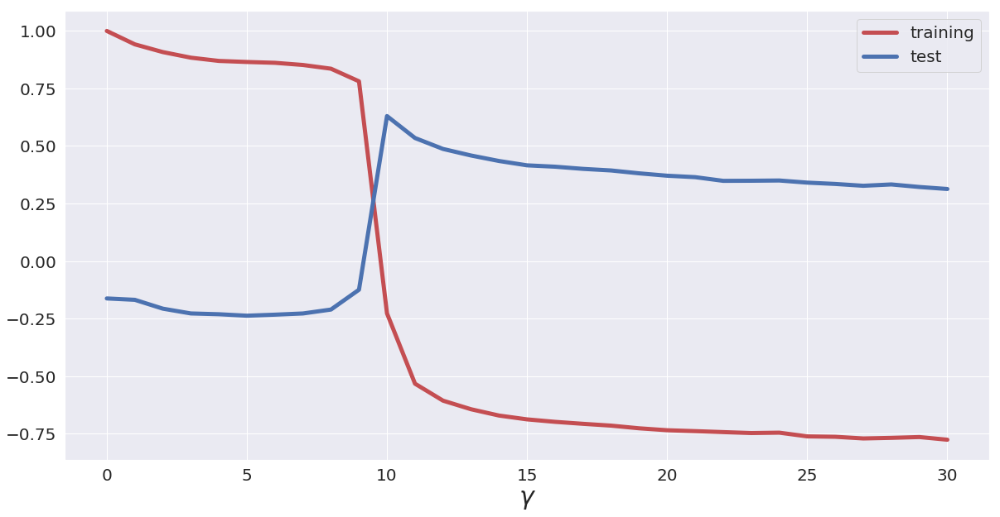

In [285]:
gs = np.linspace(0, 30, 31)
spe_train,spe_test = [],[]
for g in gs:
    m_error = [
        margin_error(margin, lip * g)
        for (margin, lip) in zip(log['margin_train'], log['Lip'])
    ]
    spe_train.append(scipy.stats.stats.kendalltau(m_error, log['train_error'])[0])
    spe_test.append(scipy.stats.stats.kendalltau(m_error, log['test_error'])[0])
print('best g0',gs[np.argmax(spe_test)])
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
#plt.title(r'Training margin error and test error', fontsize=30, y=1.04)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
ax.plot(gs, spe_train,'r',linewidth=5, label='training')
ax.plot(gs, spe_test,'b',linewidth=5, label='test')
ax.set_xlabel(r'$\gamma$',fontdict={'size':30})
#ax.set_ylabel("Spearman's rank correlation",fontdict={'size':30})
ax.legend(loc='upper right',fontsize=20)
fig.savefig('./results_original/ken_rank_corr_1.png')
plt.show()

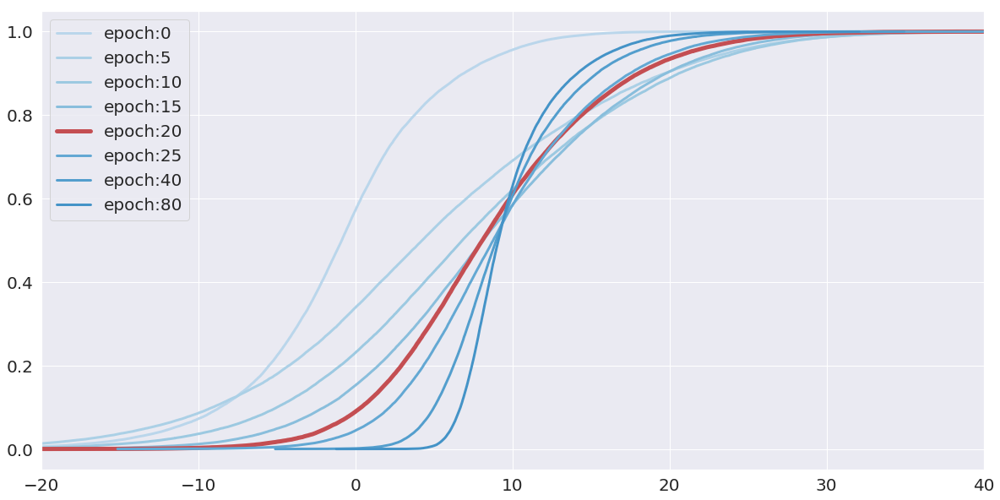

In [111]:
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
#plt.title('Evolutions of normalized margin distributions', fontsize=30, y=1.04)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
for j,i in enumerate([0, 5,10,15,20,25, 40, 80]):
    if i==20:
        c='r'
        d=5
    else:
        c=sbn.color_palette('Blues',20)[j+5]
        d=3
    ax.plot(np.sort(log['margin_train'][i])/log['Lip'][i], np.arange(50000)/50000,c=c, label=f'epoch:{i}',linewidth=d)
ax.plot([9.8,0],[9.8,1],'k--',linewidth=3)
ax.plot([0,0.9],[40,0.9],'k--',linewidth=3)
ax.set_xlim([-20, 40])
ax.set_xticks([-20,-10,0,9.8,20.30.40])
ax.legend(fontsize=20)
fig.savefig('./results_original/'+'nMargin_distribution.png')

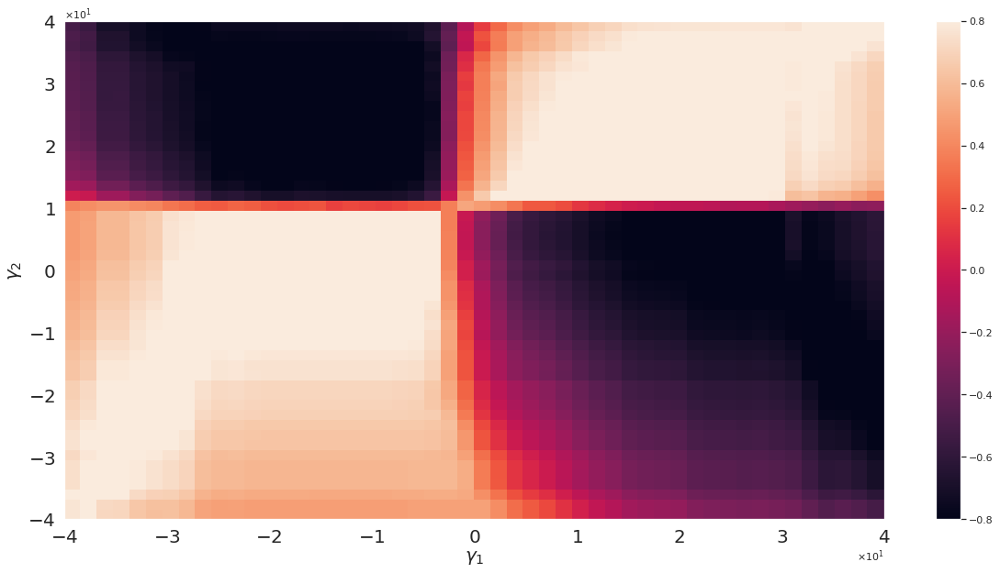

In [273]:
interval=np.linspace(-40,40,51)
n=len(interval)
corr=np.zeros((n,n))
corr_linear=np.zeros((n,n))
for i in range(n):
    g1=interval[i]
    train_merror=[margin_error(margin, lip * g1) for (margin, lip) in zip(log['margin_train'], log['Lip'])]
    for j in range(n):
        g2=interval[j]
        test_merror=[margin_error(margin, lip * g2) for (margin, lip) in zip(log['margin_test'], log['Lip'])]
        corr[i,j]=scipy.stats.spearmanr(train_merror,test_merror)[0]
        corr_linear[i,j]=np.corrcoef(train_merror,test_merror)[0,1]
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
#ax.set_title('channel=%d'%channel)
im=ax.pcolormesh(interval,interval,corr,vmin=-0.8,vmax=0.8)
fig.colorbar(im)
ax.axis('tight')
ax.set_xlabel('$\gamma_{1}$',fontsize=20)
ax.set_ylabel('$\gamma_{2}$',fontsize=20)
from matplotlib import ticker
formatter=ticker.ScalarFormatter(useMathText=True)
formatter.set_scientific(True)
formatter.set_powerlimits((-1,1))
ax.xaxis.set_major_formatter(formatter)
ax.yaxis.set_major_formatter(formatter)
fig.savefig('./results_original/margin_error_rankcorr_2.png')
plt.show()

# The experiment on cifar10 with noise=0.1

In [6]:
# %%
root = './'
lr = 0.01
BATCH_SIZE = 100
weight_decay = 0.
label_mode = 'partially-0.1'
g0 = 20

print(f'****** label mode: {label_mode} ******')

img_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])
(training_dataset, testing_dataset), \
(training_loader, testing_loader) = get_loader(root, BATCH_SIZE, label_mode, img_transforms)

loaders = {'train': training_loader, 'test': testing_loader}

log_1 = {
    'num_params': [],
    'train_loss': [],
    'train_rloss': [],
    'train_error': [],
    'train_margin_error': [],
    'train_ramp_loss': [],
    'test_ramp_loss': [],
    'test_loss': [],
    'test_rloss': [],
    'test_error': [],
    'test_margin_error': [],
    'Lip': [],
    'w0': [],
    'w1': [],
    'w2': [],
    'w3': [],
    'w4': [],
    'w_fc': [],
    'margin_train': [],
    'margin_test': []
}

# %% run the model
num_epochs = 100
channels = 100
# here use with_bn to control batch normalisation
model = basic_cnn.CNN(channels, 10, with_bn=True)

number_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'total parameters: {number_params}')

log_1['num_params'].append(number_params)

if use_gpu:
    model = model.cuda()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=lr, weight_decay=weight_decay)

****** label mode: partially-0.1 ******
total parameters: 365210


In [7]:
model, log_1 = train_model(
    model, criterion, optimizer, log_1, g0, num_epochs=num_epochs)

Epoch 1/100
----------
train1 Loss: 1.6697 rLoss: 4.4401 Error: 0.5582 RampLoss: 0.866487 MarginError: 0.9954 Margin: -6.1448 Lip: 1.0641e-01
test Loss: 1.6883 rLoss: 4.6147 Error: 0.5712 RampLoss: 0.869331 MarginError: 0.9956 Margin: -5.5869 Lip: 1.0641e-01
Saving..
Epoch 2/100
----------
train1 Loss: 1.4704 rLoss: 4.6412 Error: 0.4845 RampLoss: 0.777662 MarginError: 0.9581 Margin: -8.1019 Lip: 1.1512e-01
test Loss: 1.5128 rLoss: 4.9662 Error: 0.5041 RampLoss: 0.790579 MarginError: 0.9614 Margin: -7.3433 Lip: 1.1512e-01
Epoch 3/100
----------
train1 Loss: 1.3427 rLoss: 4.3676 Error: 0.4336 RampLoss: 0.730859 MarginError: 0.9288 Margin: -9.3404 Lip: 1.2600e-01
test Loss: 1.4318 rLoss: 4.9737 Error: 0.4699 RampLoss: 0.754552 MarginError: 0.9371 Margin: -8.8176 Lip: 1.2600e-01
Epoch 4/100
----------
train1 Loss: 1.2273 rLoss: 4.0325 Error: 0.3883 RampLoss: 0.673984 MarginError: 0.8970 Margin: -8.8066 Lip: 1.3438e-01
test Loss: 1.3586 rLoss: 4.9162 Error: 0.4391 RampLoss: 0.708008 MarginE

test Loss: 2.3408 rLoss: 2.9205 Error: 0.4648 RampLoss: 0.823908 MarginError: 0.9960 Margin: -22.2723 Lip: 7.6887e-01
Epoch 33/100
----------
train1 Loss: 0.0948 rLoss: 0.0772 Error: 0.0223 RampLoss: 0.659422 MarginError: 0.9976 Margin: -10.8474 Lip: 7.9309e-01
test Loss: 2.4182 rLoss: 2.9348 Error: 0.4804 RampLoss: 0.838139 MarginError: 0.9961 Margin: -25.0382 Lip: 7.9309e-01
Epoch 34/100
----------
train1 Loss: 0.0819 rLoss: 0.0677 Error: 0.0205 RampLoss: 0.640976 MarginError: 0.9972 Margin: -6.8672 Lip: 8.0324e-01
test Loss: 2.4464 rLoss: 2.9471 Error: 0.4659 RampLoss: 0.826391 MarginError: 0.9963 Margin: -26.5421 Lip: 8.0324e-01
Epoch 35/100
----------
train1 Loss: 0.0706 rLoss: 0.0573 Error: 0.0151 RampLoss: 0.645721 MarginError: 0.9978 Margin: -6.5733 Lip: 8.3099e-01
test Loss: 2.4609 rLoss: 2.8767 Error: 0.4709 RampLoss: 0.832471 MarginError: 0.9974 Margin: -25.0945 Lip: 8.3099e-01
Epoch 36/100
----------
train1 Loss: 0.0540 rLoss: 0.0431 Error: 0.0101 RampLoss: 0.644825 MarginE

train1 Loss: 0.0010 rLoss: 0.0022 Error: 0.0000 RampLoss: 0.600263 MarginError: 0.9991 Margin: 2.3435 Lip: 1.1339e+00
test Loss: 3.0657 rLoss: 2.7460 Error: 0.4686 RampLoss: 0.837333 MarginError: 0.9981 Margin: -32.5681 Lip: 1.1339e+00
Epoch 65/100
----------
train1 Loss: 0.0009 rLoss: 0.0022 Error: 0.0000 RampLoss: 0.601508 MarginError: 0.9993 Margin: 2.1457 Lip: 1.1374e+00
test Loss: 3.0676 rLoss: 2.7401 Error: 0.4666 RampLoss: 0.838152 MarginError: 0.9982 Margin: -33.6248 Lip: 1.1374e+00
Epoch 66/100
----------
train1 Loss: 0.0010 rLoss: 0.0026 Error: 0.0000 RampLoss: 0.605498 MarginError: 0.9993 Margin: 2.7913 Lip: 1.1498e+00
test Loss: 3.0803 rLoss: 2.7260 Error: 0.4701 RampLoss: 0.839042 MarginError: 0.9987 Margin: -34.0835 Lip: 1.1498e+00
Epoch 67/100
----------
train1 Loss: 0.0008 rLoss: 0.0020 Error: 0.0000 RampLoss: 0.596444 MarginError: 0.9992 Margin: 3.3361 Lip: 1.1363e+00
test Loss: 3.0796 rLoss: 2.7528 Error: 0.4672 RampLoss: 0.836244 MarginError: 0.9983 Margin: -33.6364 

train1 Loss: 0.0004 rLoss: 0.0017 Error: 0.0000 RampLoss: 0.595391 MarginError: 0.9993 Margin: 3.4782 Lip: 1.2253e+00
test Loss: 3.2803 rLoss: 2.7411 Error: 0.4705 RampLoss: 0.839026 MarginError: 0.9984 Margin: -34.4048 Lip: 1.2253e+00
Epoch 97/100
----------
train1 Loss: 0.0004 rLoss: 0.0018 Error: 0.0000 RampLoss: 0.600010 MarginError: 0.9994 Margin: 3.6482 Lip: 1.2401e+00
test Loss: 3.2692 rLoss: 2.7044 Error: 0.4678 RampLoss: 0.840591 MarginError: 0.9985 Margin: -34.9365 Lip: 1.2401e+00
Epoch 98/100
----------
train1 Loss: 0.0003 rLoss: 0.0017 Error: 0.0000 RampLoss: 0.598333 MarginError: 0.9994 Margin: 4.1446 Lip: 1.2402e+00
test Loss: 3.2896 rLoss: 2.7203 Error: 0.4717 RampLoss: 0.840682 MarginError: 0.9985 Margin: -35.4344 Lip: 1.2402e+00
Epoch 99/100
----------
train1 Loss: 0.0004 rLoss: 0.0017 Error: 0.0000 RampLoss: 0.597650 MarginError: 0.9994 Margin: 4.2746 Lip: 1.2342e+00
test Loss: 3.2783 rLoss: 2.7221 Error: 0.4714 RampLoss: 0.839953 MarginError: 0.9983 Margin: -34.9141 

In [33]:
import pickle
pickle.dump(log_1,open('./results_p0.1/log_p0.1.log','wb'))

In [88]:
import pickle
log_1=pickle.load(open('./results_p0.1/log_p0.1.log','rb'))

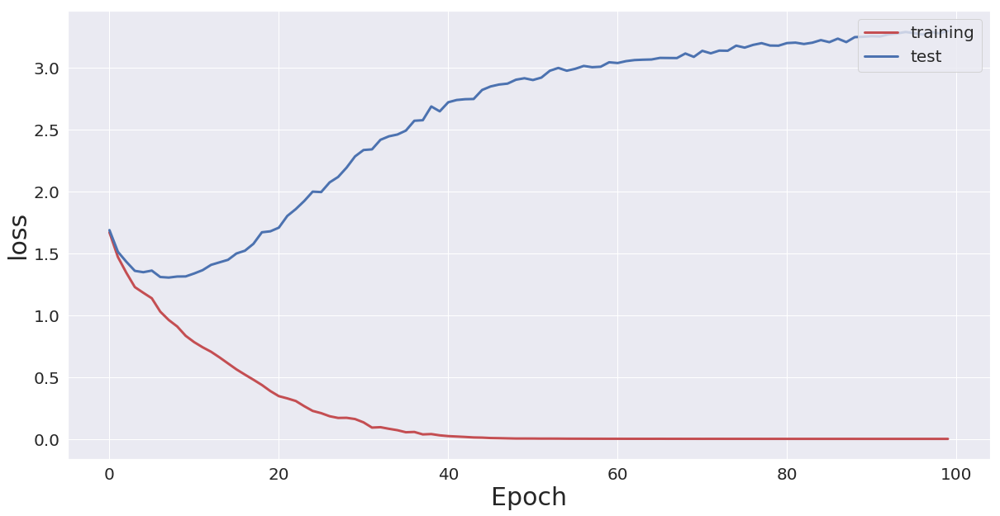

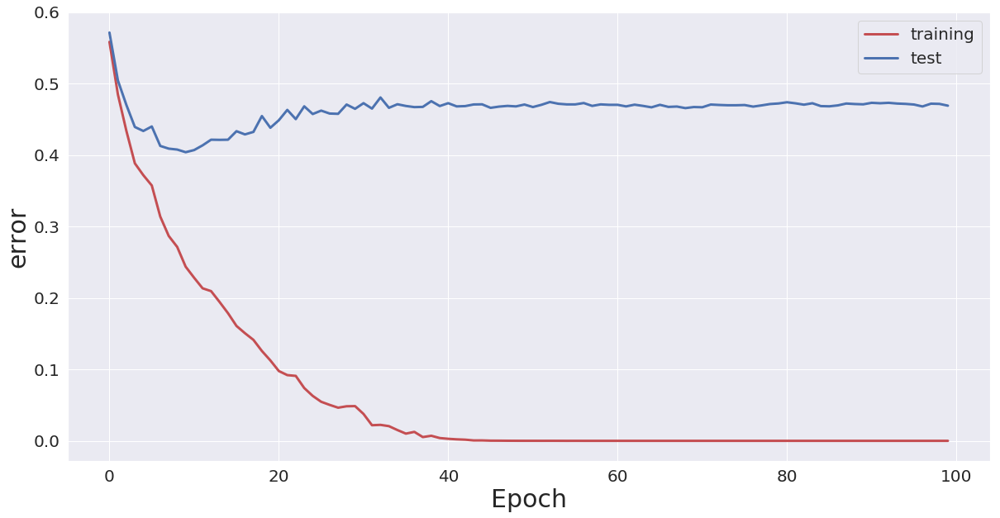

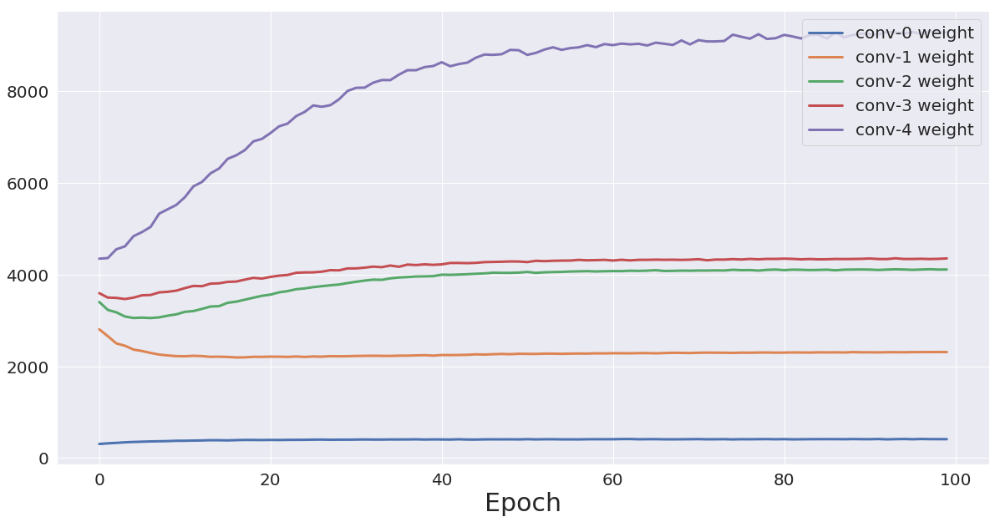

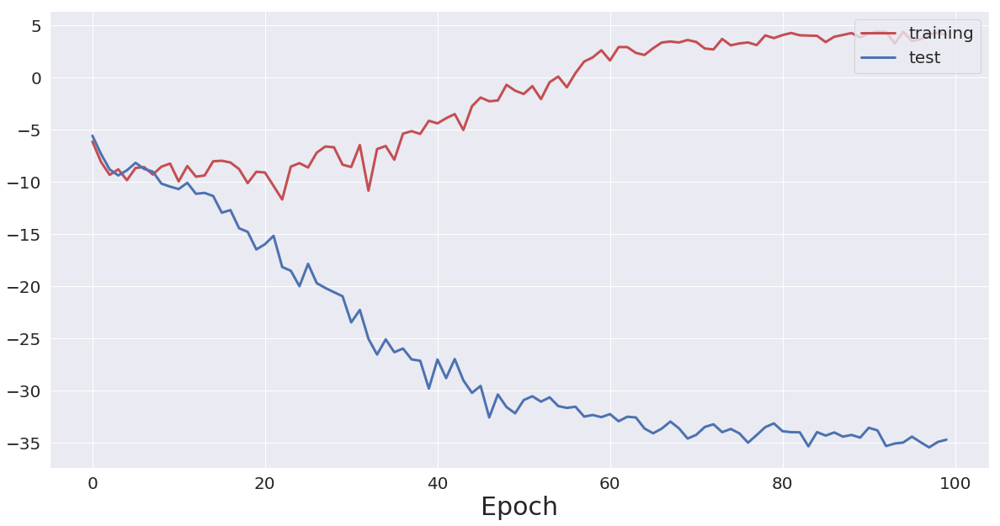

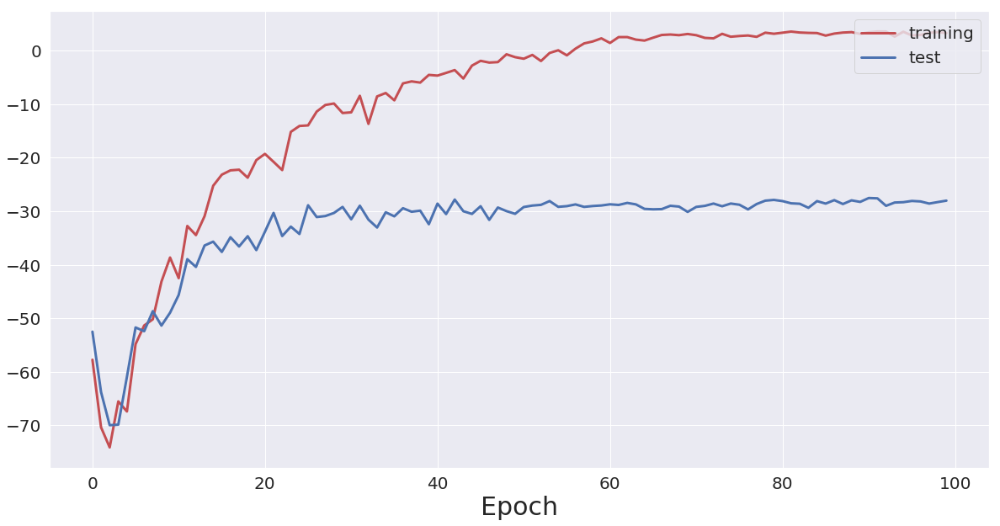

...

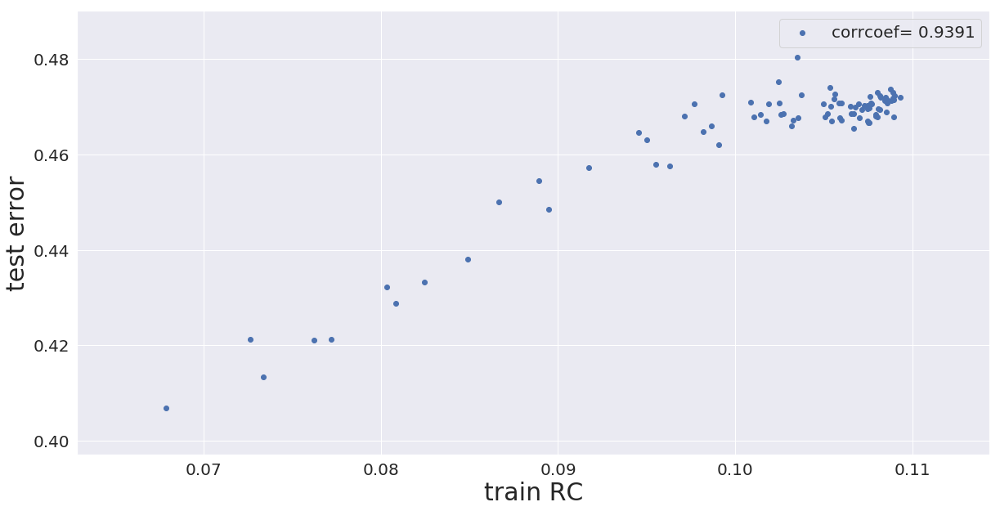

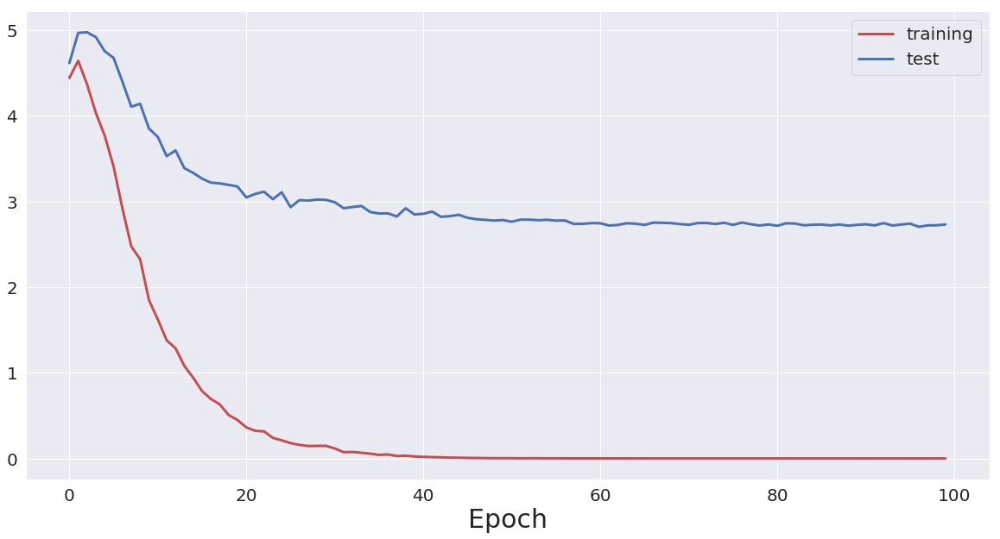

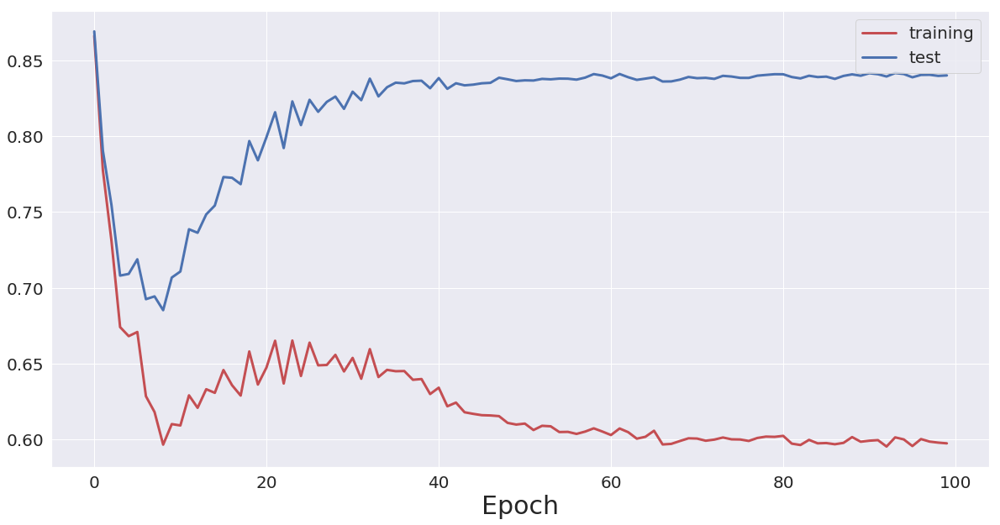

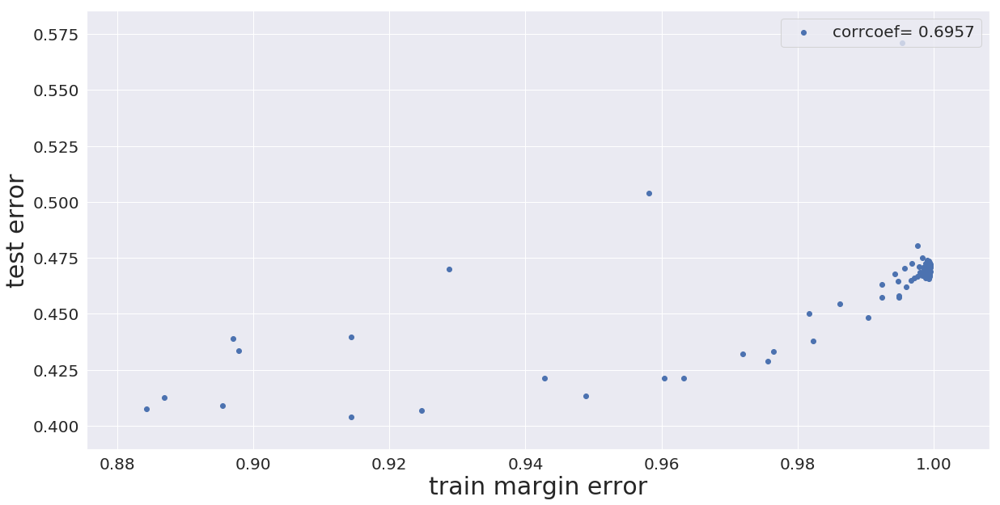

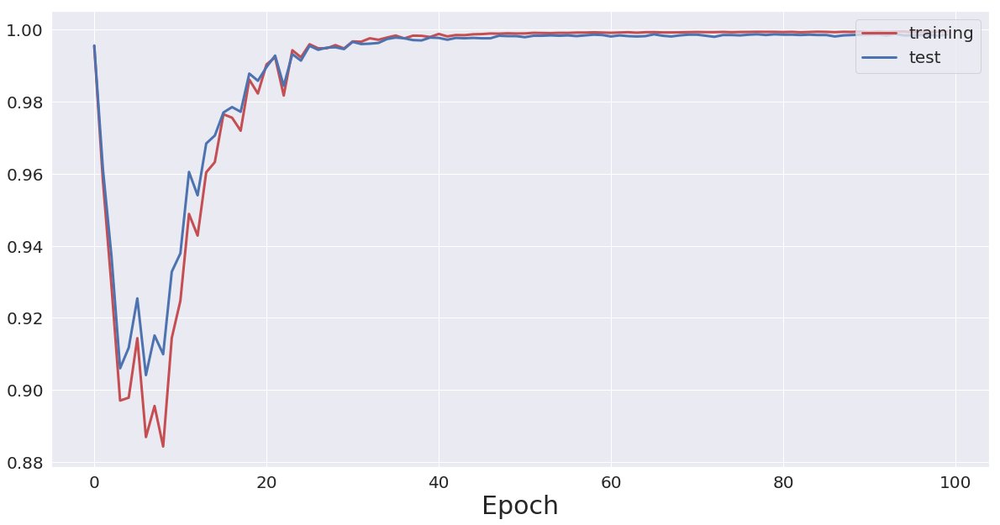

In [91]:
plot(log_1, 0.8, './results_p0.1/')
plt.show()

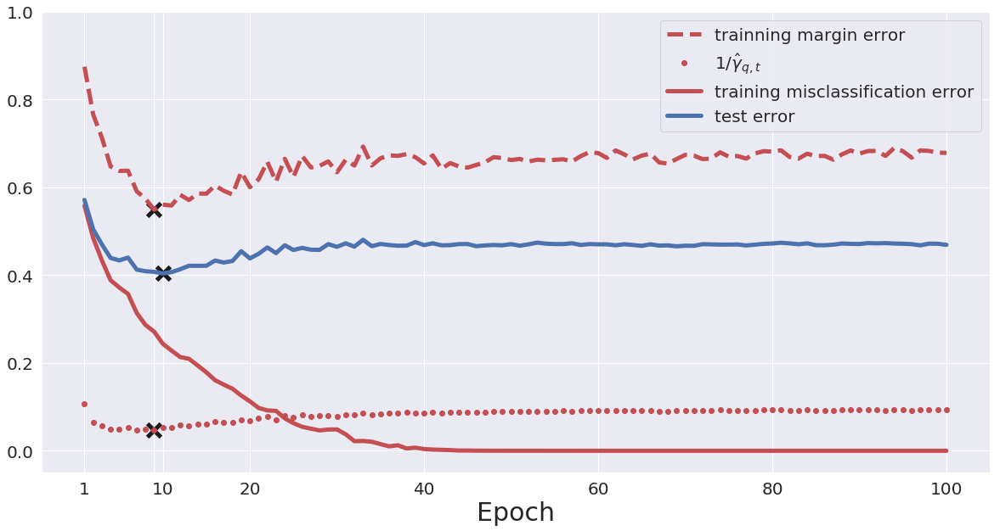

In [169]:
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

train_merror=[margin_error(margin, lip * 8.3) for (margin, lip) in zip(log_1['margin_train'], log_1['Lip'])]
nqMargin_train = np.array(get_qmargin(log_1['margin_train'],
                                                 0.9)) / np.array(log_1['Lip'])

ax.plot(train_merror,'r--',linewidth=5,
    label='trainning margin error')
ax.plot(1/nqMargin_train,'ro', linewidth=5, label=r'$1/\hat{\gamma}_{q,t}$')
ax.plot(log_1['train_error'],'r',linewidth=5,label='training misclassification error')

ax.plot(log_1['test_error'],'b',linewidth=5,label='test error')
ax.legend(fontsize=20,loc='upper right')
#ax.set_xlim(0,100)
ax.set_ylim(-0.05,1)
x1=np.argmin(log_1['test_error'])
ax.scatter(x1,log_1['test_error'][x1],s=250,c='k',marker='x',linewidth=5)
x2=np.argmin(train_merror)
ax.scatter(x2,train_merror[x2],s=250,c='k',marker='x',linewidth=5)
x3=np.argmin(1/nqMargin_train)
ax.scatter(x3,1/nqMargin_train[x3],s=250,c='k',marker='x',linewidth=5)

ax.set_xticks([0,x1,x2,x3,19,39,59,79,99])
ax.set_xticklabels([1,x1+1,'','',20,40,60,80,100])
ax.set_xlabel('Epoch',fontdict={'size': 30})
plt.savefig('./results_p0.1/margin_error_and_test_error.png')

best q  0.7000000000000001


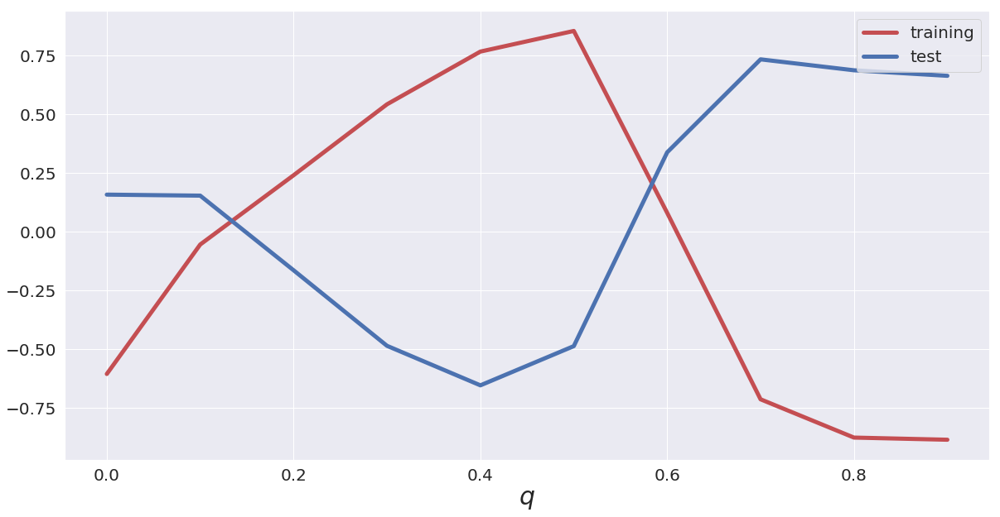

In [98]:
spe_train,spe_test = [],[]
qs = np.linspace(0., 0.9, 10)
for q in qs:
    nqMargin_train = np.array(get_qmargin(log_1['margin_train'], q)) / np.array(
        log_1['Lip'])
    spe_test.append(
        scipy.stats.stats.spearmanr(1/nqMargin_train, log_1['test_error'])[0])
    spe_train.append(
        scipy.stats.stats.spearmanr(1/nqMargin_train, log_1['train_error'])[0])
print('best q ',qs[np.argmax(spe_test)])
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
#plt.title(r'$1/\hat{\rho}_{q}$ and test error', fontsize=30, y=1.04)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
ax.plot(qs, spe_train,'r',linewidth=5, label='training')
ax.plot(qs, spe_test,'b',linewidth=5, label='test')
ax.set_xlabel(r'$q$',fontdict={'size':30})
#ax.set_ylabel("Speraman's rank Correlation",fontdict={'size':30})
ax.legend(loc='upper right',fontsize=20)
fig.savefig('./results_p0.1/rank_corr.png')
plt.show()

best g0 9.0


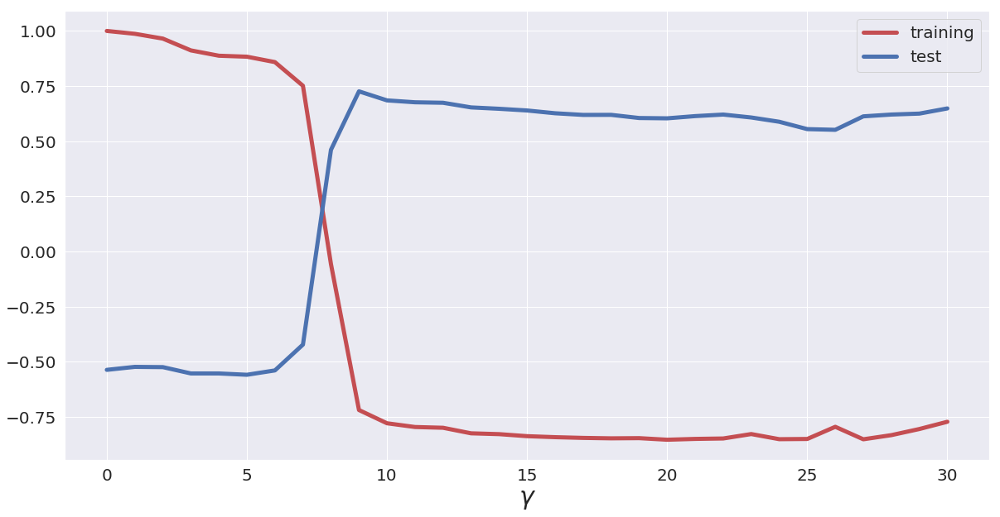

In [99]:
gs = np.linspace(0, 30, 31)
spe_train,spe_test = [],[]
for g in gs:
    m_error = [
        margin_error(margin, lip * g)
        for (margin, lip) in zip(log_1['margin_train'], log_1['Lip'])
    ]
    spe_train.append(scipy.stats.stats.kendalltau(m_error, log_1['train_error'])[0])
    spe_test.append(scipy.stats.stats.spearmanr(m_error, log_1['test_error'])[0])
print('best g0',gs[np.argmax(spe_test)])
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
#plt.title(r'Training margin error and test error', fontsize=30, y=1.04)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
ax.plot(gs, spe_train,'r',linewidth=5, label='training')
ax.plot(gs, spe_test,'b',linewidth=5, label='test')
ax.set_xlabel(r'$\gamma$',fontdict={'size':30})
#ax.set_ylabel("Spearman's rank correlation",fontdict={'size':30})
ax.legend(loc='upper right',fontsize=20)
fig.savefig('./results_p0.1/rank_corr_1.png')
plt.show()

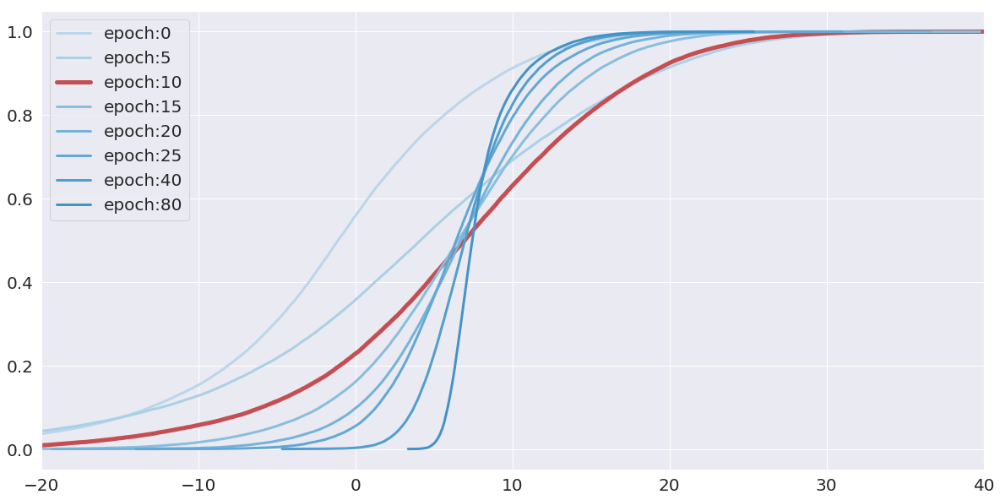

In [112]:
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
#plt.title('Evolutions of normalized margin distributions (noise=0.1)', fontsize=30, y=1.04)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
for j,i in enumerate([0, 5, 10,15,20,25, 40, 80]):
    if i==10:
        c='r'
        d=5
    else:
        c=sbn.color_palette('Blues',20)[j+5]
        d=3
    ax.plot(np.sort(log_1['margin_train'][i])/log_1['Lip'][i], np.arange(50000)/50000,c=c, label=f'epoch:{i}',linewidth=d)
ax.set_xlim([-20, 40])
ax.legend(fontsize=20)
fig.savefig('./results_p0.1/nMargin_distribution.png')

## Experiments on CIFAR10 with noise=0.1 for channel=50~400

****** label mode: partially-0.1 ******
total parameters: 92610
Epoch 1/100
----------
train1 Loss: 1.8236 rLoss: 445.2464 Error: 0.6170 RampLoss: 0.623700 MarginError: 0.6299 Margin: -5.8870 Lip: 9.0825e-04
test Loss: 1.8269 rLoss: 450.6997 Error: 0.6156 RampLoss: 0.622628 MarginError: 0.6294 Margin: -4.5747 Lip: 9.0825e-04
Saving..
Epoch 2/100
----------


/home/yhuangcc/.conda/envs/pytorch/lib/python3.6/site-packages/torch/serialization.py:193: UserWarning: Couldn't retrieve source code for container of type CNN. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


train1 Loss: 1.6308 rLoss: 514.3418 Error: 0.5493 RampLoss: 0.554014 MarginError: 0.5585 Margin: -8.3789 Lip: 9.6415e-04
test Loss: 1.6475 rLoss: 535.3276 Error: 0.5581 RampLoss: 0.563584 MarginError: 0.5692 Margin: -6.5510 Lip: 9.6415e-04
Epoch 3/100
----------
train1 Loss: 1.4930 rLoss: 530.2508 Error: 0.4975 RampLoss: 0.501018 MarginError: 0.5048 Margin: -8.0742 Lip: 1.0300e-03
test Loss: 1.5366 rLoss: 571.3524 Error: 0.5158 RampLoss: 0.519108 MarginError: 0.5228 Margin: -7.5279 Lip: 1.0300e-03
Epoch 4/100
----------
train1 Loss: 1.4079 rLoss: 522.2853 Error: 0.4592 RampLoss: 0.462284 MarginError: 0.4652 Margin: -8.1377 Lip: 1.0846e-03
test Loss: 1.4686 rLoss: 575.8670 Error: 0.4915 RampLoss: 0.493519 MarginError: 0.4959 Margin: -8.1155 Lip: 1.0846e-03
Epoch 5/100
----------
train1 Loss: 1.3787 rLoss: 467.3069 Error: 0.4495 RampLoss: 0.452581 MarginError: 0.4557 Margin: -7.9270 Lip: 1.1541e-03
test Loss: 1.4566 rLoss: 530.7925 Error: 0.4823 RampLoss: 0.485453 MarginError: 0.4888 Mar

train1 Loss: 0.6218 rLoss: 60.2864 Error: 0.1810 RampLoss: 0.186108 MarginError: 0.1912 Margin: -9.0234 Lip: 4.9231e-03
test Loss: 1.5771 rLoss: 242.0203 Error: 0.4411 RampLoss: 0.447797 MarginError: 0.4535 Margin: -13.9939 Lip: 4.9231e-03
Epoch 34/100
----------
train1 Loss: 0.6126 rLoss: 58.0196 Error: 0.1782 RampLoss: 0.183805 MarginError: 0.1893 Margin: -8.4132 Lip: 5.0836e-03
test Loss: 1.5783 rLoss: 235.4556 Error: 0.4347 RampLoss: 0.440366 MarginError: 0.4463 Margin: -14.5925 Lip: 5.0836e-03
Epoch 35/100
----------
train1 Loss: 0.6025 rLoss: 56.3283 Error: 0.1787 RampLoss: 0.183734 MarginError: 0.1893 Margin: -10.6261 Lip: 5.3325e-03
test Loss: 1.5975 rLoss: 231.6575 Error: 0.4331 RampLoss: 0.438333 MarginError: 0.4431 Margin: -14.7669 Lip: 5.3325e-03
Epoch 36/100
----------
train1 Loss: 0.5795 rLoss: 50.4603 Error: 0.1692 RampLoss: 0.174194 MarginError: 0.1794 Margin: -9.0145 Lip: 5.4144e-03
test Loss: 1.6204 rLoss: 230.6707 Error: 0.4409 RampLoss: 0.446617 MarginError: 0.4519 

train1 Loss: 0.2912 rLoss: 9.9204 Error: 0.0867 RampLoss: 0.093582 MarginError: 0.1012 Margin: -8.2086 Lip: 1.2327e-02
test Loss: 2.2273 rLoss: 159.5766 Error: 0.4664 RampLoss: 0.477611 MarginError: 0.4891 Margin: -22.9730 Lip: 1.2327e-02
Epoch 65/100
----------
train1 Loss: 0.2719 rLoss: 8.9982 Error: 0.0773 RampLoss: 0.084272 MarginError: 0.0913 Margin: -9.9947 Lip: 1.2440e-02
test Loss: 2.2673 rLoss: 161.9517 Error: 0.4702 RampLoss: 0.479299 MarginError: 0.4867 Margin: -22.3655 Lip: 1.2440e-02
Epoch 66/100
----------
train1 Loss: 0.3023 rLoss: 10.5799 Error: 0.0912 RampLoss: 0.098949 MarginError: 0.1071 Margin: -10.1048 Lip: 1.2488e-02
test Loss: 2.3164 rLoss: 164.9293 Error: 0.4761 RampLoss: 0.485787 MarginError: 0.4944 Margin: -22.9570 Lip: 1.2488e-02
Epoch 67/100
----------
train1 Loss: 0.2669 rLoss: 7.9604 Error: 0.0758 RampLoss: 0.083710 MarginError: 0.0915 Margin: -9.5243 Lip: 1.2943e-02
test Loss: 2.3101 rLoss: 158.5855 Error: 0.4741 RampLoss: 0.483556 MarginError: 0.4931 Mar

test Loss: 2.9669 rLoss: 138.6653 Error: 0.4938 RampLoss: 0.503766 MarginError: 0.5144 Margin: -29.2099 Lip: 1.9971e-02
Epoch 96/100
----------
train1 Loss: 0.1441 rLoss: 2.4228 Error: 0.0405 RampLoss: 0.047447 MarginError: 0.0551 Margin: -9.2466 Lip: 2.0163e-02
test Loss: 2.9891 rLoss: 138.5254 Error: 0.4888 RampLoss: 0.500146 MarginError: 0.5113 Margin: -30.9783 Lip: 2.0163e-02
Epoch 97/100
----------
train1 Loss: 0.1340 rLoss: 2.0118 Error: 0.0359 RampLoss: 0.043018 MarginError: 0.0501 Margin: -7.3976 Lip: 2.0294e-02
test Loss: 2.9870 rLoss: 137.5200 Error: 0.4901 RampLoss: 0.501822 MarginError: 0.5124 Margin: -31.8071 Lip: 2.0294e-02
Epoch 98/100
----------
train1 Loss: 0.1335 rLoss: 2.0750 Error: 0.0364 RampLoss: 0.042753 MarginError: 0.0498 Margin: -8.2132 Lip: 2.0610e-02
test Loss: 2.9918 rLoss: 135.8782 Error: 0.4886 RampLoss: 0.499926 MarginError: 0.5109 Margin: -30.5540 Lip: 2.0610e-02
Epoch 99/100
----------
train1 Loss: 0.1432 rLoss: 2.5107 Error: 0.0414 RampLoss: 0.048896 

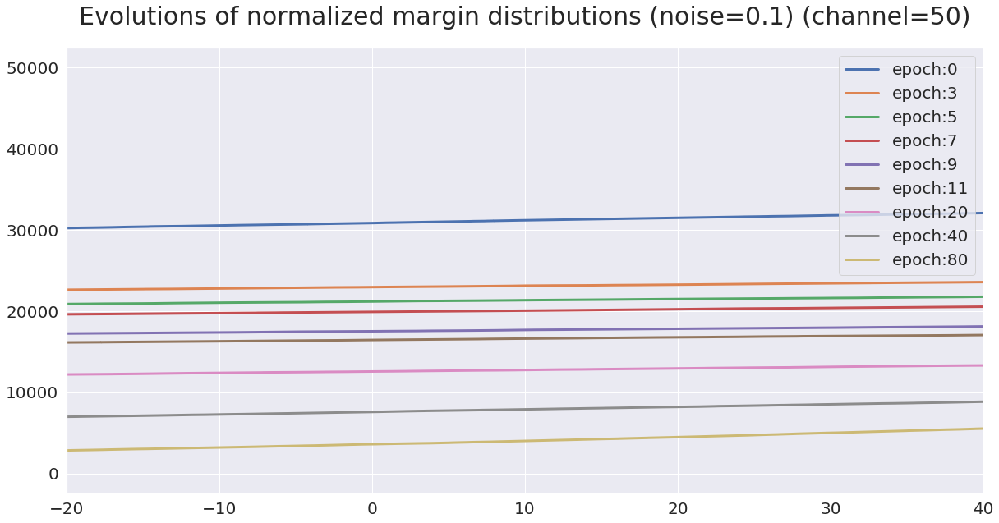

total parameters: 365210
Epoch 1/100
----------
train1 Loss: 1.6618 rLoss: 4.3518 Error: 0.5586 RampLoss: 0.870406 MarginError: 0.9954 Margin: -7.0467 Lip: 1.1751e-01
test Loss: 1.6748 rLoss: 4.4605 Error: 0.5637 RampLoss: 0.871446 MarginError: 0.9954 Margin: -5.9706 Lip: 1.1751e-01
Saving..
Epoch 2/100
----------
train1 Loss: 1.4697 rLoss: 4.1901 Error: 0.4784 RampLoss: 0.804419 MarginError: 0.9816 Margin: -6.3301 Lip: 1.2469e-01
test Loss: 1.5198 rLoss: 4.5771 Error: 0.5027 RampLoss: 0.815450 MarginError: 0.9829 Margin: -6.5382 Lip: 1.2469e-01
Epoch 3/100
----------
train1 Loss: 1.3704 rLoss: 4.6158 Error: 0.4502 RampLoss: 0.734339 MarginError: 0.9334 Margin: -7.4637 Lip: 1.3656e-01
test Loss: 1.4629 rLoss: 5.2515 Error: 0.4859 RampLoss: 0.755092 MarginError: 0.9385 Margin: -8.6967 Lip: 1.3656e-01
Epoch 4/100
----------
train1 Loss: 1.2638 rLoss: 3.8240 Error: 0.4019 RampLoss: 0.716858 MarginError: 0.9399 Margin: -7.7027 Lip: 1.4402e-01
test Loss: 1.4060 rLoss: 4.7060 Error: 0.4554 R

test Loss: 2.3853 rLoss: 2.9666 Error: 0.4789 RampLoss: 0.838168 MarginError: 0.9990 Margin: -20.8788 Lip: 7.6991e-01
Epoch 33/100
----------
train1 Loss: 0.0919 rLoss: 0.0755 Error: 0.0219 RampLoss: 0.647100 MarginError: 0.9972 Margin: -6.2028 Lip: 7.8846e-01
test Loss: 2.4289 rLoss: 2.9722 Error: 0.4608 RampLoss: 0.827210 MarginError: 0.9974 Margin: -22.8202 Lip: 7.8846e-01
Epoch 34/100
----------
train1 Loss: 0.0828 rLoss: 0.0688 Error: 0.0198 RampLoss: 0.657396 MarginError: 0.9986 Margin: -5.2372 Lip: 8.2044e-01
test Loss: 2.4892 rLoss: 2.9436 Error: 0.4732 RampLoss: 0.837188 MarginError: 0.9987 Margin: -26.0496 Lip: 8.2044e-01
Epoch 35/100
----------
train1 Loss: 0.0895 rLoss: 0.0772 Error: 0.0232 RampLoss: 0.653654 MarginError: 0.9977 Margin: -6.7884 Lip: 8.2865e-01
test Loss: 2.5260 rLoss: 2.9639 Error: 0.4699 RampLoss: 0.832560 MarginError: 0.9976 Margin: -23.3221 Lip: 8.2865e-01
Epoch 36/100
----------
train1 Loss: 0.0635 rLoss: 0.0529 Error: 0.0143 RampLoss: 0.641187 MarginEr

train1 Loss: 0.0010 rLoss: 0.0021 Error: 0.0000 RampLoss: 0.594547 MarginError: 0.9991 Margin: -0.1252 Lip: 1.1288e+00
test Loss: 3.1304 rLoss: 2.8125 Error: 0.4647 RampLoss: 0.833598 MarginError: 0.9991 Margin: -29.6418 Lip: 1.1288e+00
Epoch 65/100
----------
train1 Loss: 0.0010 rLoss: 0.0023 Error: 0.0000 RampLoss: 0.597758 MarginError: 0.9994 Margin: -1.7474 Lip: 1.1454e+00
test Loss: 3.1469 rLoss: 2.7914 Error: 0.4665 RampLoss: 0.835565 MarginError: 0.9992 Margin: -29.3117 Lip: 1.1454e+00
Epoch 66/100
----------
train1 Loss: 0.0009 rLoss: 0.0020 Error: 0.0000 RampLoss: 0.593397 MarginError: 0.9992 Margin: 2.7569 Lip: 1.1345e+00
test Loss: 3.1505 rLoss: 2.8174 Error: 0.4636 RampLoss: 0.833299 MarginError: 0.9988 Margin: -30.0204 Lip: 1.1345e+00
Epoch 67/100
----------
train1 Loss: 0.0009 rLoss: 0.0022 Error: 0.0000 RampLoss: 0.596960 MarginError: 0.9993 Margin: 3.2683 Lip: 1.1355e+00
test Loss: 3.1544 rLoss: 2.8190 Error: 0.4683 RampLoss: 0.835067 MarginError: 0.9989 Margin: -29.361

train1 Loss: 0.0003 rLoss: 0.0016 Error: 0.0000 RampLoss: 0.592032 MarginError: 0.9995 Margin: 4.3015 Lip: 1.2248e+00
test Loss: 3.3424 rLoss: 2.7904 Error: 0.4694 RampLoss: 0.837037 MarginError: 0.9994 Margin: -30.7149 Lip: 1.2248e+00
Epoch 97/100
----------
train1 Loss: 0.0004 rLoss: 0.0016 Error: 0.0000 RampLoss: 0.591616 MarginError: 0.9994 Margin: 4.5946 Lip: 1.2168e+00
test Loss: 3.3255 rLoss: 2.7932 Error: 0.4680 RampLoss: 0.836969 MarginError: 0.9991 Margin: -30.8482 Lip: 1.2168e+00
Epoch 98/100
----------
train1 Loss: 0.0004 rLoss: 0.0018 Error: 0.0000 RampLoss: 0.593808 MarginError: 0.9994 Margin: 3.1982 Lip: 1.2196e+00
test Loss: 3.3585 rLoss: 2.8148 Error: 0.4738 RampLoss: 0.837872 MarginError: 0.9992 Margin: -30.9823 Lip: 1.2196e+00
Epoch 99/100
----------
train1 Loss: 0.0004 rLoss: 0.0017 Error: 0.0000 RampLoss: 0.593451 MarginError: 0.9995 Margin: 4.3650 Lip: 1.2339e+00
test Loss: 3.3616 rLoss: 2.7880 Error: 0.4687 RampLoss: 0.837278 MarginError: 0.9993 Margin: -28.9517 

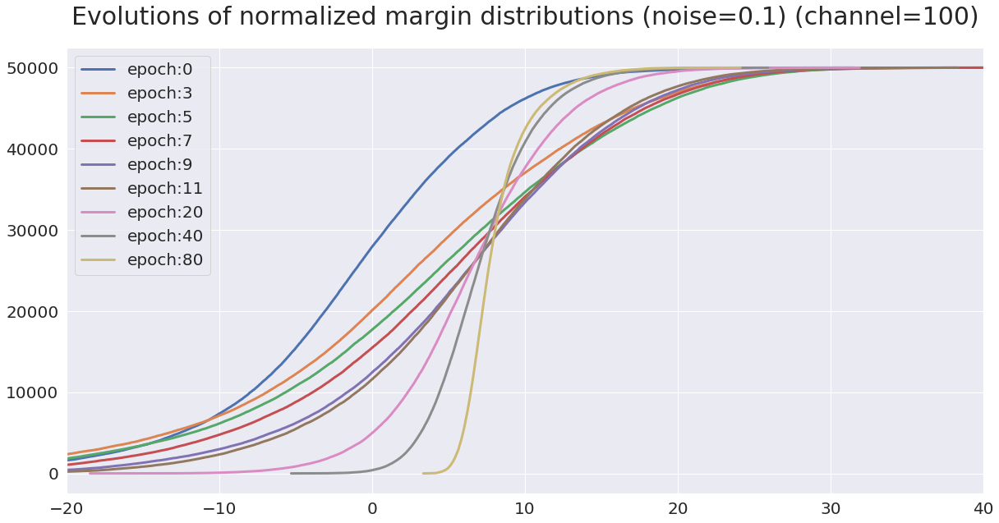

total parameters: 817810
Epoch 1/100
----------
train1 Loss: 1.6108 rLoss: 1.7962 Error: 0.5412 RampLoss: 0.990146 MarginError: 1.0000 Margin: -8.2593 Lip: 1.9116e+00
test Loss: 1.6297 rLoss: 1.8065 Error: 0.5505 RampLoss: 0.990406 MarginError: 1.0000 Margin: -7.5574 Lip: 1.9116e+00
Saving..
Epoch 2/100
----------
train1 Loss: 1.3832 rLoss: 1.6422 Error: 0.4446 RampLoss: 0.983851 MarginError: 1.0000 Margin: -7.9654 Lip: 2.0370e+00
test Loss: 1.4565 rLoss: 1.6799 Error: 0.4832 RampLoss: 0.985061 MarginError: 1.0000 Margin: -7.4413 Lip: 2.0370e+00
Epoch 3/100
----------
train1 Loss: 1.2723 rLoss: 1.5804 Error: 0.3972 RampLoss: 0.980713 MarginError: 1.0000 Margin: -7.8144 Lip: 2.1182e+00
test Loss: 1.3982 rLoss: 1.6437 Error: 0.4553 RampLoss: 0.982827 MarginError: 1.0000 Margin: -8.2607 Lip: 2.1182e+00
Epoch 4/100
----------
train1 Loss: 1.1206 rLoss: 1.4888 Error: 0.3434 RampLoss: 0.975459 MarginError: 1.0000 Margin: -8.4112 Lip: 2.3070e+00
test Loss: 1.3189 rLoss: 1.5833 Error: 0.4200 R

test Loss: 2.4428 rLoss: 1.8504 Error: 0.4454 RampLoss: 0.984592 MarginError: 1.0000 Margin: -23.5977 Lip: 1.0007e+01
Epoch 33/100
----------
train1 Loss: 0.0021 rLoss: 1.4092 Error: 0.0000 RampLoss: 0.960760 MarginError: 1.0000 Margin: -3.7230 Lip: 1.0195e+01
test Loss: 2.4709 rLoss: 1.8480 Error: 0.4423 RampLoss: 0.984380 MarginError: 1.0000 Margin: -23.9572 Lip: 1.0195e+01
Epoch 34/100
----------
train1 Loss: 0.0019 rLoss: 1.4027 Error: 0.0000 RampLoss: 0.960373 MarginError: 1.0000 Margin: 2.3638 Lip: 1.0134e+01
test Loss: 2.4765 rLoss: 1.8467 Error: 0.4433 RampLoss: 0.984316 MarginError: 1.0000 Margin: -23.8336 Lip: 1.0134e+01
Epoch 35/100
----------
train1 Loss: 0.0017 rLoss: 1.4082 Error: 0.0000 RampLoss: 0.960605 MarginError: 1.0000 Margin: 2.3295 Lip: 1.0266e+01
test Loss: 2.4921 rLoss: 1.8511 Error: 0.4463 RampLoss: 0.984496 MarginError: 1.0000 Margin: -25.1834 Lip: 1.0266e+01
Epoch 36/100
----------
train1 Loss: 0.0017 rLoss: 1.4042 Error: 0.0000 RampLoss: 0.960455 MarginErro

train1 Loss: 0.0005 rLoss: 1.4069 Error: 0.0000 RampLoss: 0.959625 MarginError: 1.0000 Margin: 4.4744 Lip: 1.1445e+01
test Loss: 2.7379 rLoss: 1.8574 Error: 0.4478 RampLoss: 0.984492 MarginError: 1.0000 Margin: -25.8320 Lip: 1.1445e+01
Epoch 65/100
----------
train1 Loss: 0.0005 rLoss: 1.4067 Error: 0.0000 RampLoss: 0.959515 MarginError: 1.0000 Margin: 3.9006 Lip: 1.1469e+01
test Loss: 2.7314 rLoss: 1.8579 Error: 0.4485 RampLoss: 0.984503 MarginError: 1.0000 Margin: -26.0620 Lip: 1.1469e+01
Epoch 66/100
----------
train1 Loss: 0.0004 rLoss: 1.4042 Error: 0.0000 RampLoss: 0.959312 MarginError: 1.0000 Margin: 3.7341 Lip: 1.1536e+01
test Loss: 2.7507 rLoss: 1.8566 Error: 0.4494 RampLoss: 0.984411 MarginError: 1.0000 Margin: -26.2177 Lip: 1.1536e+01
Epoch 67/100
----------
train1 Loss: 0.0004 rLoss: 1.3996 Error: 0.0000 RampLoss: 0.959124 MarginError: 1.0000 Margin: 4.3573 Lip: 1.1416e+01
test Loss: 2.7379 rLoss: 1.8541 Error: 0.4459 RampLoss: 0.984367 MarginError: 1.0000 Margin: -26.1125 

train1 Loss: 0.0002 rLoss: 1.4032 Error: 0.0000 RampLoss: 0.958851 MarginError: 1.0000 Margin: 5.5755 Lip: 1.2019e+01
test Loss: 2.8540 rLoss: 1.8602 Error: 0.4488 RampLoss: 0.984437 MarginError: 1.0000 Margin: -27.6000 Lip: 1.2019e+01
Epoch 97/100
----------
train1 Loss: 0.0002 rLoss: 1.3950 Error: 0.0000 RampLoss: 0.958471 MarginError: 1.0000 Margin: 5.5233 Lip: 1.1902e+01
test Loss: 2.8563 rLoss: 1.8559 Error: 0.4484 RampLoss: 0.984314 MarginError: 1.0000 Margin: -27.7721 Lip: 1.1902e+01
Epoch 98/100
----------
train1 Loss: 0.0002 rLoss: 1.4028 Error: 0.0000 RampLoss: 0.958794 MarginError: 1.0000 Margin: 5.3210 Lip: 1.2034e+01
test Loss: 2.8459 rLoss: 1.8588 Error: 0.4476 RampLoss: 0.984377 MarginError: 1.0000 Margin: -27.5807 Lip: 1.2034e+01
Epoch 99/100
----------
train1 Loss: 0.0002 rLoss: 1.4072 Error: 0.0000 RampLoss: 0.959007 MarginError: 1.0000 Margin: 5.6072 Lip: 1.2096e+01
test Loss: 2.8607 rLoss: 1.8627 Error: 0.4484 RampLoss: 0.984556 MarginError: 1.0000 Margin: -27.9329 

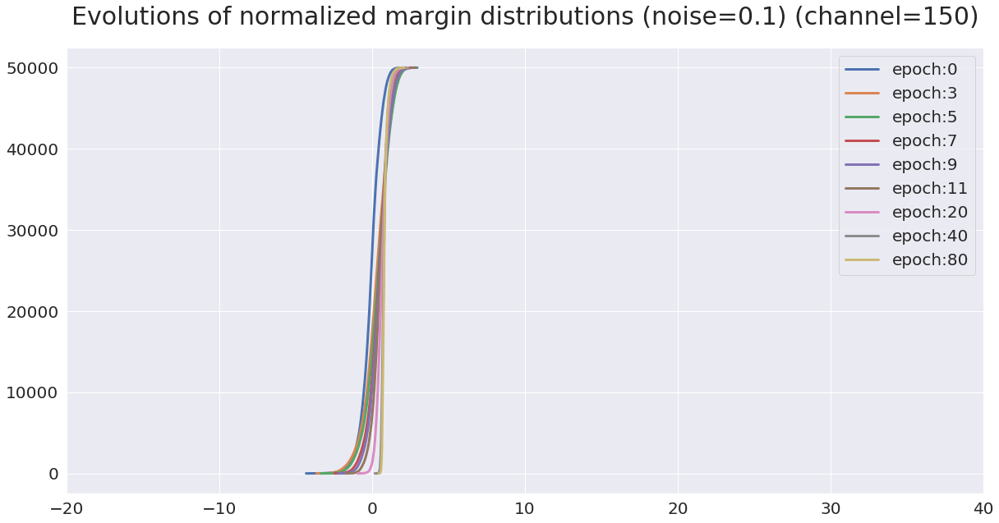

total parameters: 1450410
Epoch 1/100
----------
train1 Loss: 1.5558 rLoss: 2.1921 Error: 0.5195 RampLoss: 0.998200 MarginError: 1.0000 Margin: -10.6296 Lip: 1.3889e+01
test Loss: 1.5924 rLoss: 2.1948 Error: 0.5348 RampLoss: 0.998280 MarginError: 1.0000 Margin: -9.0449 Lip: 1.3889e+01
Saving..
Epoch 2/100
----------
train1 Loss: 1.3157 rLoss: 2.1743 Error: 0.4232 RampLoss: 0.997349 MarginError: 1.0000 Margin: -8.2051 Lip: 1.4699e+01
test Loss: 1.4235 rLoss: 2.1820 Error: 0.4627 RampLoss: 0.997594 MarginError: 1.0000 Margin: -9.4225 Lip: 1.4699e+01
Epoch 3/100
----------
train1 Loss: 1.1681 rLoss: 2.1646 Error: 0.3619 RampLoss: 0.996830 MarginError: 1.0000 Margin: -8.4329 Lip: 1.6128e+01
test Loss: 1.3540 rLoss: 2.1774 Error: 0.4361 RampLoss: 0.997283 MarginError: 1.0000 Margin: -9.2551 Lip: 1.6128e+01
Epoch 4/100
----------
train1 Loss: 1.0992 rLoss: 2.1581 Error: 0.3413 RampLoss: 0.996400 MarginError: 1.0000 Margin: -8.8837 Lip: 1.7143e+01
test Loss: 1.3705 rLoss: 2.1762 Error: 0.4366

test Loss: 2.3787 rLoss: 2.2150 Error: 0.4462 RampLoss: 0.997270 MarginError: 1.0000 Margin: -22.6983 Lip: 5.7131e+01
Epoch 33/100
----------
train1 Loss: 0.0013 rLoss: 2.1286 Error: 0.0000 RampLoss: 0.992724 MarginError: 1.0000 Margin: 3.5548 Lip: 5.6471e+01
test Loss: 2.3890 rLoss: 2.2139 Error: 0.4458 RampLoss: 0.997240 MarginError: 1.0000 Margin: -22.6490 Lip: 5.6471e+01
Epoch 34/100
----------
train1 Loss: 0.0012 rLoss: 2.1287 Error: 0.0000 RampLoss: 0.992703 MarginError: 1.0000 Margin: 4.1230 Lip: 5.6575e+01
test Loss: 2.3864 rLoss: 2.2140 Error: 0.4436 RampLoss: 0.997242 MarginError: 1.0000 Margin: -22.8544 Lip: 5.6575e+01
Epoch 35/100
----------
train1 Loss: 0.0011 rLoss: 2.1304 Error: 0.0000 RampLoss: 0.992756 MarginError: 1.0000 Margin: 3.8615 Lip: 5.7734e+01
test Loss: 2.4093 rLoss: 2.2153 Error: 0.4462 RampLoss: 0.997270 MarginError: 1.0000 Margin: -22.6736 Lip: 5.7734e+01
Epoch 36/100
----------
train1 Loss: 0.0010 rLoss: 2.1289 Error: 0.0000 RampLoss: 0.992673 MarginError

train1 Loss: 0.0004 rLoss: 2.1276 Error: 0.0000 RampLoss: 0.992467 MarginError: 1.0000 Margin: 5.0296 Lip: 6.1980e+01
test Loss: 2.5831 rLoss: 2.2149 Error: 0.4475 RampLoss: 0.997212 MarginError: 1.0000 Margin: -25.9769 Lip: 6.1980e+01
Epoch 65/100
----------
train1 Loss: 0.0003 rLoss: 2.1278 Error: 0.0000 RampLoss: 0.992490 MarginError: 1.0000 Margin: 4.8918 Lip: 6.2832e+01
test Loss: 2.6102 rLoss: 2.2152 Error: 0.4490 RampLoss: 0.997237 MarginError: 1.0000 Margin: -24.7312 Lip: 6.2832e+01
Epoch 66/100
----------
train1 Loss: 0.0004 rLoss: 2.1275 Error: 0.0000 RampLoss: 0.992469 MarginError: 1.0000 Margin: 5.1743 Lip: 6.2184e+01
test Loss: 2.5942 rLoss: 2.2151 Error: 0.4470 RampLoss: 0.997232 MarginError: 1.0000 Margin: -25.4879 Lip: 6.2184e+01
Epoch 67/100
----------
train1 Loss: 0.0004 rLoss: 2.1268 Error: 0.0000 RampLoss: 0.992426 MarginError: 1.0000 Margin: 5.0494 Lip: 6.2232e+01
test Loss: 2.5993 rLoss: 2.2146 Error: 0.4476 RampLoss: 0.997205 MarginError: 1.0000 Margin: -25.4103 

train1 Loss: 0.0002 rLoss: 2.1276 Error: 0.0000 RampLoss: 0.992386 MarginError: 1.0000 Margin: 6.0397 Lip: 6.5125e+01
test Loss: 2.6871 rLoss: 2.2159 Error: 0.4478 RampLoss: 0.997234 MarginError: 1.0000 Margin: -26.1048 Lip: 6.5125e+01
Epoch 97/100
----------
train1 Loss: 0.0002 rLoss: 2.1273 Error: 0.0000 RampLoss: 0.992378 MarginError: 1.0000 Margin: 6.1768 Lip: 6.5316e+01
test Loss: 2.7031 rLoss: 2.2158 Error: 0.4491 RampLoss: 0.997233 MarginError: 1.0000 Margin: -26.1897 Lip: 6.5316e+01
Epoch 98/100
----------
train1 Loss: 0.0002 rLoss: 2.1272 Error: 0.0000 RampLoss: 0.992354 MarginError: 1.0000 Margin: 6.1774 Lip: 6.5653e+01
test Loss: 2.7078 rLoss: 2.2155 Error: 0.4481 RampLoss: 0.997207 MarginError: 1.0000 Margin: -26.5103 Lip: 6.5653e+01
Epoch 99/100
----------
train1 Loss: 0.0002 rLoss: 2.1280 Error: 0.0000 RampLoss: 0.992396 MarginError: 1.0000 Margin: 5.5138 Lip: 6.5422e+01
test Loss: 2.7004 rLoss: 2.2163 Error: 0.4482 RampLoss: 0.997237 MarginError: 1.0000 Margin: -26.6417 

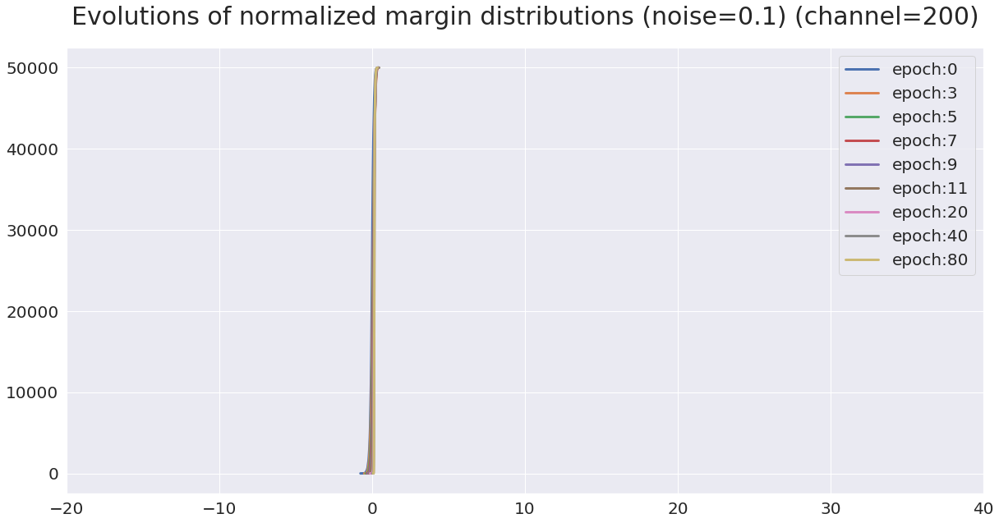

total parameters: 2263010
Epoch 1/100
----------
train1 Loss: 1.5191 rLoss: 2.2778 Error: 0.5048 RampLoss: 0.999589 MarginError: 1.0000 Margin: -8.0966 Lip: 5.8753e+01
test Loss: 1.5581 rLoss: 2.2784 Error: 0.5227 RampLoss: 0.999611 MarginError: 1.0000 Margin: -6.8905 Lip: 5.8753e+01
Saving..
Epoch 2/100
----------
train1 Loss: 1.3152 rLoss: 2.2703 Error: 0.4238 RampLoss: 0.999329 MarginError: 1.0000 Margin: -9.6185 Lip: 6.2851e+01
test Loss: 1.4244 rLoss: 2.2723 Error: 0.4662 RampLoss: 0.999396 MarginError: 1.0000 Margin: -9.1405 Lip: 6.2851e+01
Epoch 3/100
----------
train1 Loss: 1.1243 rLoss: 2.2675 Error: 0.3428 RampLoss: 0.999200 MarginError: 1.0000 Margin: -9.9713 Lip: 6.7681e+01
test Loss: 1.3167 rLoss: 2.2709 Error: 0.4172 RampLoss: 0.999321 MarginError: 1.0000 Margin: -10.7908 Lip: 6.7681e+01
Epoch 4/100
----------
train1 Loss: 1.0255 rLoss: 2.2669 Error: 0.3059 RampLoss: 0.999104 MarginError: 1.0000 Margin: -9.1292 Lip: 7.2397e+01
test Loss: 1.3214 rLoss: 2.2717 Error: 0.4170

test Loss: 2.1916 rLoss: 2.2783 Error: 0.4285 RampLoss: 0.999245 MarginError: 1.0000 Margin: -22.5613 Lip: 2.0734e+02
Epoch 33/100
----------
train1 Loss: 0.0010 rLoss: 2.2550 Error: 0.0000 RampLoss: 0.997979 MarginError: 1.0000 Margin: 3.7303 Lip: 2.0890e+02
test Loss: 2.2071 rLoss: 2.2782 Error: 0.4263 RampLoss: 0.999238 MarginError: 1.0000 Margin: -23.2009 Lip: 2.0890e+02
Epoch 34/100
----------
train1 Loss: 0.0009 rLoss: 2.2548 Error: 0.0000 RampLoss: 0.997971 MarginError: 1.0000 Margin: 3.4445 Lip: 2.0817e+02
test Loss: 2.2191 rLoss: 2.2781 Error: 0.4285 RampLoss: 0.999242 MarginError: 1.0000 Margin: -22.9100 Lip: 2.0817e+02
Epoch 35/100
----------
train1 Loss: 0.0008 rLoss: 2.2552 Error: 0.0000 RampLoss: 0.997983 MarginError: 1.0000 Margin: 4.3858 Lip: 2.1304e+02
test Loss: 2.2371 rLoss: 2.2784 Error: 0.4302 RampLoss: 0.999247 MarginError: 1.0000 Margin: -23.7205 Lip: 2.1304e+02
Epoch 36/100
----------
train1 Loss: 0.0009 rLoss: 2.2552 Error: 0.0000 RampLoss: 0.997981 MarginError

train1 Loss: 0.0004 rLoss: 2.2549 Error: 0.0000 RampLoss: 0.997926 MarginError: 1.0000 Margin: 5.5896 Lip: 2.2563e+02
test Loss: 2.3671 rLoss: 2.2786 Error: 0.4322 RampLoss: 0.999245 MarginError: 1.0000 Margin: -25.0236 Lip: 2.2563e+02
Epoch 65/100
----------
train1 Loss: 0.0003 rLoss: 2.2546 Error: 0.0000 RampLoss: 0.997915 MarginError: 1.0000 Margin: 5.5132 Lip: 2.2573e+02
test Loss: 2.3709 rLoss: 2.2784 Error: 0.4290 RampLoss: 0.999236 MarginError: 1.0000 Margin: -24.9892 Lip: 2.2573e+02
Epoch 66/100
----------
train1 Loss: 0.0003 rLoss: 2.2546 Error: 0.0000 RampLoss: 0.997911 MarginError: 1.0000 Margin: 5.4526 Lip: 2.2637e+02
test Loss: 2.3802 rLoss: 2.2784 Error: 0.4298 RampLoss: 0.999235 MarginError: 1.0000 Margin: -25.1851 Lip: 2.2637e+02
Epoch 67/100
----------
train1 Loss: 0.0003 rLoss: 2.2546 Error: 0.0000 RampLoss: 0.997915 MarginError: 1.0000 Margin: 5.8661 Lip: 2.2695e+02
test Loss: 2.3825 rLoss: 2.2785 Error: 0.4308 RampLoss: 0.999239 MarginError: 1.0000 Margin: -24.7424 

train1 Loss: 0.0002 rLoss: 2.2544 Error: 0.0000 RampLoss: 0.997884 MarginError: 1.0000 Margin: 5.9310 Lip: 2.3573e+02
test Loss: 2.4628 rLoss: 2.2786 Error: 0.4332 RampLoss: 0.999238 MarginError: 1.0000 Margin: -25.7959 Lip: 2.3573e+02
Epoch 97/100
----------
train1 Loss: 0.0002 rLoss: 2.2548 Error: 0.0000 RampLoss: 0.997901 MarginError: 1.0000 Margin: 6.1924 Lip: 2.3676e+02
test Loss: 2.4627 rLoss: 2.2787 Error: 0.4359 RampLoss: 0.999242 MarginError: 1.0000 Margin: -24.9921 Lip: 2.3676e+02
Epoch 98/100
----------
train1 Loss: 0.0002 rLoss: 2.2543 Error: 0.0000 RampLoss: 0.997878 MarginError: 1.0000 Margin: 6.1583 Lip: 2.3585e+02
test Loss: 2.4663 rLoss: 2.2785 Error: 0.4300 RampLoss: 0.999231 MarginError: 1.0000 Margin: -25.6616 Lip: 2.3585e+02
Epoch 99/100
----------
train1 Loss: 0.0002 rLoss: 2.2544 Error: 0.0000 RampLoss: 0.997879 MarginError: 1.0000 Margin: 6.3431 Lip: 2.3490e+02
test Loss: 2.4633 rLoss: 2.2785 Error: 0.4324 RampLoss: 0.999234 MarginError: 1.0000 Margin: -24.7979 

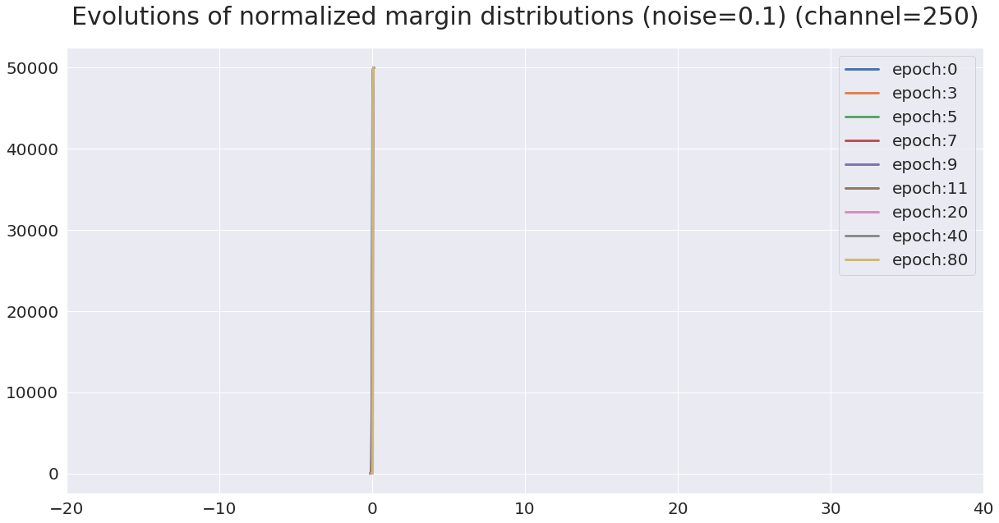

total parameters: 3255610
Epoch 1/100
----------
train1 Loss: 1.4786 rLoss: 2.2964 Error: 0.4845 RampLoss: 0.999897 MarginError: 1.0000 Margin: -9.0147 Lip: 2.4560e+02
test Loss: 1.5248 rLoss: 2.2966 Error: 0.5062 RampLoss: 0.999903 MarginError: 1.0000 Margin: -7.7228 Lip: 2.4560e+02
Saving..
Epoch 2/100
----------
train1 Loss: 1.2287 rLoss: 2.2941 Error: 0.3833 RampLoss: 0.999816 MarginError: 1.0000 Margin: -9.1887 Lip: 2.5581e+02
test Loss: 1.3674 rLoss: 2.2947 Error: 0.4404 RampLoss: 0.999837 MarginError: 1.0000 Margin: -10.0407 Lip: 2.5581e+02
Epoch 3/100
----------
train1 Loss: 1.0721 rLoss: 2.2931 Error: 0.3282 RampLoss: 0.999773 MarginError: 1.0000 Margin: -9.5700 Lip: 2.7440e+02
test Loss: 1.3096 rLoss: 2.2941 Error: 0.4121 RampLoss: 0.999809 MarginError: 1.0000 Margin: -9.9634 Lip: 2.7440e+02
Epoch 4/100
----------
train1 Loss: 0.9580 rLoss: 2.2930 Error: 0.2898 RampLoss: 0.999749 MarginError: 1.0000 Margin: -8.8978 Lip: 2.9761e+02
test Loss: 1.3207 rLoss: 2.2945 Error: 0.4091

test Loss: 2.1673 rLoss: 2.2958 Error: 0.4272 RampLoss: 0.999789 MarginError: 1.0000 Margin: -25.8314 Lip: 7.4538e+02
Epoch 33/100
----------
train1 Loss: 0.0008 rLoss: 2.2890 Error: 0.0000 RampLoss: 0.999422 MarginError: 1.0000 Margin: 4.1037 Lip: 7.3976e+02
test Loss: 2.1679 rLoss: 2.2957 Error: 0.4268 RampLoss: 0.999788 MarginError: 1.0000 Margin: -24.9702 Lip: 7.3976e+02
Epoch 34/100
----------
train1 Loss: 0.0008 rLoss: 2.2890 Error: 0.0000 RampLoss: 0.999419 MarginError: 1.0000 Margin: 3.9855 Lip: 7.3652e+02
test Loss: 2.1655 rLoss: 2.2957 Error: 0.4258 RampLoss: 0.999787 MarginError: 1.0000 Margin: -24.9017 Lip: 7.3652e+02
Epoch 35/100
----------
train1 Loss: 0.0008 rLoss: 2.2890 Error: 0.0000 RampLoss: 0.999419 MarginError: 1.0000 Margin: -2.1405 Lip: 7.4288e+02
test Loss: 2.1796 rLoss: 2.2957 Error: 0.4268 RampLoss: 0.999788 MarginError: 1.0000 Margin: -25.8511 Lip: 7.4288e+02
Epoch 36/100
----------
train1 Loss: 0.0010 rLoss: 2.2889 Error: 0.0000 RampLoss: 0.999414 MarginErro

train1 Loss: 0.0003 rLoss: 2.2888 Error: 0.0000 RampLoss: 0.999398 MarginError: 1.0000 Margin: 5.4450 Lip: 7.8980e+02
test Loss: 2.3067 rLoss: 2.2957 Error: 0.4260 RampLoss: 0.999784 MarginError: 1.0000 Margin: -27.3831 Lip: 7.8980e+02
Epoch 65/100
----------
train1 Loss: 0.0003 rLoss: 2.2888 Error: 0.0000 RampLoss: 0.999400 MarginError: 1.0000 Margin: 5.7572 Lip: 7.9414e+02
test Loss: 2.3093 rLoss: 2.2957 Error: 0.4266 RampLoss: 0.999784 MarginError: 1.0000 Margin: -27.2434 Lip: 7.9414e+02
Epoch 66/100
----------
train1 Loss: 0.0003 rLoss: 2.2888 Error: 0.0000 RampLoss: 0.999397 MarginError: 1.0000 Margin: 5.8555 Lip: 7.8972e+02
test Loss: 2.3129 rLoss: 2.2957 Error: 0.4287 RampLoss: 0.999784 MarginError: 1.0000 Margin: -27.3535 Lip: 7.8972e+02
Epoch 67/100
----------
train1 Loss: 0.0003 rLoss: 2.2887 Error: 0.0000 RampLoss: 0.999396 MarginError: 1.0000 Margin: 6.1169 Lip: 7.9191e+02
test Loss: 2.3210 rLoss: 2.2957 Error: 0.4271 RampLoss: 0.999784 MarginError: 1.0000 Margin: -27.5353 

train1 Loss: 0.0002 rLoss: 2.2887 Error: 0.0000 RampLoss: 0.999389 MarginError: 1.0000 Margin: 6.4580 Lip: 8.1734e+02
test Loss: 2.3770 rLoss: 2.2957 Error: 0.4270 RampLoss: 0.999783 MarginError: 1.0000 Margin: -28.7726 Lip: 8.1734e+02
Epoch 97/100
----------
train1 Loss: 0.0002 rLoss: 2.2887 Error: 0.0000 RampLoss: 0.999389 MarginError: 1.0000 Margin: 5.9837 Lip: 8.2040e+02
test Loss: 2.3926 rLoss: 2.2957 Error: 0.4272 RampLoss: 0.999784 MarginError: 1.0000 Margin: -28.8280 Lip: 8.2040e+02
Epoch 98/100
----------
train1 Loss: 0.0002 rLoss: 2.2887 Error: 0.0000 RampLoss: 0.999387 MarginError: 1.0000 Margin: 6.5719 Lip: 8.2227e+02
test Loss: 2.4026 rLoss: 2.2957 Error: 0.4275 RampLoss: 0.999784 MarginError: 1.0000 Margin: -28.9662 Lip: 8.2227e+02
Epoch 99/100
----------
train1 Loss: 0.0002 rLoss: 2.2887 Error: 0.0000 RampLoss: 0.999387 MarginError: 1.0000 Margin: 6.4138 Lip: 8.2180e+02
test Loss: 2.3895 rLoss: 2.2957 Error: 0.4263 RampLoss: 0.999783 MarginError: 1.0000 Margin: -28.6429 

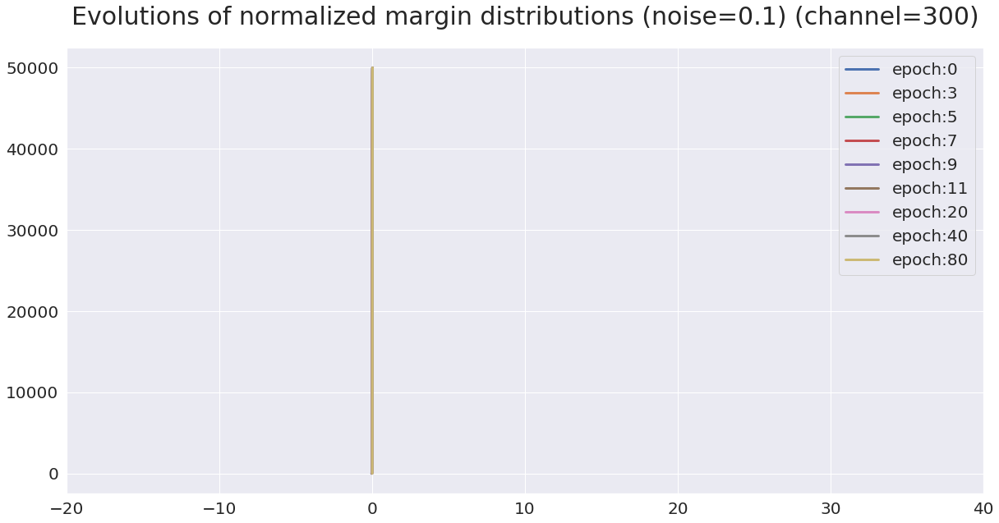

total parameters: 4428210
Epoch 1/100
----------
train1 Loss: 1.4455 rLoss: 2.3001 Error: 0.4730 RampLoss: 0.999957 MarginError: 1.0000 Margin: -9.7327 Lip: 7.0997e+02
test Loss: 1.5074 rLoss: 2.3002 Error: 0.4965 RampLoss: 0.999960 MarginError: 1.0000 Margin: -7.9538 Lip: 7.0997e+02
Saving..
Epoch 2/100
----------
train1 Loss: 1.2349 rLoss: 2.2997 Error: 0.3882 RampLoss: 0.999936 MarginError: 1.0000 Margin: -8.5697 Lip: 7.3110e+02
test Loss: 1.3900 rLoss: 2.2999 Error: 0.4458 RampLoss: 0.999944 MarginError: 1.0000 Margin: -9.2946 Lip: 7.3110e+02
Epoch 3/100
----------
train1 Loss: 1.0579 rLoss: 2.2993 Error: 0.3169 RampLoss: 0.999922 MarginError: 1.0000 Margin: -7.9252 Lip: 7.7080e+02
test Loss: 1.3272 rLoss: 2.2997 Error: 0.4226 RampLoss: 0.999937 MarginError: 1.0000 Margin: -9.6569 Lip: 7.7080e+02
Epoch 4/100
----------
train1 Loss: 0.9051 rLoss: 2.2993 Error: 0.2642 RampLoss: 0.999915 MarginError: 1.0000 Margin: -8.0735 Lip: 8.6333e+02
test Loss: 1.3098 rLoss: 2.2999 Error: 0.4135 

test Loss: 2.1360 rLoss: 2.3000 Error: 0.4256 RampLoss: 0.999921 MarginError: 1.0000 Margin: -21.0514 Lip: 1.9985e+03
Epoch 33/100
----------
train1 Loss: 0.0007 rLoss: 2.2976 Error: 0.0000 RampLoss: 0.999784 MarginError: 1.0000 Margin: 4.8708 Lip: 2.0227e+03
test Loss: 2.1427 rLoss: 2.3001 Error: 0.4241 RampLoss: 0.999921 MarginError: 1.0000 Margin: -21.1356 Lip: 2.0227e+03
Epoch 34/100
----------
train1 Loss: 0.0007 rLoss: 2.2975 Error: 0.0000 RampLoss: 0.999783 MarginError: 1.0000 Margin: 3.9938 Lip: 2.0179e+03
test Loss: 2.1513 rLoss: 2.3001 Error: 0.4243 RampLoss: 0.999921 MarginError: 1.0000 Margin: -21.7038 Lip: 2.0179e+03
Epoch 35/100
----------
train1 Loss: 0.0006 rLoss: 2.2975 Error: 0.0000 RampLoss: 0.999782 MarginError: 1.0000 Margin: 4.3474 Lip: 2.0138e+03
test Loss: 2.1548 rLoss: 2.3000 Error: 0.4258 RampLoss: 0.999921 MarginError: 1.0000 Margin: -20.7890 Lip: 2.0138e+03
Epoch 36/100
----------
train1 Loss: 0.0006 rLoss: 2.2976 Error: 0.0000 RampLoss: 0.999785 MarginError

train1 Loss: 0.0003 rLoss: 2.2975 Error: 0.0000 RampLoss: 0.999776 MarginError: 1.0000 Margin: -0.6774 Lip: 2.1401e+03
test Loss: 2.2806 rLoss: 2.3001 Error: 0.4259 RampLoss: 0.999921 MarginError: 1.0000 Margin: -22.6177 Lip: 2.1401e+03
Epoch 65/100
----------
train1 Loss: 0.0003 rLoss: 2.2975 Error: 0.0000 RampLoss: 0.999777 MarginError: 1.0000 Margin: 4.3536 Lip: 2.1456e+03
test Loss: 2.2720 rLoss: 2.3001 Error: 0.4272 RampLoss: 0.999921 MarginError: 1.0000 Margin: -22.5627 Lip: 2.1456e+03
Epoch 66/100
----------
train1 Loss: 0.0002 rLoss: 2.2975 Error: 0.0000 RampLoss: 0.999777 MarginError: 1.0000 Margin: 4.5053 Lip: 2.1673e+03
test Loss: 2.2853 rLoss: 2.3001 Error: 0.4271 RampLoss: 0.999921 MarginError: 1.0000 Margin: -22.8340 Lip: 2.1673e+03
Epoch 67/100
----------
train1 Loss: 0.0002 rLoss: 2.2975 Error: 0.0000 RampLoss: 0.999777 MarginError: 1.0000 Margin: 5.6954 Lip: 2.1750e+03
test Loss: 2.2858 rLoss: 2.3001 Error: 0.4252 RampLoss: 0.999921 MarginError: 1.0000 Margin: -22.0267

train1 Loss: 0.0002 rLoss: 2.2975 Error: 0.0000 RampLoss: 0.999773 MarginError: 1.0000 Margin: 6.5891 Lip: 2.2322e+03
test Loss: 2.3481 rLoss: 2.3001 Error: 0.4279 RampLoss: 0.999920 MarginError: 1.0000 Margin: -23.1575 Lip: 2.2322e+03
Epoch 97/100
----------
train1 Loss: 0.0002 rLoss: 2.2974 Error: 0.0000 RampLoss: 0.999772 MarginError: 1.0000 Margin: 5.3857 Lip: 2.2115e+03
test Loss: 2.3541 rLoss: 2.3001 Error: 0.4275 RampLoss: 0.999920 MarginError: 1.0000 Margin: -23.7764 Lip: 2.2115e+03
Epoch 98/100
----------
train1 Loss: 0.0001 rLoss: 2.2974 Error: 0.0000 RampLoss: 0.999771 MarginError: 1.0000 Margin: 5.4990 Lip: 2.2128e+03
test Loss: 2.3579 rLoss: 2.3001 Error: 0.4287 RampLoss: 0.999920 MarginError: 1.0000 Margin: -23.3921 Lip: 2.2128e+03
Epoch 99/100
----------
train1 Loss: 0.0001 rLoss: 2.2974 Error: 0.0000 RampLoss: 0.999772 MarginError: 1.0000 Margin: 6.0956 Lip: 2.2238e+03
test Loss: 2.3548 rLoss: 2.3001 Error: 0.4276 RampLoss: 0.999920 MarginError: 1.0000 Margin: -23.4140 

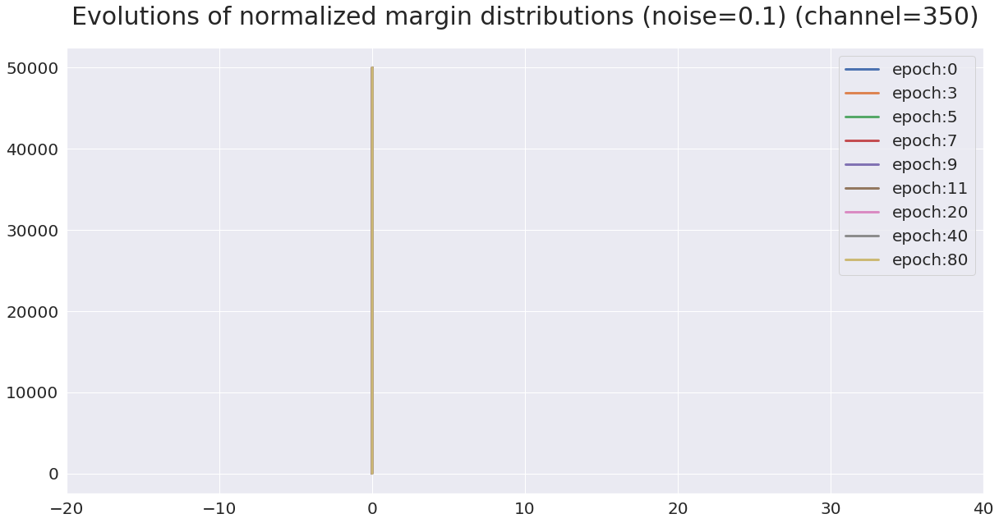

total parameters: 5780810
Epoch 1/100
----------
train1 Loss: 1.4060 rLoss: 2.3017 Error: 0.4505 RampLoss: 0.999983 MarginError: 1.0000 Margin: -8.7963 Lip: 1.8130e+03
test Loss: 1.4739 rLoss: 2.3017 Error: 0.4861 RampLoss: 0.999985 MarginError: 1.0000 Margin: -7.6629 Lip: 1.8130e+03
Saving..
Epoch 2/100
----------
train1 Loss: 1.1875 rLoss: 2.3014 Error: 0.3697 RampLoss: 0.999974 MarginError: 1.0000 Margin: -9.3758 Lip: 1.8454e+03
test Loss: 1.3607 rLoss: 2.3015 Error: 0.4364 RampLoss: 0.999978 MarginError: 1.0000 Margin: -9.6995 Lip: 1.8454e+03
Epoch 3/100
----------
train1 Loss: 1.0026 rLoss: 2.3013 Error: 0.3001 RampLoss: 0.999966 MarginError: 1.0000 Margin: -8.9257 Lip: 2.0680e+03
test Loss: 1.3179 rLoss: 2.3015 Error: 0.4087 RampLoss: 0.999973 MarginError: 1.0000 Margin: -9.6558 Lip: 2.0680e+03
Epoch 4/100
----------
train1 Loss: 0.8196 rLoss: 2.3012 Error: 0.2318 RampLoss: 0.999961 MarginError: 1.0000 Margin: -8.6605 Lip: 2.2124e+03
test Loss: 1.2920 rLoss: 2.3014 Error: 0.3950 

test Loss: 2.0682 rLoss: 2.3015 Error: 0.4146 RampLoss: 0.999966 MarginError: 1.0000 Margin: -19.9502 Lip: 4.5940e+03
Epoch 33/100
----------
train1 Loss: 0.0006 rLoss: 2.3004 Error: 0.0000 RampLoss: 0.999906 MarginError: 1.0000 Margin: 4.2969 Lip: 4.6508e+03
test Loss: 2.0814 rLoss: 2.3015 Error: 0.4174 RampLoss: 0.999966 MarginError: 1.0000 Margin: -20.7710 Lip: 4.6508e+03
Epoch 34/100
----------
train1 Loss: 0.0006 rLoss: 2.3004 Error: 0.0000 RampLoss: 0.999905 MarginError: 1.0000 Margin: 4.8302 Lip: 4.6724e+03
test Loss: 2.0901 rLoss: 2.3015 Error: 0.4160 RampLoss: 0.999966 MarginError: 1.0000 Margin: -20.9024 Lip: 4.6724e+03
Epoch 35/100
----------
train1 Loss: 0.0006 rLoss: 2.3004 Error: 0.0000 RampLoss: 0.999904 MarginError: 1.0000 Margin: 4.9711 Lip: 4.6196e+03
test Loss: 2.0883 rLoss: 2.3015 Error: 0.4170 RampLoss: 0.999965 MarginError: 1.0000 Margin: -19.9737 Lip: 4.6196e+03
Epoch 36/100
----------
train1 Loss: 0.0006 rLoss: 2.3004 Error: 0.0000 RampLoss: 0.999905 MarginError

train1 Loss: 0.0002 rLoss: 2.3004 Error: 0.0000 RampLoss: 0.999902 MarginError: 1.0000 Margin: 5.7714 Lip: 4.9396e+03
test Loss: 2.2038 rLoss: 2.3015 Error: 0.4161 RampLoss: 0.999965 MarginError: 1.0000 Margin: -21.5383 Lip: 4.9396e+03
Epoch 65/100
----------
train1 Loss: 0.0002 rLoss: 2.3004 Error: 0.0000 RampLoss: 0.999901 MarginError: 1.0000 Margin: 6.2948 Lip: 4.9067e+03
test Loss: 2.2133 rLoss: 2.3015 Error: 0.4157 RampLoss: 0.999965 MarginError: 1.0000 Margin: -22.1108 Lip: 4.9067e+03
Epoch 66/100
----------
train1 Loss: 0.0002 rLoss: 2.3003 Error: 0.0000 RampLoss: 0.999900 MarginError: 1.0000 Margin: 5.7478 Lip: 4.8649e+03
test Loss: 2.2110 rLoss: 2.3015 Error: 0.4141 RampLoss: 0.999965 MarginError: 1.0000 Margin: -21.5746 Lip: 4.8649e+03
Epoch 67/100
----------
train1 Loss: 0.0002 rLoss: 2.3004 Error: 0.0000 RampLoss: 0.999901 MarginError: 1.0000 Margin: 5.9150 Lip: 4.9213e+03
test Loss: 2.2093 rLoss: 2.3015 Error: 0.4182 RampLoss: 0.999965 MarginError: 1.0000 Margin: -21.7062 

train1 Loss: 0.0001 rLoss: 2.3003 Error: 0.0000 RampLoss: 0.999900 MarginError: 1.0000 Margin: 6.5387 Lip: 5.0695e+03
test Loss: 2.2776 rLoss: 2.3015 Error: 0.4183 RampLoss: 0.999965 MarginError: 1.0000 Margin: -22.3503 Lip: 5.0695e+03
Epoch 97/100
----------
train1 Loss: 0.0001 rLoss: 2.3003 Error: 0.0000 RampLoss: 0.999900 MarginError: 1.0000 Margin: 6.6174 Lip: 5.0670e+03
test Loss: 2.2739 rLoss: 2.3015 Error: 0.4153 RampLoss: 0.999965 MarginError: 1.0000 Margin: -22.5662 Lip: 5.0670e+03
Epoch 98/100
----------
train1 Loss: 0.0001 rLoss: 2.3003 Error: 0.0000 RampLoss: 0.999899 MarginError: 1.0000 Margin: 6.4664 Lip: 5.0567e+03
test Loss: 2.2767 rLoss: 2.3015 Error: 0.4173 RampLoss: 0.999965 MarginError: 1.0000 Margin: -22.7838 Lip: 5.0567e+03
Epoch 99/100
----------
train1 Loss: 0.0001 rLoss: 2.3003 Error: 0.0000 RampLoss: 0.999900 MarginError: 1.0000 Margin: 6.4576 Lip: 5.0938e+03
test Loss: 2.2850 rLoss: 2.3015 Error: 0.4172 RampLoss: 0.999965 MarginError: 1.0000 Margin: -22.4595 

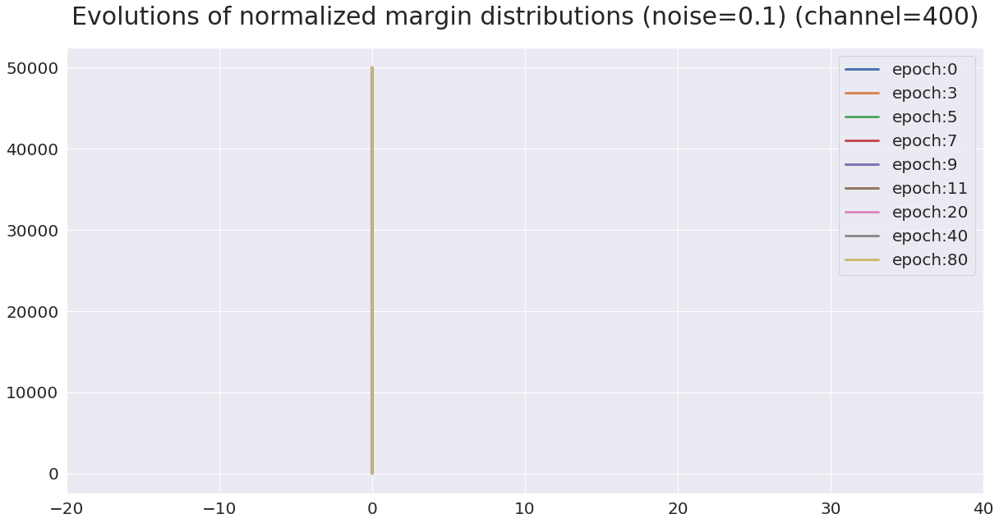

In [223]:
# %%
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
root = './'
lr = 0.01
BATCH_SIZE = 100
weight_decay = 0.
label_mode = 'partially-0.1'
g0 = 20

print(f'****** label mode: {label_mode} ******')

img_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])
(training_dataset, testing_dataset), \
(training_loader, testing_loader) = get_loader(root, BATCH_SIZE, label_mode, img_transforms)

loaders = {'train': training_loader, 'test': testing_loader}
num_epochs = 100
for channel in [50,100,150,200,250,300,350,400]:
    exec("log_1_%d = {'num_params': [],'train_loss': [],'train_rloss': [],'train_error': [],'train_margin_error': [],'train_ramp_loss': [],'test_ramp_loss': [],'test_loss': [],'test_rloss': [],'test_error': [],'test_margin_error': [],'Lip': [],'w0': [],'w1': [],'w2': [],'w3': [],'w4': [],'w_fc': [],'margin_train': [],'margin_test': []}"%channel)

    # here use with_bn to control batch normalisation
    model = basic_cnn.CNN(channel, 10, with_bn=True)

    number_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f'total parameters: {number_params}')

    eval("log_1_%d['num_params'].append(number_params)"%channel)

    if use_gpu:
        model = model.cuda()

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=lr, weight_decay=weight_decay)
    exec("model, log_1_%d = train_model(model, criterion, optimizer, log_1_%d, g0, num_epochs=num_epochs)"%(channel,channel))
    fig = plt.figure(1, figsize=(20, 10))
    ax = fig.add_subplot(111)
    plt.title('Evolutions of normalized margin distributions (noise=0.1) (channel=%d)'%channel, fontsize=30, y=1.04)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    for i in [0, 3,5, 7, 9, 11,20, 40, 80]:
        exec("ax.plot(np.sort(log_1_%d['margin_train'][i])/log_1_%d['Lip'][i], range(50000),label=f'epoch:{i}',linewidth=3)"%(channel,channel))
    ax.set_xlim([-20, 40])
    ax.legend(fontsize=20)
    fig.savefig('./results_p0.1/nMargin_distribution_%d.png'%channel)
    plt.show()

In [376]:
for channel in [50,100,150,200,250,300,350,400]:
    exec("pickle.dump(log_1_%d,open('./results_p0.1/log_1_%d.log','wb'))"%(channel,channel))

In [102]:
for channel in [50,100,150,200,250,300,350,400]:
    exec("log_1_%d=pickle.load(open('./results_p0.1/log_1_%d.log','rb'))"%(channel,channel))

In [273]:
summary(basic_cnn.CNN(400,10).cuda(),[3,32,32])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 400, 16, 16]          11,200
       BatchNorm2d-2          [-1, 400, 16, 16]             800
              ReLU-3          [-1, 400, 16, 16]               0
            Conv2d-4            [-1, 400, 8, 8]       1,440,400
       BatchNorm2d-5            [-1, 400, 8, 8]             800
              ReLU-6            [-1, 400, 8, 8]               0
            Conv2d-7            [-1, 400, 4, 4]       1,440,400
       BatchNorm2d-8            [-1, 400, 4, 4]             800
              ReLU-9            [-1, 400, 4, 4]               0
           Conv2d-10            [-1, 400, 2, 2]       1,440,400
      BatchNorm2d-11            [-1, 400, 2, 2]             800
             ReLU-12            [-1, 400, 2, 2]               0
           Conv2d-13            [-1, 400, 1, 1]       1,440,400
      BatchNorm2d-14            [-1, 40

In [261]:
def plot_channel(channel,interval,g0):
    fig = plt.figure(1, figsize=(20, 10))
    ax = fig.add_subplot(111)
    plt.title('channel=%d'%channel, fontsize=30, y=1.04)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    for i in [0, 2,4, 6, 8, 10,15,20, 40, 80]:
        exec("ax.plot(np.sort(log_1_%d['margin_train'][i])/log_1_%d['Lip'][i], np.arange(50000)/50000,label=f'epoch:{i}',linewidth=3)"%(channel,channel))
    ax.set_xlim(interval)
    #ax.set_xticks([0])
    ax.legend(fontsize=20)
    exec("fig.savefig('./results_p0.1/nMargin_distribution_%d.png'%channel)")
    plt.show()

    fig = plt.figure(1, figsize=(20, 10))
    ax = fig.add_subplot(111)
    plt.title('channel=%d'%channel, fontsize=30, y=1.04)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    for i in [0, 2,4, 6, 8, 10,15,20, 40, 80]:
        exec("ax.plot(np.sort(log_1_%d['margin_test'][i])/log_1_%d['Lip'][i], np.arange(10000)/10000,label=f'epoch:{i}',linewidth=3)"%(channel,channel))
    ax.set_xlim(interval)
    #ax.set_xticks([0])
    ax.legend(fontsize=20)
    exec("fig.savefig('./results_p0.1/test_nMargin_distribution_%d.png'%channel)")
    plt.show()

    fig = plt.figure(1, figsize=(20, 10))
    ax = fig.add_subplot(111)

    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)

    train_merror=eval("[margin_error(margin, lip * %f) for (margin, lip) in zip(log_1_%d['margin_train'], log_1_%d['Lip'])]"%(g0,channel,channel))
    ax.plot(train_merror,'r',linewidth=3,
        label='train margin_error '+r'($\rho^{\ast}=$'+'{})'.format(g0))
    exec("ax.plot(log_1_%d['test_error'],'b',linewidth=3,label='test error')"%channel)
    ax.legend(fontsize=20,loc='upper right')
    #ax.set_xlim(0,100)
    ax.set_ylim(0,1.05)
    plt.title('test error and training margin error (noise=0.1) (channel=%d)'%channel, fontsize=30, y=1.04)
    exec("x1=np.argmin(log_1_%d['test_error'])"%channel)
    exec("ax.plot([x1,x1],[0,log_1_%d['test_error'][x1]],'b--')"%channel)
    x2=np.argmin(train_merror)
    ax.plot([x2,x2],[0,train_merror[x2]],'r--')
    ax.set_xticks([0,x1,x2,40,60,80,100])
    ax.set_xlabel('Number of epochs',fontdict={'size': 30})
    exec("plt.savefig('./results_p0.1/margin_error_and_test_error_%d.png')"%channel)
    plt.show()
    
def plot_heatmap(channel,interval):
    n=len(interval)
    corr=np.zeros((n,n))
    corr_linear=np.zeros((n,n))
    for i in range(n):
        g1=interval[i]
        train_merror=eval("[margin_error(margin, lip * %f) for (margin, lip) in zip(log_1_%d['margin_train'], log_1_%d['Lip'])]"%(g1,channel,channel))
        for j in range(n):
            g2=interval[j]
            test_merror=eval("[margin_error(margin, lip * %f) for (margin, lip) in zip(log_1_%d['margin_test'], log_1_%d['Lip'])]"%(g2,channel,channel))
            corr[i,j]=scipy.stats.spearmanr(train_merror,test_merror)[0]
            corr_linear[i,j]=np.corrcoef(train_merror,test_merror)[0,1]
    fig = plt.figure(1, figsize=(20, 10))
    ax = fig.add_subplot(111)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    #ax.set_title('channel=%d'%channel)
    im=ax.pcolormesh(interval,interval,corr,vmin=-0.8,vmax=0.8)
    fig.colorbar(im)
    ax.axis('tight')
    ax.set_xlabel('$\gamma_{1}$',fontsize=20)
    ax.set_ylabel('$\gamma_{2}$',fontsize=20)
    from matplotlib import ticker
    formatter=ticker.ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.xaxis.set_major_formatter(formatter)
    ax.yaxis.set_major_formatter(formatter)
    exec("fig.savefig('./results_p0.1/margin_error_rankcorr_%d.png'%channel)")
    plt.show()
    
    fig = plt.figure(1, figsize=(20, 10))
    ax = fig.add_subplot(111)
    im=ax.pcolormesh(interval,interval,corr_linear)
    fig.colorbar(im)
    ax.axis('tight')
    from matplotlib import ticker
    formatter=ticker.ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.xaxis.set_major_formatter(formatter)
    ax.yaxis.set_major_formatter(formatter)
    exec("fig.savefig('./results_p0.1/margin_error_linearcorr_%d.png'%channel)")
    plt.show()

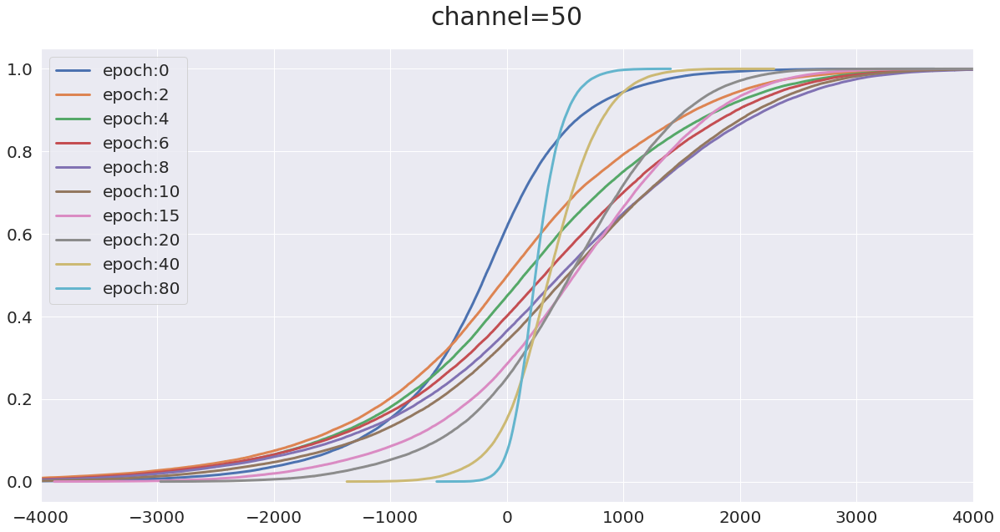

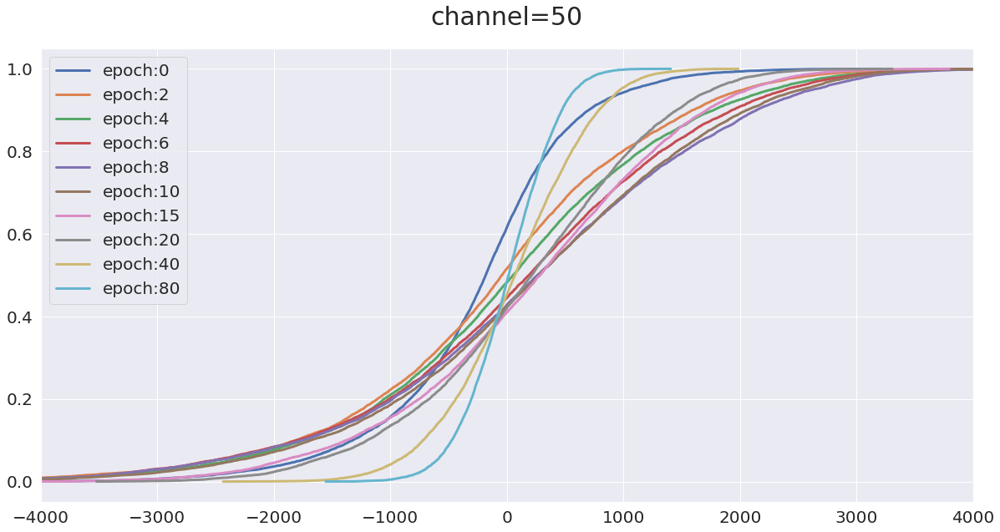

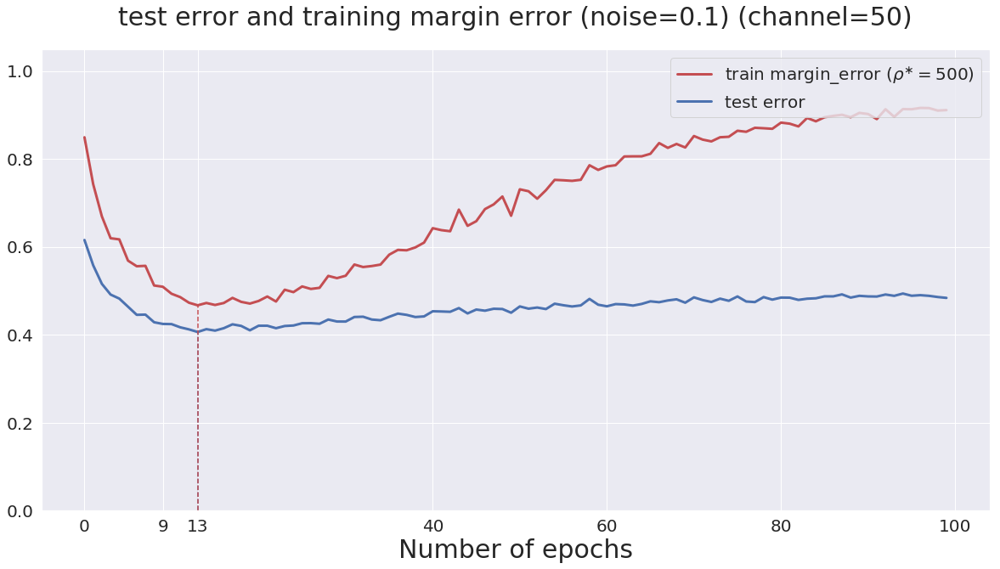

In [114]:
plot_channel(50,[-4000,4000],500)

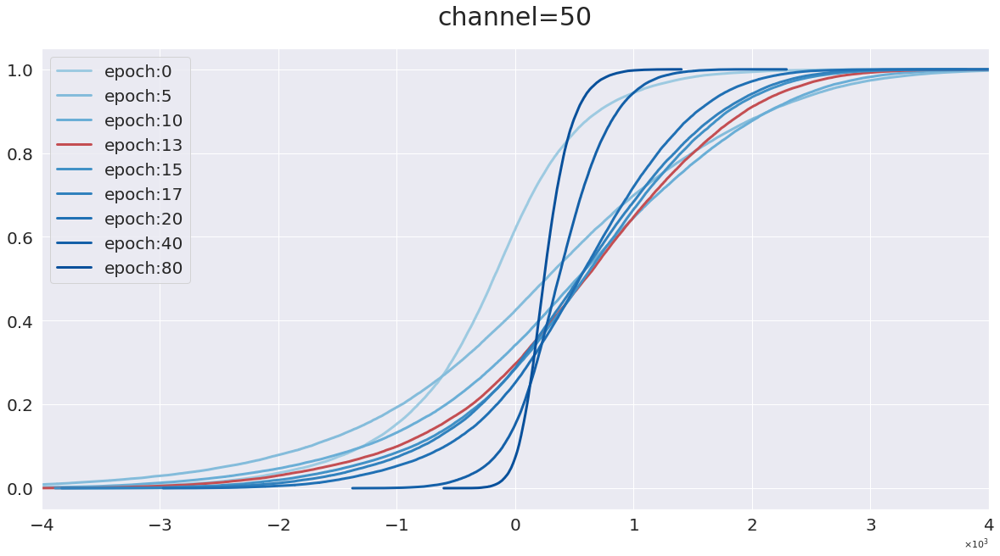

In [280]:
channel=50
interval=[-4000,4000]
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
plt.title('channel=%d'%channel, fontsize=30, y=1.04)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
for j,i in enumerate([0, 5,10,13,15,17,20, 40, 80]):
    if i==13:
        c='r'
        d=5
    else:
        c=sbn.color_palette('Blues',15)[j+5]
        d=3
    exec("ax.plot(np.sort(log_1_%d['margin_train'][i])/log_1_%d['Lip'][i], np.arange(50000)/50000,label=f'epoch:{i}',c=c,linewidth=3)"%(channel,channel))
ax.set_xlim(interval)
from matplotlib import ticker
formatter=ticker.ScalarFormatter(useMathText=True)
formatter.set_scientific(True)
formatter.set_powerlimits((-1,1))
ax.xaxis.set_major_formatter(formatter)
ax.legend(fontsize=20)
exec("fig.savefig('./results_p0.1/nMargin_distribution_%d_1.png'%channel)")
plt.show()

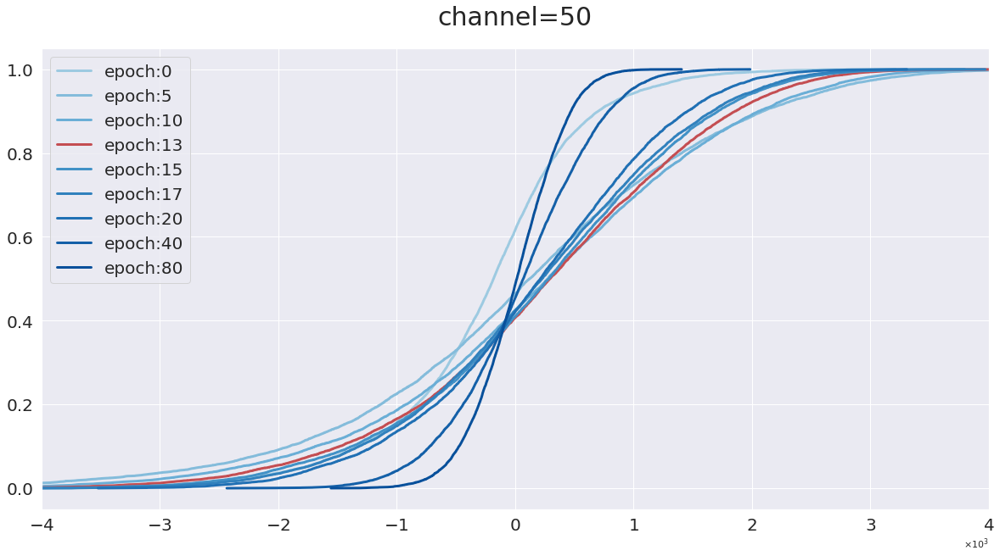

In [279]:
channel=50
interval=[-4000,4000]
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
plt.title('channel=%d'%channel, fontsize=30, y=1.04)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
for j,i in enumerate([0, 5,10,13,15,17,20, 40, 80]):
    if i==13:
        c='r'
        d=5
    else:
        c=sbn.color_palette('Blues',15)[j+5]
        d=3
    exec("ax.plot(np.sort(log_1_%d['margin_test'][i])/log_1_%d['Lip'][i], np.arange(10000)/10000,label=f'epoch:{i}',c=c,linewidth=3)"%(channel,channel))
ax.set_xlim(interval)
from matplotlib import ticker
formatter=ticker.ScalarFormatter(useMathText=True)
formatter.set_scientific(True)
formatter.set_powerlimits((-1,1))
ax.xaxis.set_major_formatter(formatter)
ax.legend(fontsize=20)
exec("fig.savefig('./results_p0.1/test_nMargin_distribution_%d.png'%channel)")
plt.show()

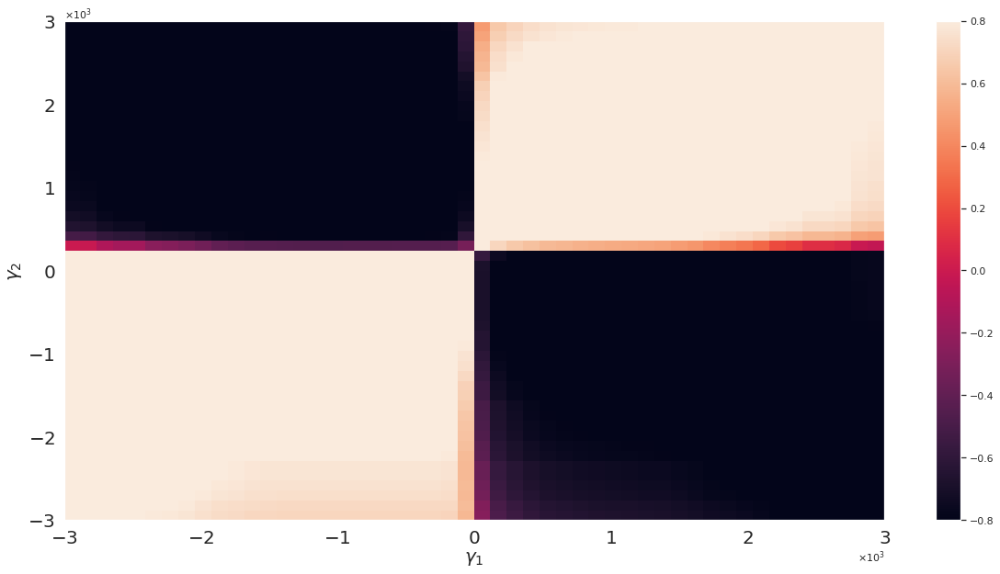

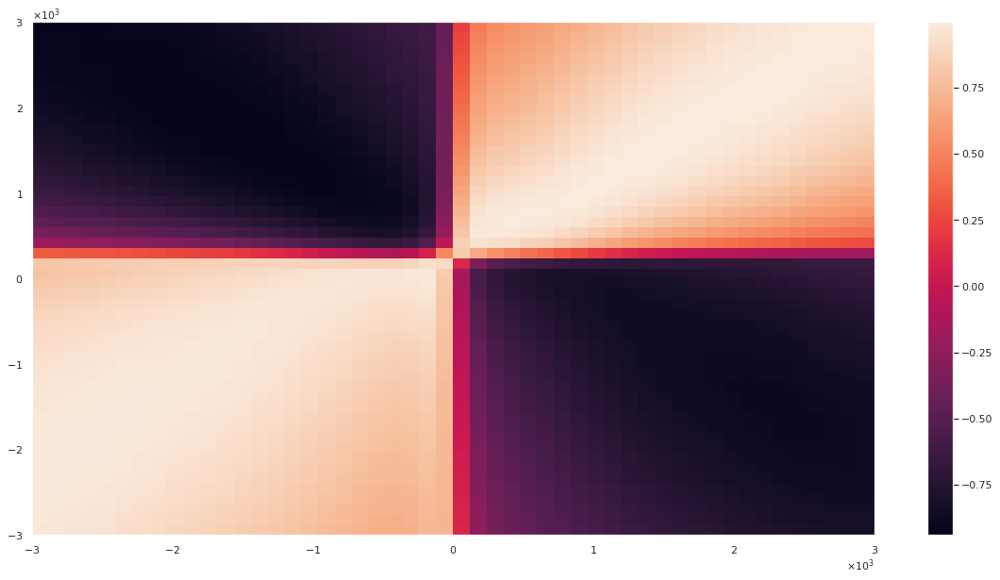

In [266]:
plot_heatmap(50,np.linspace(-3000,3000,51))

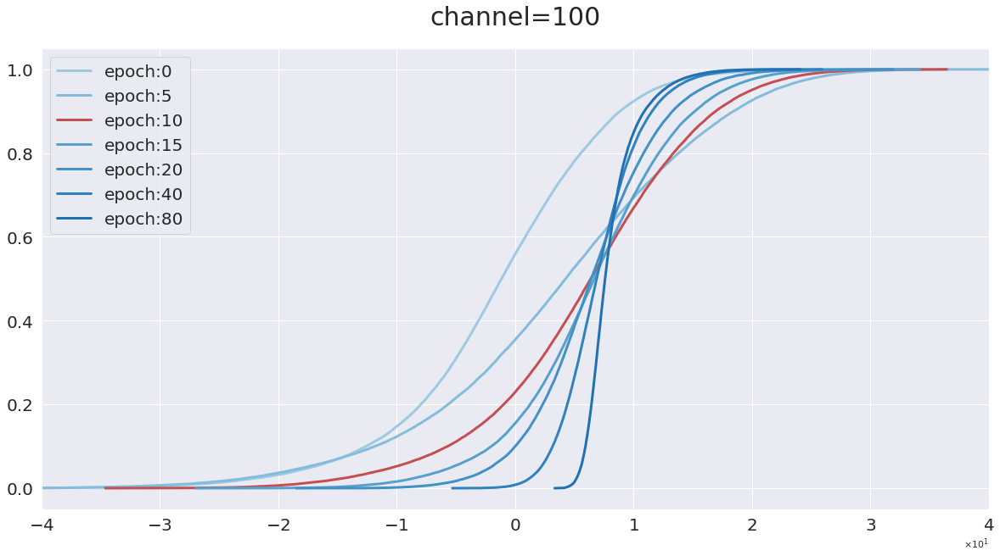

In [278]:
channel=100
interval=[-40,40]
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
plt.title('channel=%d'%channel, fontsize=30, y=1.04)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
for j,i in enumerate([0, 5,10,15,20, 40, 80]):
    if i==10:
        c='r'
        d=5
    else:
        c=sbn.color_palette('Blues',15)[j+5]
        d=3
    exec("ax.plot(np.sort(log_1_%d['margin_train'][i])/log_1_%d['Lip'][i], np.arange(50000)/50000,label=f'epoch:{i}',c=c,linewidth=3)"%(channel,channel))
ax.set_xlim(interval)
from matplotlib import ticker
formatter=ticker.ScalarFormatter(useMathText=True)
formatter.set_scientific(True)
formatter.set_powerlimits((-1,1))
ax.xaxis.set_major_formatter(formatter)
ax.legend(fontsize=20)
exec("fig.savefig('./results_p0.1/nMargin_distribution_%d_1.png'%channel)")
plt.show()

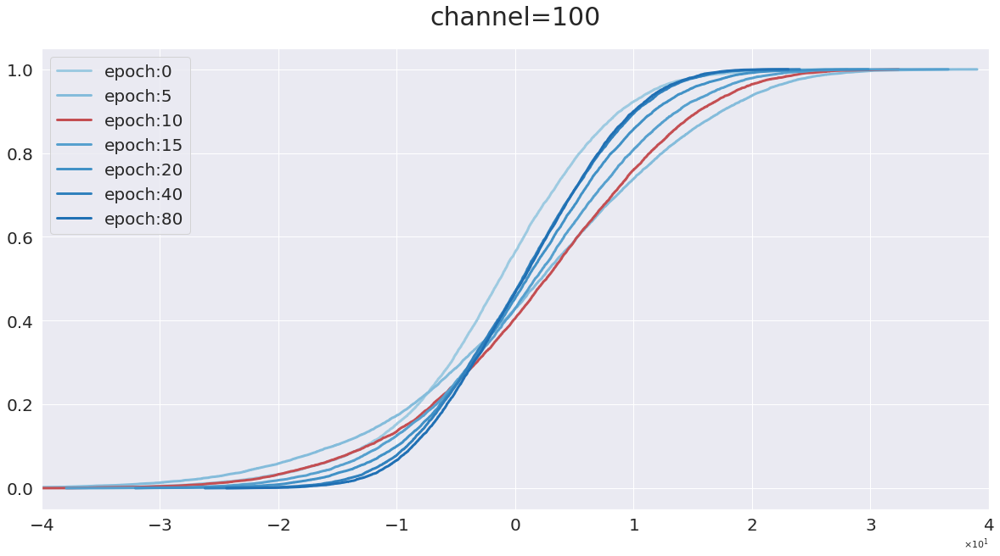

In [239]:
channel=100
interval=[-40,40]
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
plt.title('channel=%d'%channel, fontsize=30, y=1.04)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
for j,i in enumerate([0, 5,10,15,20, 40, 80]):
    if i==10:
        c='r'
        d=5
    else:
        c=sbn.color_palette('Blues',15)[j+5]
        d=3
    exec("ax.plot(np.sort(log_1_%d['margin_test'][i])/log_1_%d['Lip'][i], np.arange(10000)/10000,label=f'epoch:{i}',c=c,linewidth=3)"%(channel,channel))
ax.set_xlim(interval)
from matplotlib import ticker
formatter=ticker.ScalarFormatter(useMathText=True)
formatter.set_scientific(True)
formatter.set_powerlimits((-1,1))
ax.xaxis.set_major_formatter(formatter)
ax.legend(fontsize=20)
exec("fig.savefig('./results_p0.1/test_nMargin_distribution_%d.png'%channel)")
plt.show()

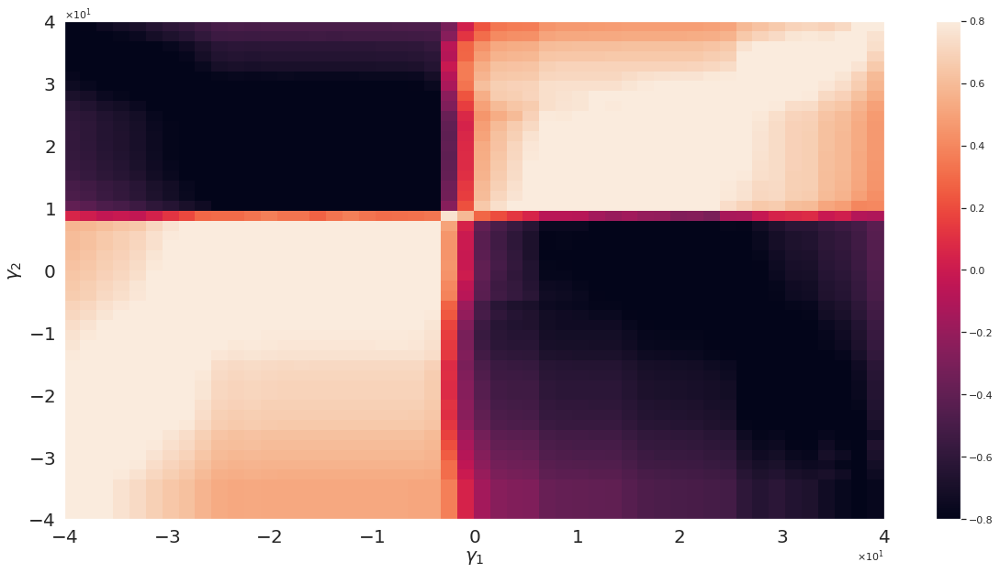

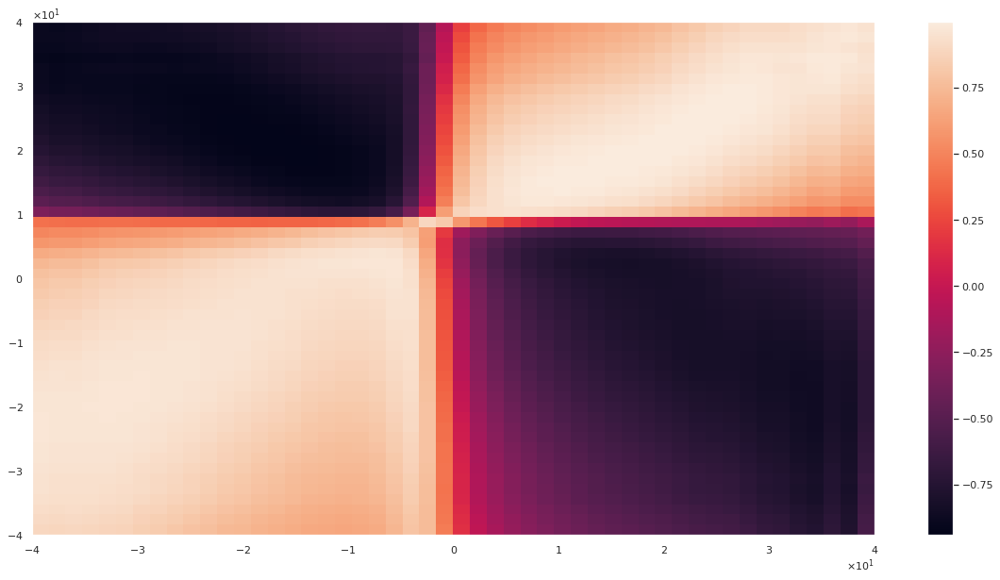

In [267]:
plot_heatmap(100,np.linspace(-40,40,51))

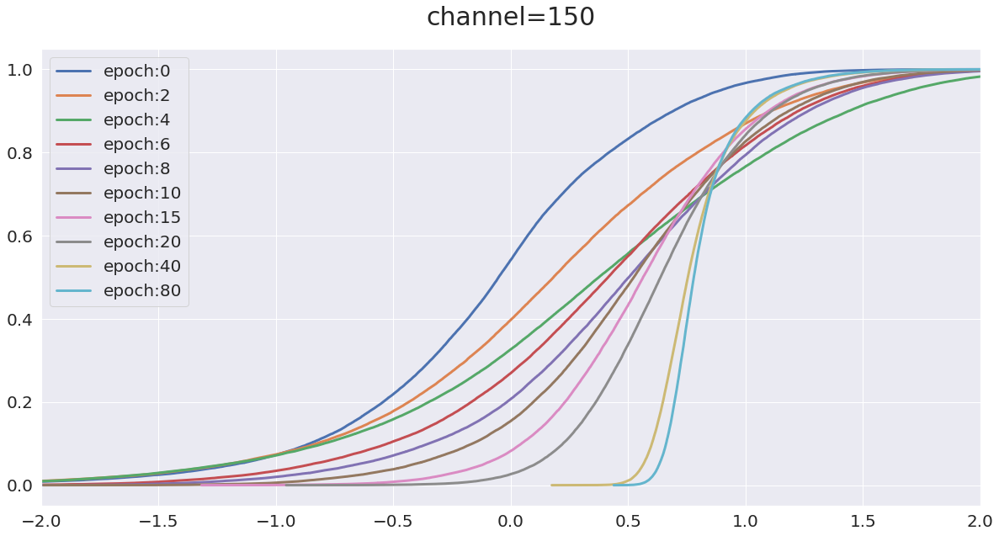

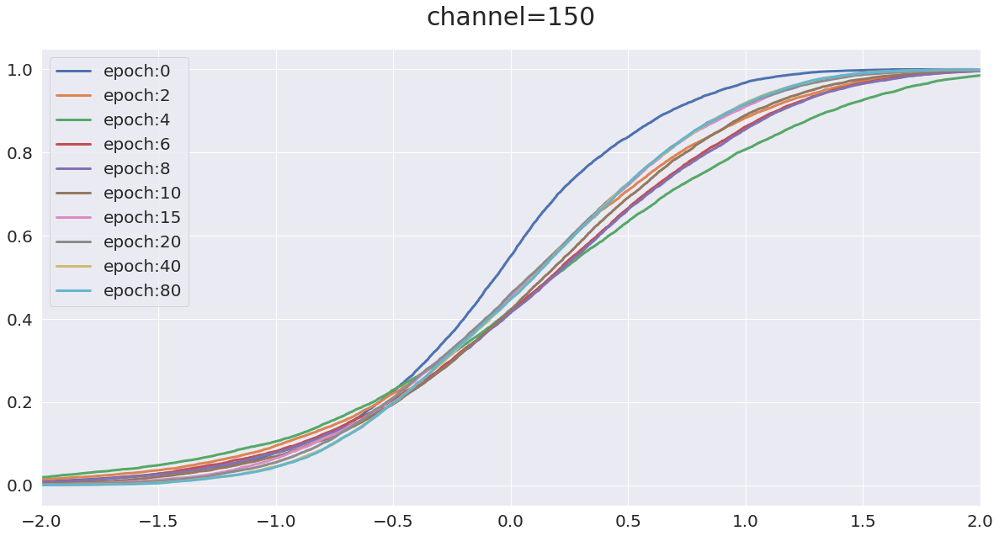

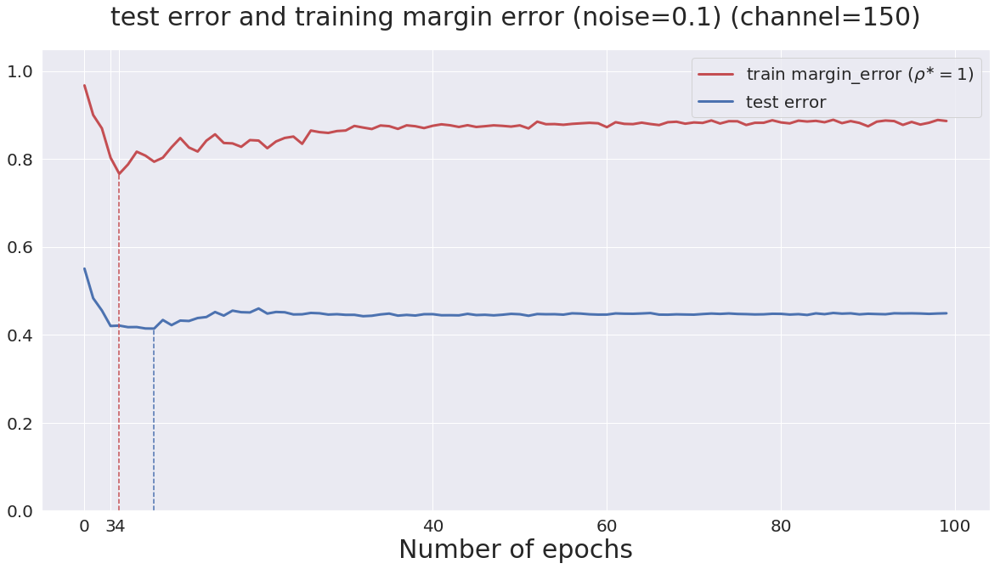

In [249]:
plot_channel(150,[-2,2],1)

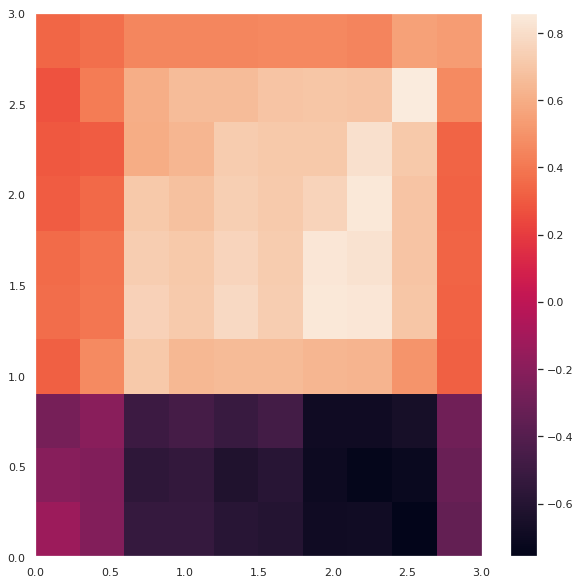

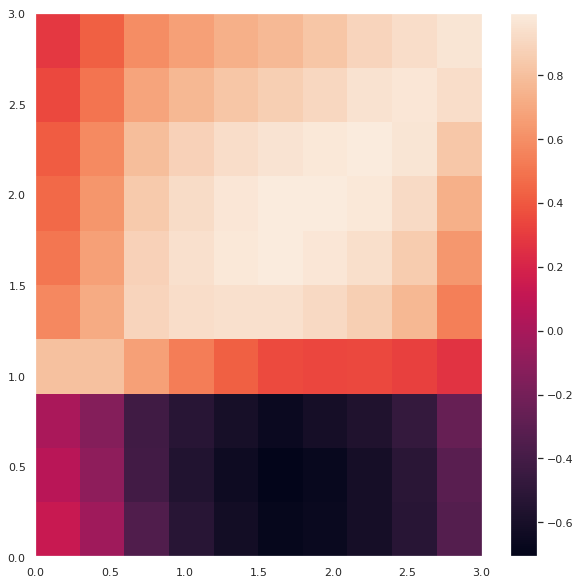

In [11]:
plot_heatmap(150,np.linspace(0,3,11))

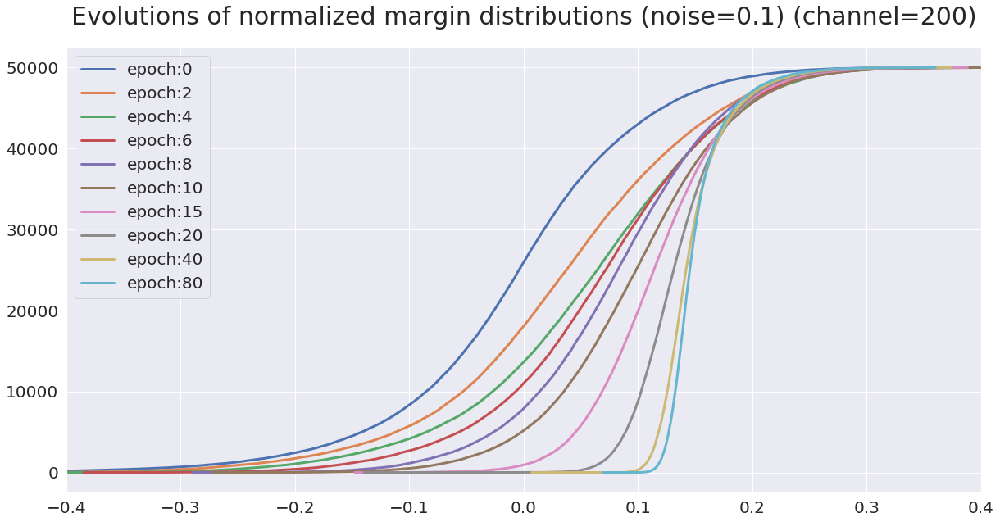

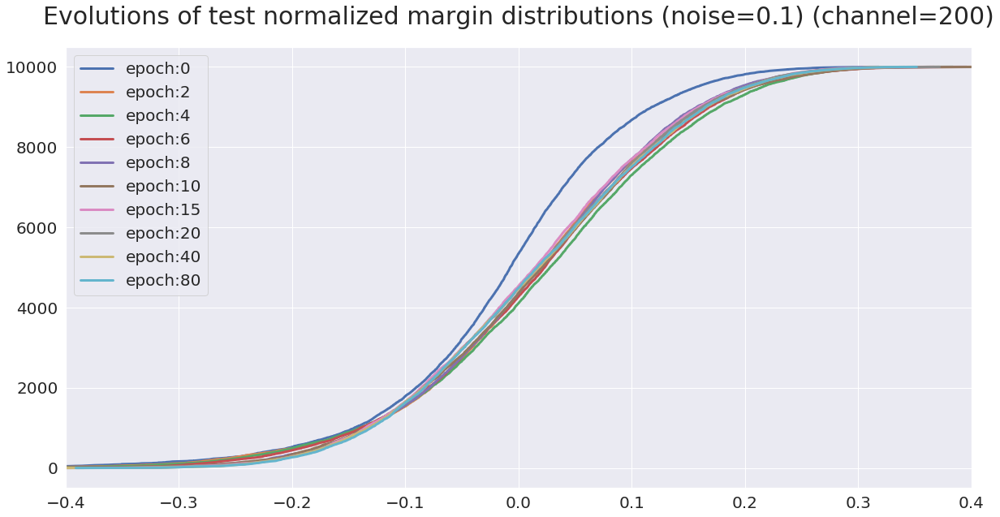

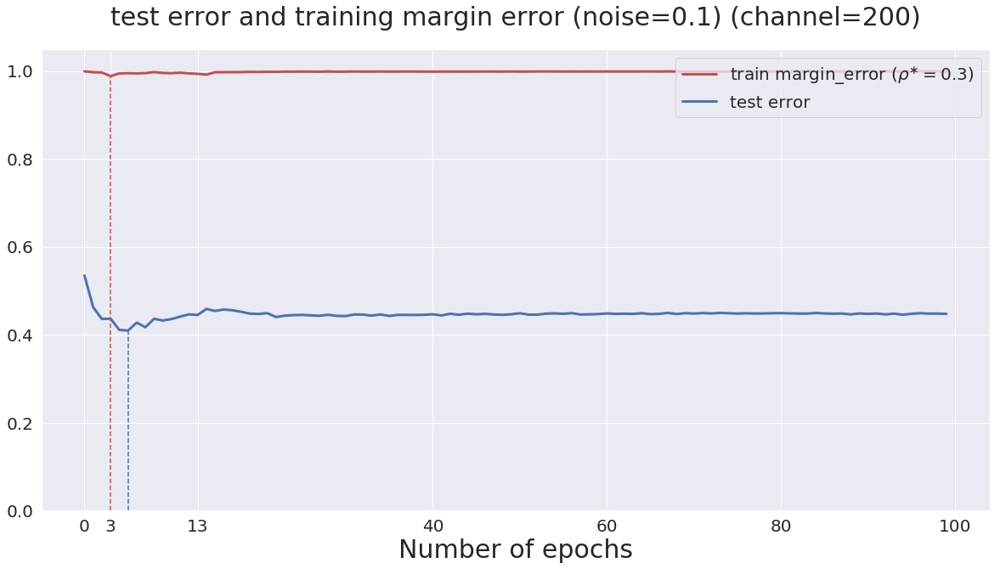

In [385]:
plot_channel(200,[-0.4,0.4],0.3)

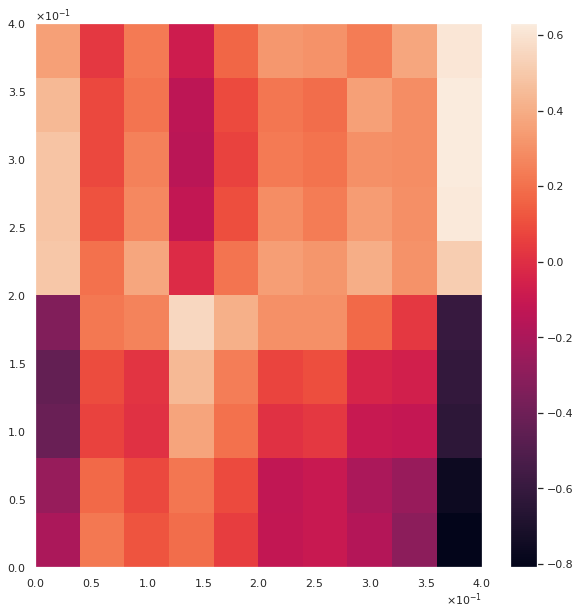

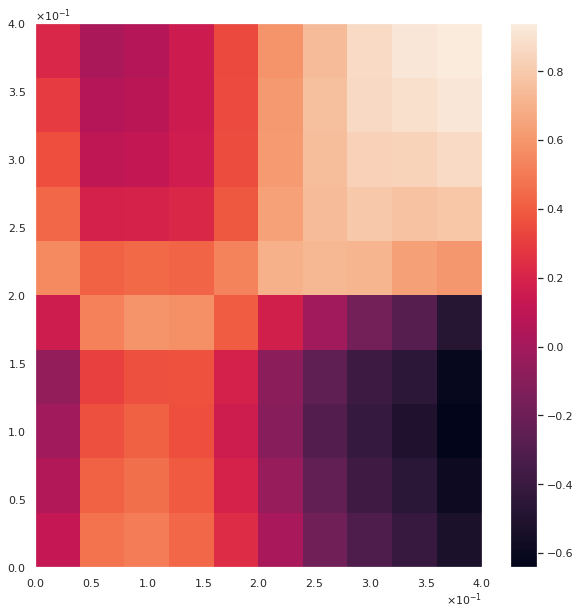

In [12]:
plot_heatmap(200,np.linspace(0,0.4,11))

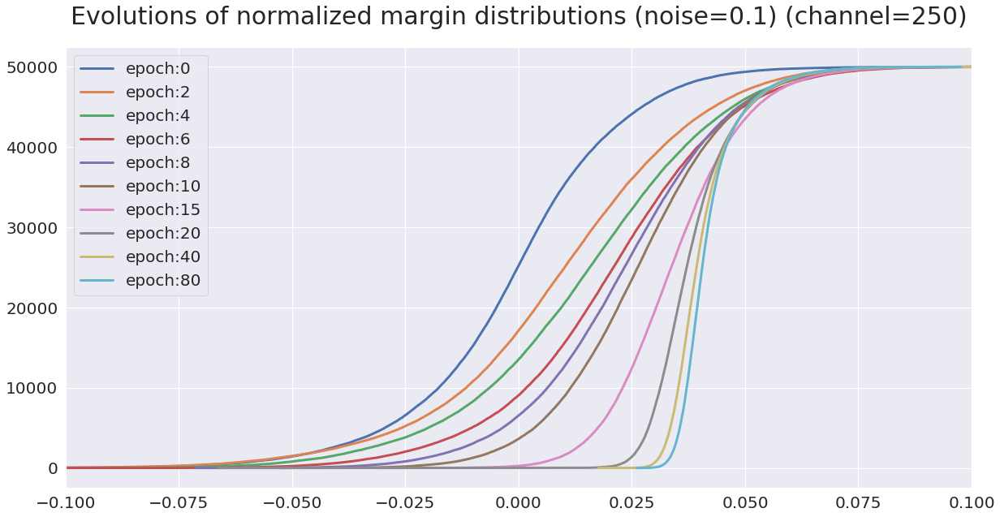

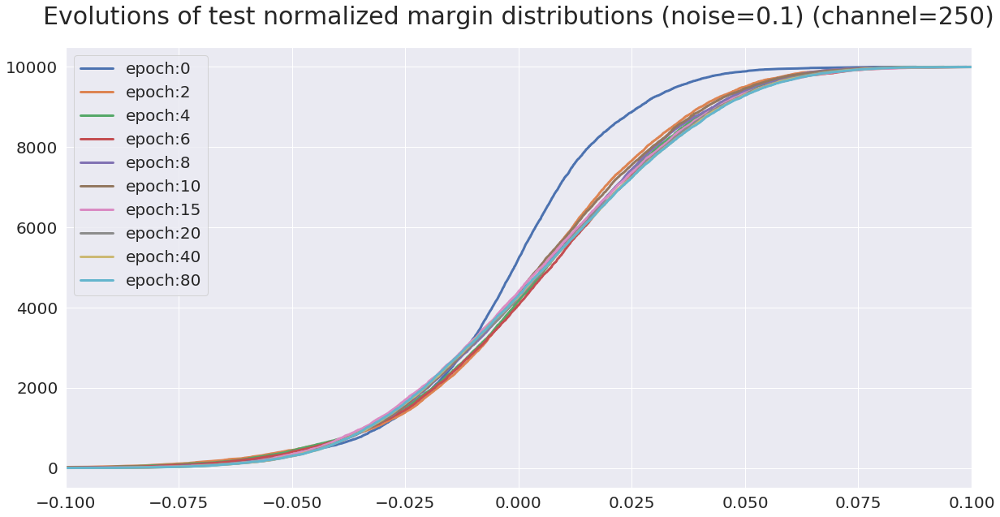

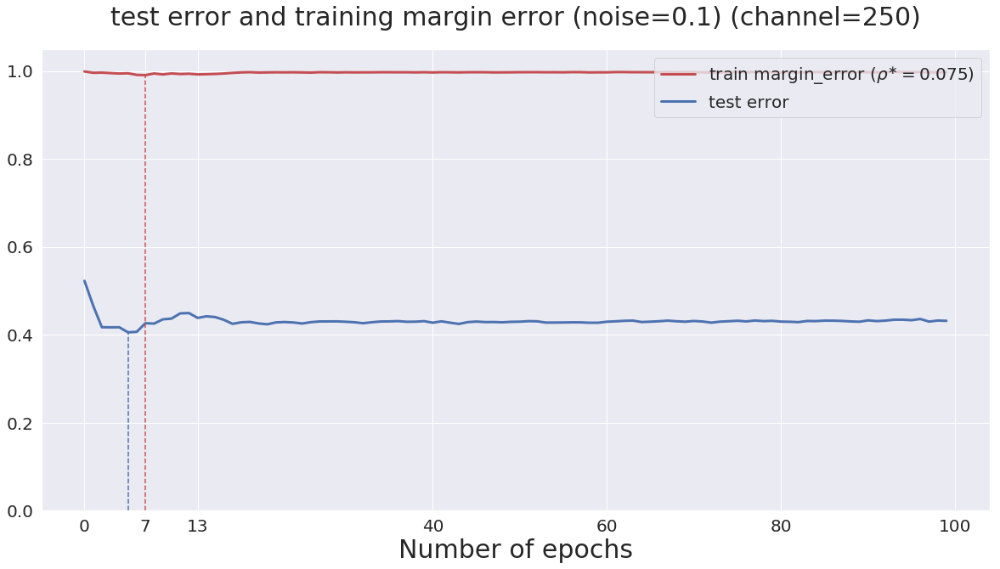

In [386]:
plot_channel(250,[-0.1,0.1],0.075)

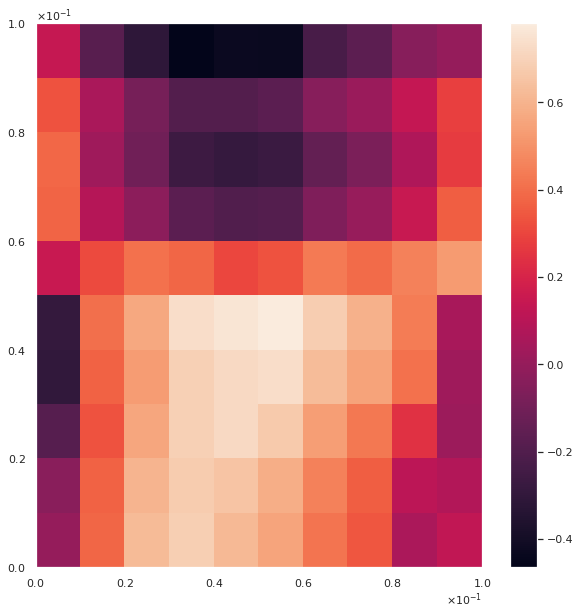

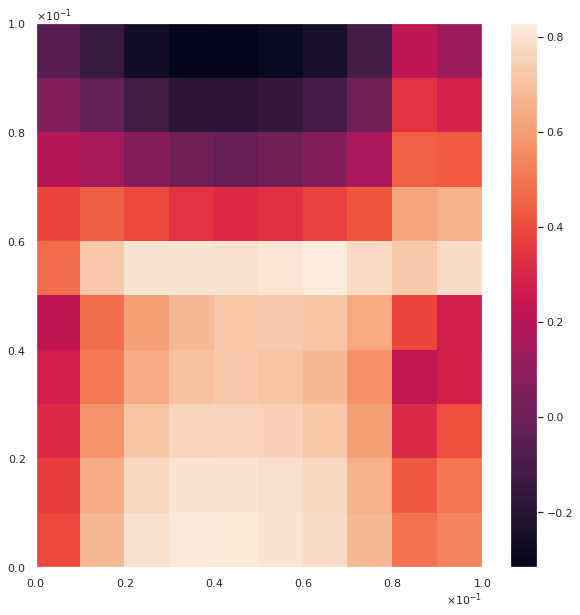

In [13]:
plot_heatmap(250,np.linspace(0,0.1,11))

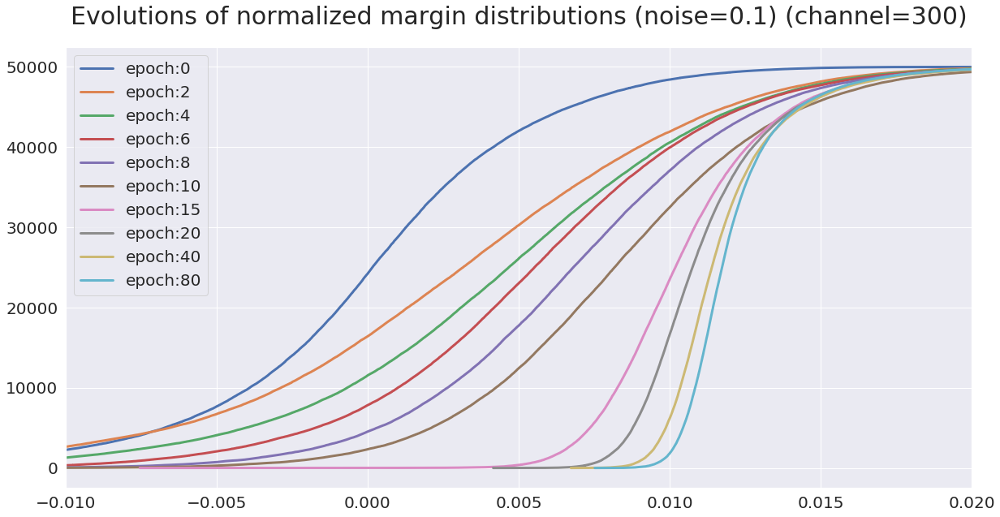

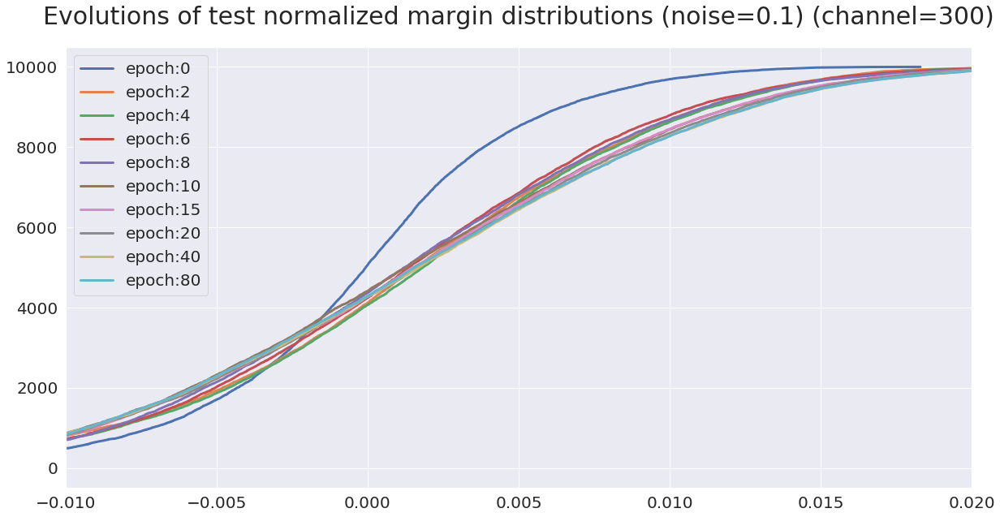

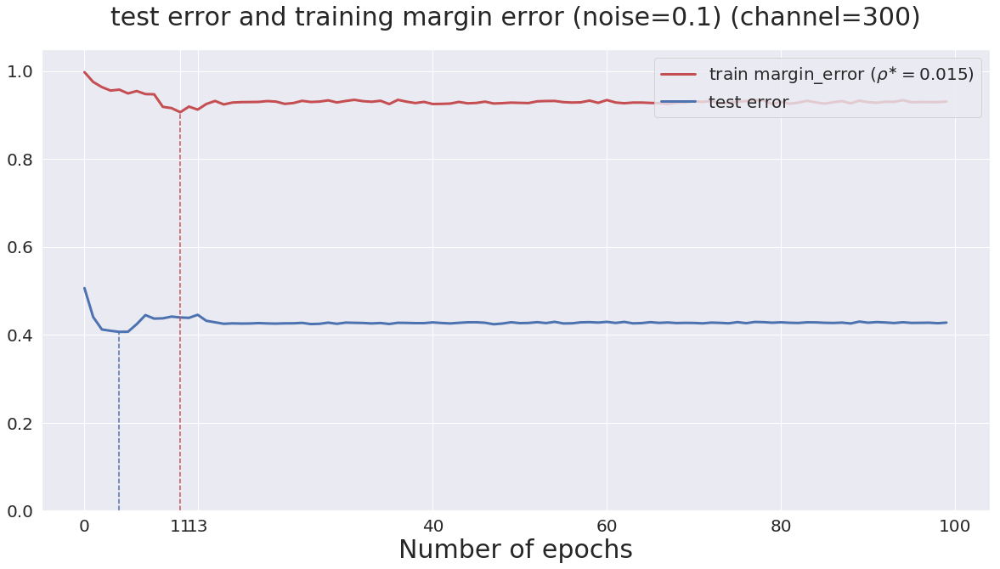

In [387]:
plot_channel(300,[-0.01, 0.02],0.015)

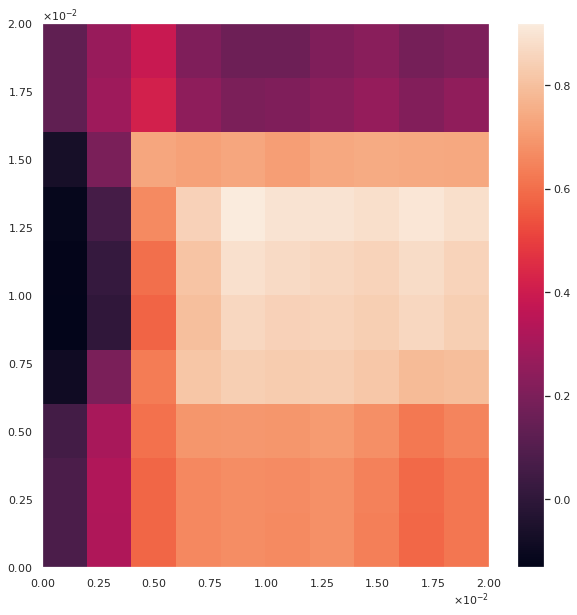

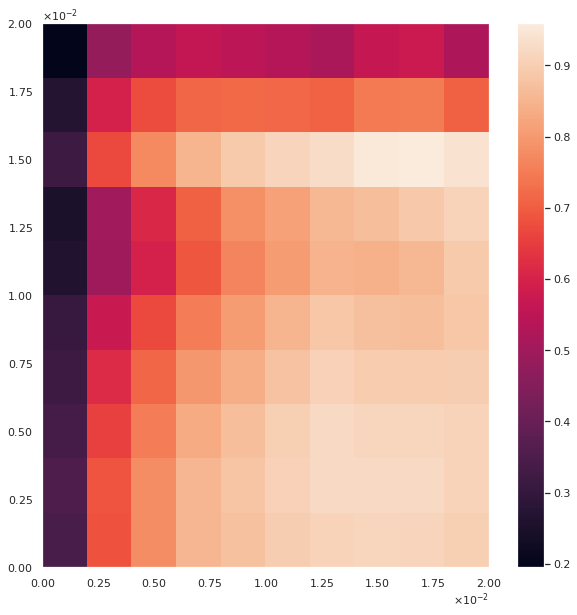

In [14]:
plot_heatmap(300,np.linspace(0,0.02,11))

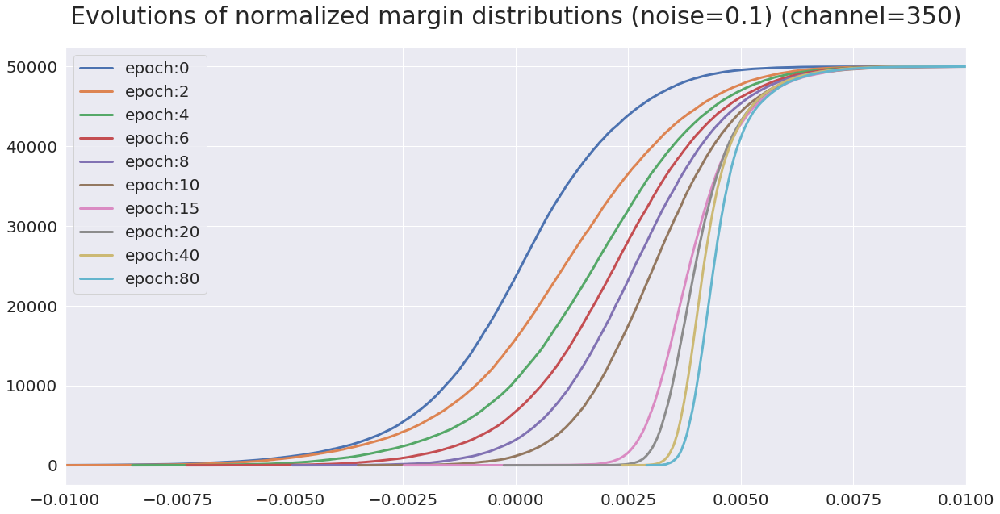

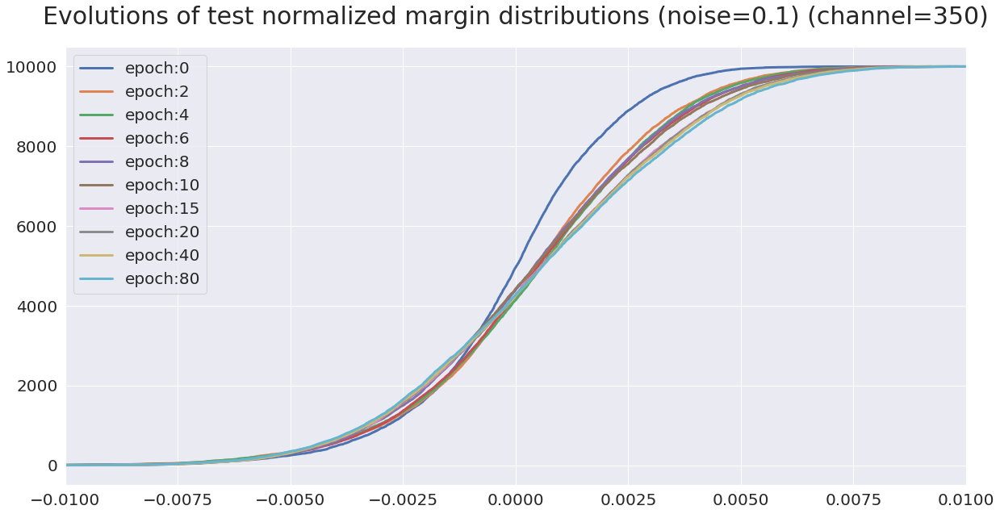

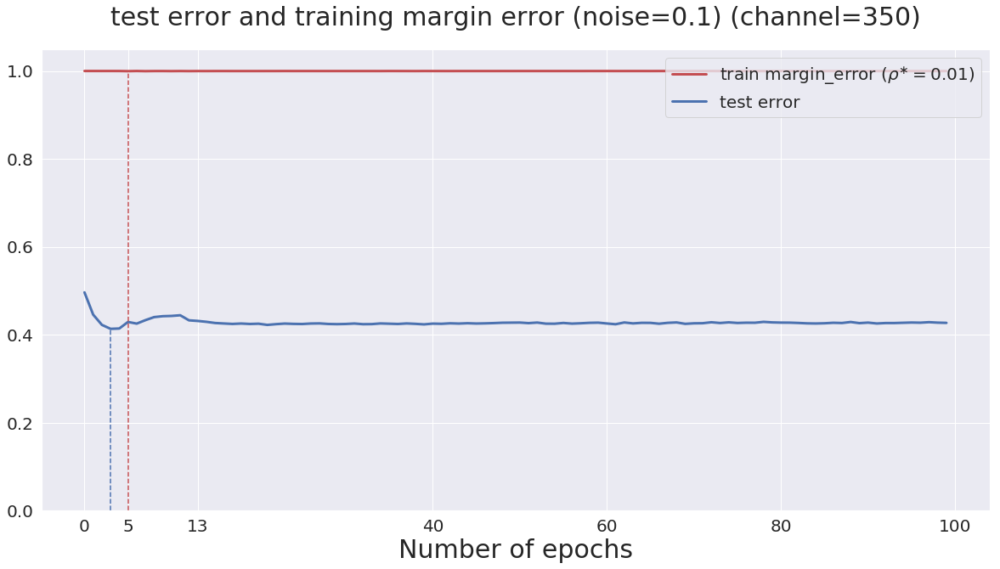

In [388]:
plot_channel(350,[-0.01, 0.01],0.01)

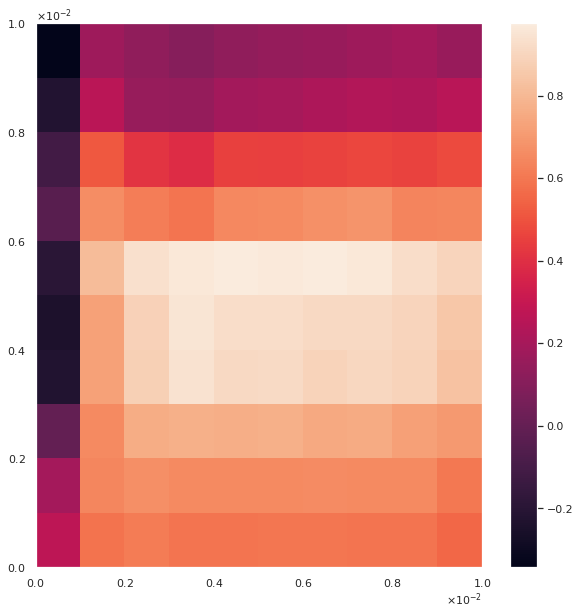

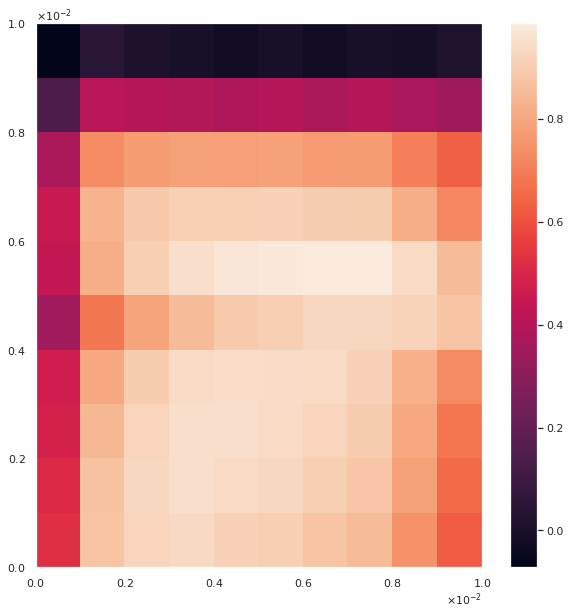

In [15]:
plot_heatmap(350,np.linspace(0,0.01,11))

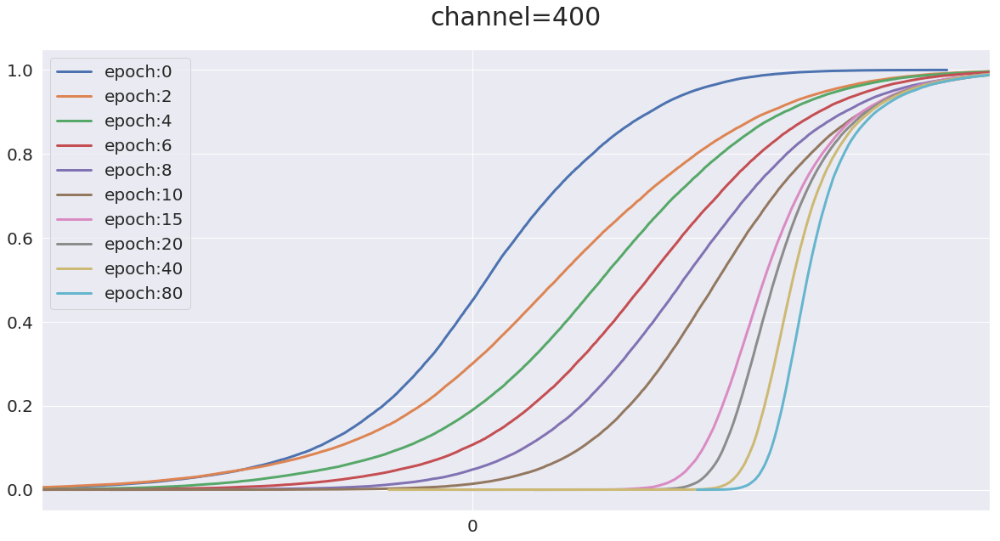

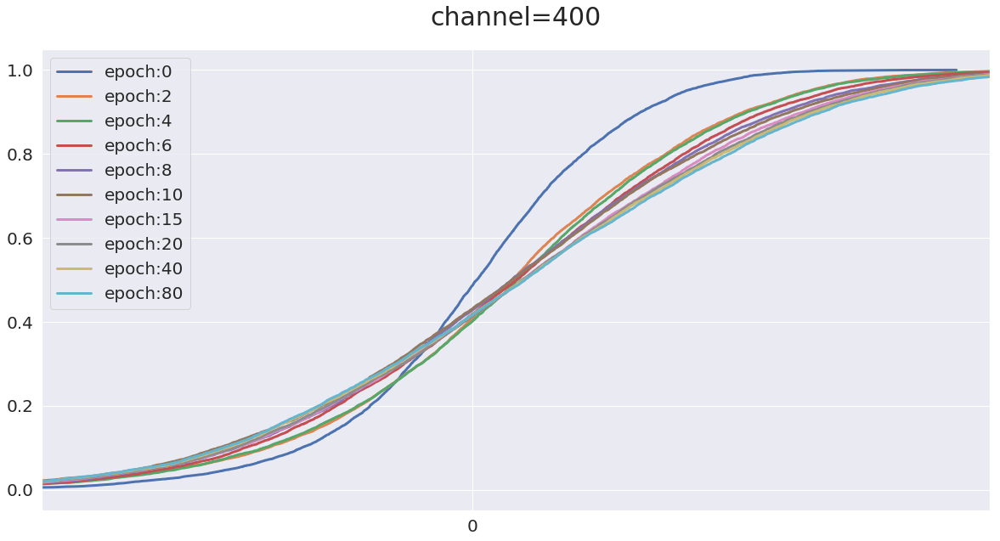

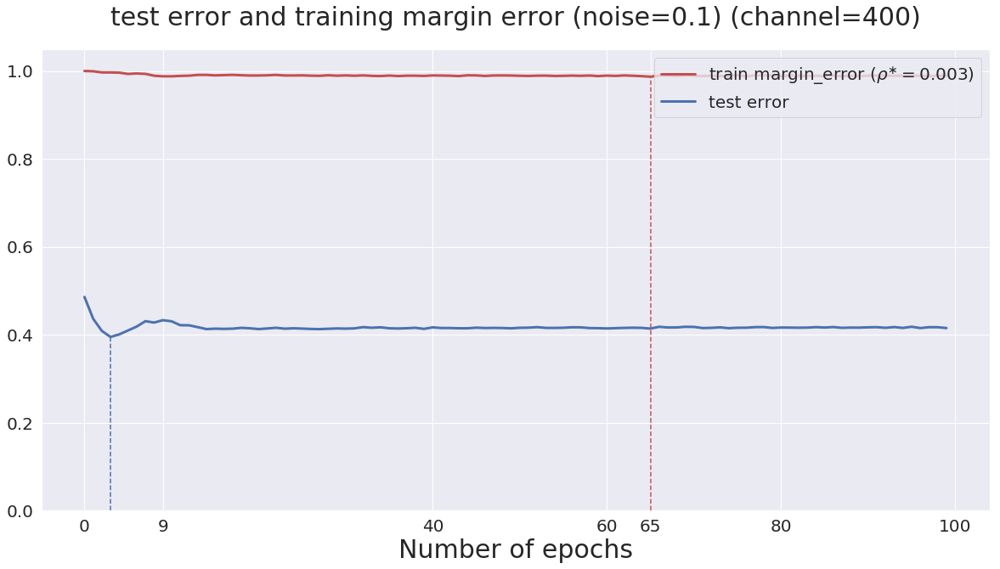

In [107]:
plot_channel(400,[-0.0025, 0.003],0.003)

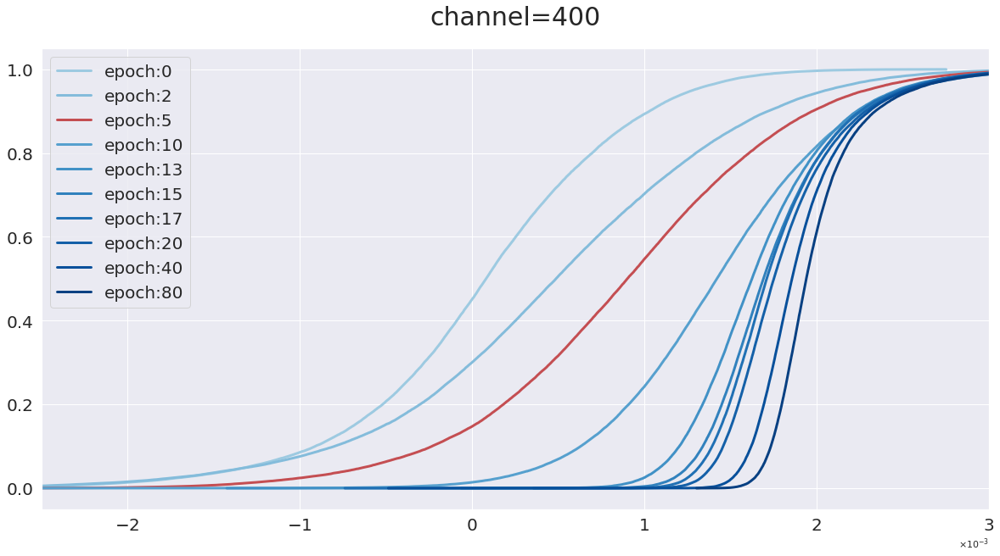

In [281]:
channel=400
interval=[-0.0025, 0.003]
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
plt.title('channel=%d'%channel, fontsize=30, y=1.04)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
for j,i in enumerate([0,2, 5,10,13,15,17,20, 40, 80]):
    if i==5:
        c='r'
        d=5
    else:
        c=sbn.color_palette('Blues',15)[j+5]
        d=3
    exec("ax.plot(np.sort(log_1_%d['margin_train'][i])/log_1_%d['Lip'][i], np.arange(50000)/50000,label=f'epoch:{i}',c=c,linewidth=3)"%(channel,channel))
ax.set_xlim(interval)
from matplotlib import ticker
formatter=ticker.ScalarFormatter(useMathText=True)
formatter.set_scientific(True)
formatter.set_powerlimits((-1,1))
ax.xaxis.set_major_formatter(formatter)
ax.legend(fontsize=20)
exec("fig.savefig('./results_p0.1/nMargin_distribution_%d_4.png'%channel)")
plt.show()

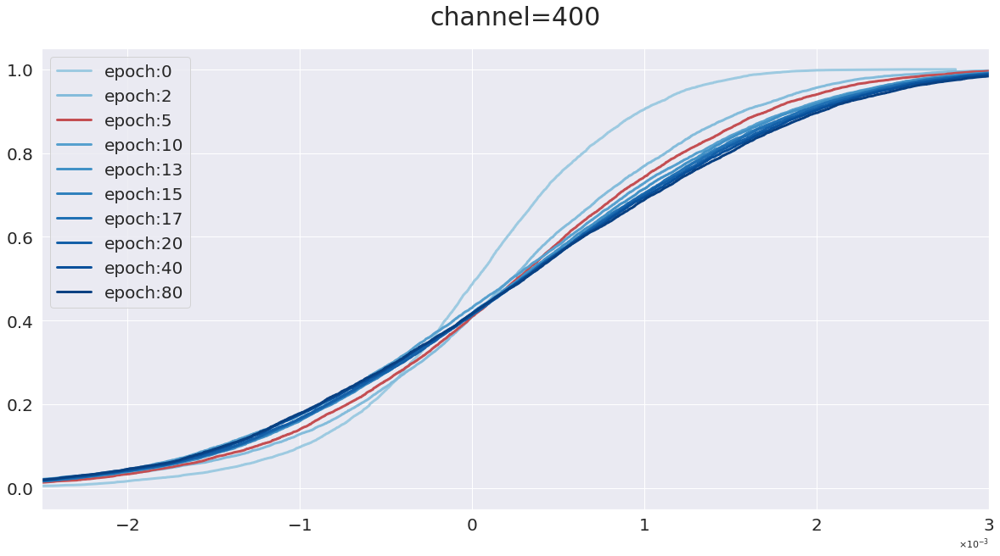

In [240]:
channel=400
interval=[-0.0025, 0.003]
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
plt.title('channel=%d'%channel, fontsize=30, y=1.04)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
for j,i in enumerate([0,2, 5,10,13,15,17,20, 40, 80]):
    if i==5:
        c='r'
        d=5
    else:
        c=sbn.color_palette('Blues',15)[j+5]
        d=3
    exec("ax.plot(np.sort(log_1_%d['margin_test'][i])/log_1_%d['Lip'][i], np.arange(10000)/10000,label=f'epoch:{i}',c=c,linewidth=3)"%(channel,channel))
ax.set_xlim(interval)
from matplotlib import ticker
formatter=ticker.ScalarFormatter(useMathText=True)
formatter.set_scientific(True)
formatter.set_powerlimits((-1,1))
ax.xaxis.set_major_formatter(formatter)
ax.legend(fontsize=20)
exec("fig.savefig('./results_p0.1/test_nMargin_distribution_%d.png'%channel)")
plt.show()

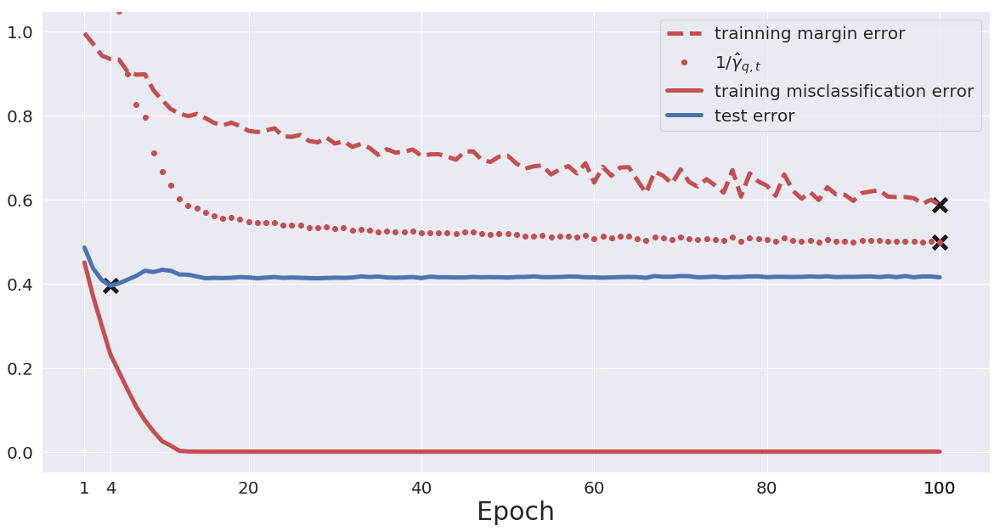

In [237]:
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
train_merror=[margin_error(margin, lip * 0.002) for (margin, lip) in zip(log_1_400['margin_train'], log_1_400['Lip'])]
nqMargin_train = np.array(get_qmargin(log_1_400['margin_train'],
                                                 0.6)) / np.array(log_1_400['Lip'])

ax.plot(train_merror,'r--',linewidth=5,
    label='trainning margin error')
ax.plot(1/nqMargin_train*0.001,'ro', linewidth=5, label=r'$1/\hat{\gamma}_{q,t}$')
ax.plot(log_1_400['train_error'],'r',linewidth=5,label='training misclassification error')

ax.plot(log_1_400['test_error'],'b',linewidth=5,label='test error')
ax.legend(fontsize=20,loc='upper right')
#ax.set_xlim(0,100)
ax.set_ylim(-0.05,1.05)
x1=np.argmin(log_1_400['test_error'])
ax.scatter(x1,log_1_400['test_error'][x1],s=250,c='k',marker='x',linewidth=5)
x2=np.argmin(train_merror)
ax.scatter(x2,train_merror[x2],s=250,c='k',marker='x',linewidth=5)
x3=np.argmin(1/nqMargin_train)
ax.scatter(x3,1/nqMargin_train[x3]*0.001,s=250,c='k',marker='x',linewidth=5)

ax.set_xticks([0,x1,x2,x3,19,39,59,79,99])
ax.set_xticklabels([1,x1+1,x2+1,x3+1,20,40,60,80,100])
ax.set_xlabel('Epoch',fontdict={'size': 30})
fig.savefig('./results_p0.1/training_and_test_error_400.png')

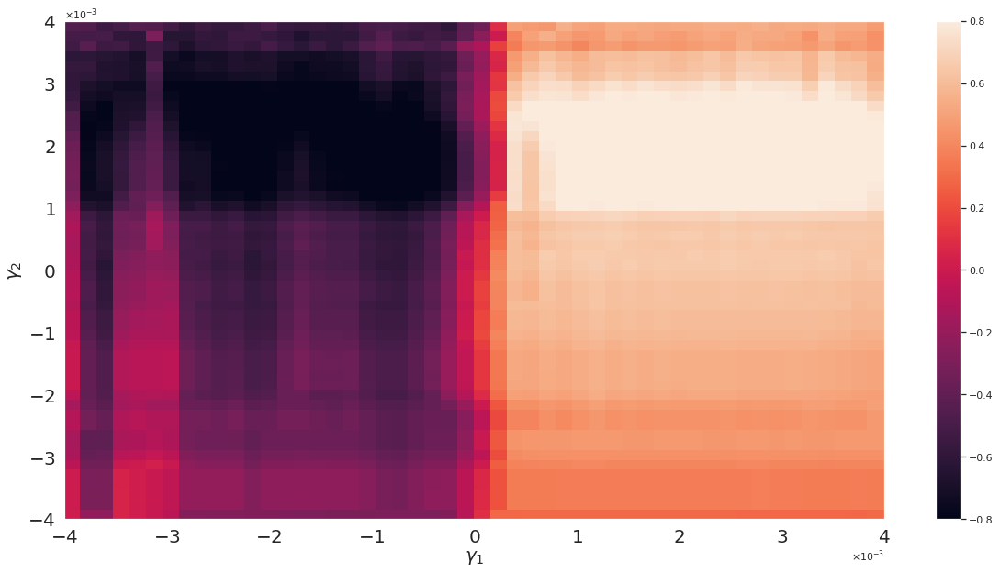

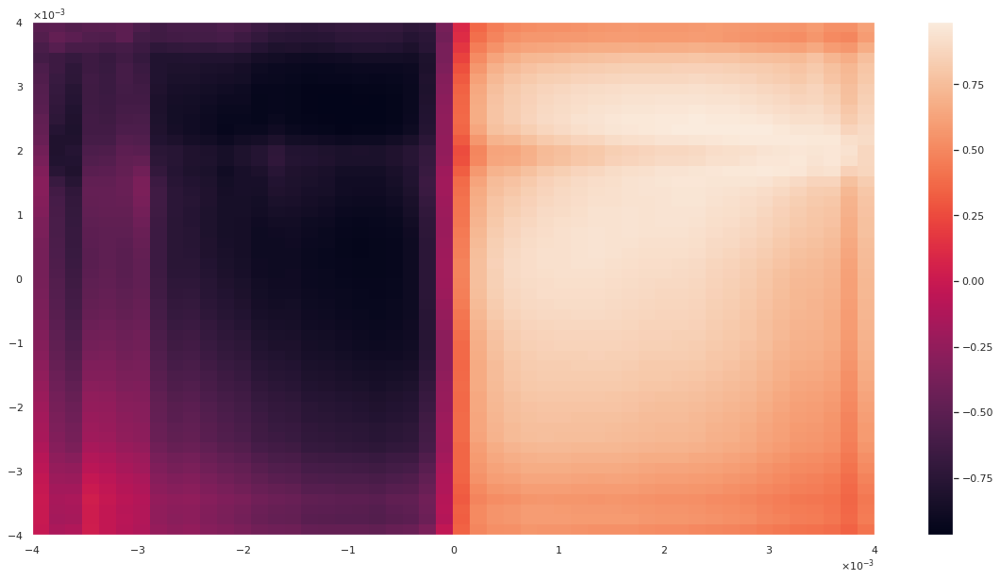

In [268]:
plot_heatmap(400,np.linspace(-0.004,0.004,51))

## Experiments on CIFAR100 with noise=0.1 for channel=50~400

****** label mode: partially-0.1 ******


/home/yhuangcc/.conda/envs/pytorch/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


total parameters: 97200
Epoch 1/100
----------
train1 Loss: 4.4251 rLoss: 170.1313 Error: 0.9388 RampLoss: 0.947034 MarginError: 0.9540 Margin: -6.8003 Lip: 2.8170e-03
test Loss: 4.4311 rLoss: 172.9003 Error: 0.9383 RampLoss: 0.948059 MarginError: 0.9556 Margin: -5.3575 Lip: 2.8170e-03
Saving..
Epoch 2/100
----------
train1 Loss: 4.3147 rLoss: 211.8691 Error: 0.9243 RampLoss: 0.930962 MarginError: 0.9368 Margin: -7.2050 Lip: 2.6233e-03
test Loss: 4.3288 rLoss: 218.2547 Error: 0.9272 RampLoss: 0.933635 MarginError: 0.9392 Margin: -6.8970 Lip: 2.6233e-03
Epoch 3/100
----------
train1 Loss: 4.2116 rLoss: 242.3143 Error: 0.9133 RampLoss: 0.919095 MarginError: 0.9248 Margin: -7.8945 Lip: 2.7525e-03
test Loss: 4.2310 rLoss: 250.8287 Error: 0.9193 RampLoss: 0.925225 MarginError: 0.9303 Margin: -7.3172 Lip: 2.7525e-03
Epoch 4/100
----------
train1 Loss: 4.1075 rLoss: 276.7317 Error: 0.9022 RampLoss: 0.907312 MarginError: 0.9123 Margin: -7.0374 Lip: 2.8799e-03
test Loss: 4.1314 rLoss: 287.5790 

train1 Loss: 2.3061 rLoss: 60.5695 Error: 0.5774 RampLoss: 0.613713 MarginError: 0.6496 Margin: -10.6907 Lip: 1.5458e-02
test Loss: 3.0727 rLoss: 105.9678 Error: 0.7283 RampLoss: 0.752727 MarginError: 0.7767 Margin: -11.1524 Lip: 1.5458e-02
Epoch 33/100
----------
train1 Loss: 2.2588 rLoss: 56.5867 Error: 0.5669 RampLoss: 0.604515 MarginError: 0.6406 Margin: -10.8247 Lip: 1.6108e-02
test Loss: 3.0723 rLoss: 102.8208 Error: 0.7268 RampLoss: 0.751675 MarginError: 0.7760 Margin: -12.4130 Lip: 1.6108e-02
Epoch 34/100
----------
train1 Loss: 2.2427 rLoss: 54.2949 Error: 0.5644 RampLoss: 0.602515 MarginError: 0.6404 Margin: -10.4383 Lip: 1.6993e-02
test Loss: 3.0886 rLoss: 99.7467 Error: 0.7303 RampLoss: 0.755427 MarginError: 0.7802 Margin: -11.0194 Lip: 1.6993e-02
Epoch 35/100
----------
train1 Loss: 2.1808 rLoss: 51.1761 Error: 0.5471 RampLoss: 0.587133 MarginError: 0.6257 Margin: -10.1775 Lip: 1.7156e-02
test Loss: 3.0762 rLoss: 99.0407 Error: 0.7254 RampLoss: 0.751311 MarginError: 0.7765

train1 Loss: 1.5639 rLoss: 17.1812 Error: 0.4123 RampLoss: 0.490709 MarginError: 0.5705 Margin: -12.2569 Lip: 3.8807e-02
test Loss: 3.4398 rLoss: 62.7784 Error: 0.7377 RampLoss: 0.778089 MarginError: 0.8149 Margin: -17.4072 Lip: 3.8807e-02
Epoch 64/100
----------
train1 Loss: 1.5781 rLoss: 17.0518 Error: 0.4179 RampLoss: 0.496064 MarginError: 0.5766 Margin: -12.1008 Lip: 3.9455e-02
test Loss: 3.4711 rLoss: 62.3268 Error: 0.7419 RampLoss: 0.781814 MarginError: 0.8205 Margin: -17.2715 Lip: 3.9455e-02
Epoch 65/100
----------
train1 Loss: 1.5443 rLoss: 16.1570 Error: 0.4073 RampLoss: 0.488349 MarginError: 0.5726 Margin: -11.9276 Lip: 4.1055e-02
test Loss: 3.4737 rLoss: 60.4027 Error: 0.7376 RampLoss: 0.779403 MarginError: 0.8186 Margin: -16.7289 Lip: 4.1055e-02
Epoch 66/100
----------
train1 Loss: 1.5430 rLoss: 16.2384 Error: 0.4092 RampLoss: 0.491564 MarginError: 0.5744 Margin: -12.0366 Lip: 4.1260e-02
test Loss: 3.4814 rLoss: 60.6111 Error: 0.7394 RampLoss: 0.782320 MarginError: 0.8224 M

test Loss: 3.9642 rLoss: 50.3990 Error: 0.7569 RampLoss: 0.807772 MarginError: 0.8514 Margin: -21.4017 Lip: 6.2301e-02
Epoch 95/100
----------
train1 Loss: 1.2245 rLoss: 8.3725 Error: 0.3329 RampLoss: 0.449486 MarginError: 0.5704 Margin: -11.2566 Lip: 6.3806e-02
test Loss: 3.9816 rLoss: 49.7410 Error: 0.7529 RampLoss: 0.803910 MarginError: 0.8503 Margin: -23.7269 Lip: 6.3806e-02
Epoch 96/100
----------
train1 Loss: 1.2633 rLoss: 8.7348 Error: 0.3473 RampLoss: 0.462439 MarginError: 0.5795 Margin: -11.6360 Lip: 6.3646e-02
test Loss: 4.0272 rLoss: 50.4264 Error: 0.7594 RampLoss: 0.810452 MarginError: 0.8556 Margin: -25.1400 Lip: 6.3646e-02
Epoch 97/100
----------
train1 Loss: 1.2366 rLoss: 8.3766 Error: 0.3363 RampLoss: 0.453502 MarginError: 0.5749 Margin: -11.9652 Lip: 6.3618e-02
test Loss: 4.0344 rLoss: 50.5727 Error: 0.7631 RampLoss: 0.811477 MarginError: 0.8552 Margin: -19.9259 Lip: 6.3618e-02
Epoch 98/100
----------
train1 Loss: 1.2341 rLoss: 8.2940 Error: 0.3357 RampLoss: 0.455829 M

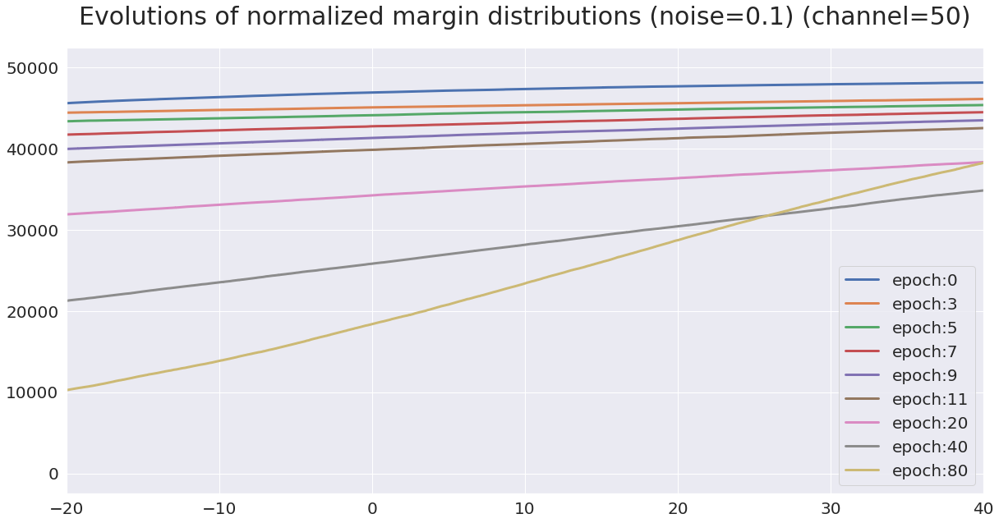

total parameters: 374300
Epoch 1/100
----------
train1 Loss: 4.3284 rLoss: 4.3981 Error: 0.9186 RampLoss: 0.995371 MarginError: 1.0000 Margin: -6.8455 Lip: 2.4785e-01
test Loss: 4.3455 rLoss: 4.4677 Error: 0.9218 RampLoss: 0.995595 MarginError: 1.0000 Margin: -6.9641 Lip: 2.4785e-01
Saving..
Epoch 2/100
----------
train1 Loss: 4.1547 rLoss: 4.3113 Error: 0.8951 RampLoss: 0.991675 MarginError: 1.0000 Margin: -7.2290 Lip: 2.5077e-01
test Loss: 4.1821 rLoss: 4.4281 Error: 0.9038 RampLoss: 0.992233 MarginError: 1.0000 Margin: -7.0793 Lip: 2.5077e-01
Epoch 3/100
----------
train1 Loss: 4.0095 rLoss: 4.2173 Error: 0.8728 RampLoss: 0.987907 MarginError: 1.0000 Margin: -9.0107 Lip: 2.6277e-01
test Loss: 4.0509 rLoss: 4.3824 Error: 0.8869 RampLoss: 0.989057 MarginError: 1.0000 Margin: -8.5720 Lip: 2.6277e-01
Epoch 4/100
----------
train1 Loss: 3.8842 rLoss: 4.0672 Error: 0.8531 RampLoss: 0.985670 MarginError: 1.0000 Margin: -7.4430 Lip: 2.8159e-01
test Loss: 3.9435 rLoss: 4.2700 Error: 0.8707 R

test Loss: 3.4494 rLoss: 3.3135 Error: 0.7438 RampLoss: 0.990233 MarginError: 1.0000 Margin: -18.0376 Lip: 2.4184e+00
Epoch 33/100
----------
train1 Loss: 1.1158 rLoss: 2.2430 Error: 0.2765 RampLoss: 0.971693 MarginError: 1.0000 Margin: -9.5145 Lip: 2.5282e+00
test Loss: 3.4916 rLoss: 3.3133 Error: 0.7404 RampLoss: 0.990486 MarginError: 1.0000 Margin: -16.4452 Lip: 2.5282e+00
Epoch 34/100
----------
train1 Loss: 1.0433 rLoss: 2.2887 Error: 0.2524 RampLoss: 0.971901 MarginError: 1.0000 Margin: -9.3552 Lip: 2.6820e+00
test Loss: 3.5432 rLoss: 3.3588 Error: 0.7392 RampLoss: 0.990648 MarginError: 1.0000 Margin: -18.2876 Lip: 2.6820e+00
Epoch 35/100
----------
train1 Loss: 1.0047 rLoss: 2.3359 Error: 0.2379 RampLoss: 0.972223 MarginError: 1.0000 Margin: -9.6503 Lip: 2.7950e+00
test Loss: 3.5874 rLoss: 3.4003 Error: 0.7480 RampLoss: 0.991372 MarginError: 1.0000 Margin: -16.0024 Lip: 2.7950e+00
Epoch 36/100
----------
train1 Loss: 0.9407 rLoss: 2.3570 Error: 0.2284 RampLoss: 0.972360 MarginEr

train1 Loss: 0.1045 rLoss: 2.8206 Error: 0.0068 RampLoss: 0.971396 MarginError: 1.0000 Margin: -8.9376 Lip: 7.0016e+00
test Loss: 5.3053 rLoss: 3.8043 Error: 0.7747 RampLoss: 0.995219 MarginError: 1.0000 Margin: -30.3048 Lip: 7.0016e+00
Epoch 65/100
----------
train1 Loss: 0.1085 rLoss: 2.8282 Error: 0.0080 RampLoss: 0.971742 MarginError: 1.0000 Margin: -6.3254 Lip: 7.0602e+00
test Loss: 5.3629 rLoss: 3.8091 Error: 0.7775 RampLoss: 0.995237 MarginError: 1.0000 Margin: -29.7040 Lip: 7.0602e+00
Epoch 66/100
----------
train1 Loss: 0.1074 rLoss: 2.8356 Error: 0.0093 RampLoss: 0.971883 MarginError: 1.0000 Margin: -10.0499 Lip: 7.2026e+00
test Loss: 5.4345 rLoss: 3.8114 Error: 0.7817 RampLoss: 0.995247 MarginError: 1.0000 Margin: -29.2864 Lip: 7.2026e+00
Epoch 67/100
----------
train1 Loss: 0.0991 rLoss: 2.8734 Error: 0.0076 RampLoss: 0.972161 MarginError: 1.0000 Margin: -5.7341 Lip: 7.3683e+00
test Loss: 5.4725 rLoss: 3.8409 Error: 0.7798 RampLoss: 0.995495 MarginError: 1.0000 Margin: -31.

test Loss: 6.2713 rLoss: 3.9044 Error: 0.7833 RampLoss: 0.995832 MarginError: 1.0000 Margin: -33.2950 Lip: 9.4068e+00
Epoch 96/100
----------
train1 Loss: 0.0161 rLoss: 2.9563 Error: 0.0004 RampLoss: 0.969652 MarginError: 1.0000 Margin: -8.2909 Lip: 9.4428e+00
test Loss: 6.3013 rLoss: 3.9032 Error: 0.7830 RampLoss: 0.995851 MarginError: 1.0000 Margin: -34.7874 Lip: 9.4428e+00
Epoch 97/100
----------
train1 Loss: 0.0161 rLoss: 2.9785 Error: 0.0003 RampLoss: 0.969964 MarginError: 1.0000 Margin: -11.6171 Lip: 9.5643e+00
test Loss: 6.3163 rLoss: 3.9149 Error: 0.7825 RampLoss: 0.995909 MarginError: 1.0000 Margin: -32.4298 Lip: 9.5643e+00
Epoch 98/100
----------
train1 Loss: 0.0176 rLoss: 2.9822 Error: 0.0005 RampLoss: 0.970270 MarginError: 1.0000 Margin: -7.8440 Lip: 9.6011e+00
test Loss: 6.3904 rLoss: 3.9197 Error: 0.7856 RampLoss: 0.995951 MarginError: 1.0000 Margin: -32.6638 Lip: 9.6011e+00
Epoch 99/100
----------
train1 Loss: 0.0144 rLoss: 2.9758 Error: 0.0003 RampLoss: 0.969852 MarginE

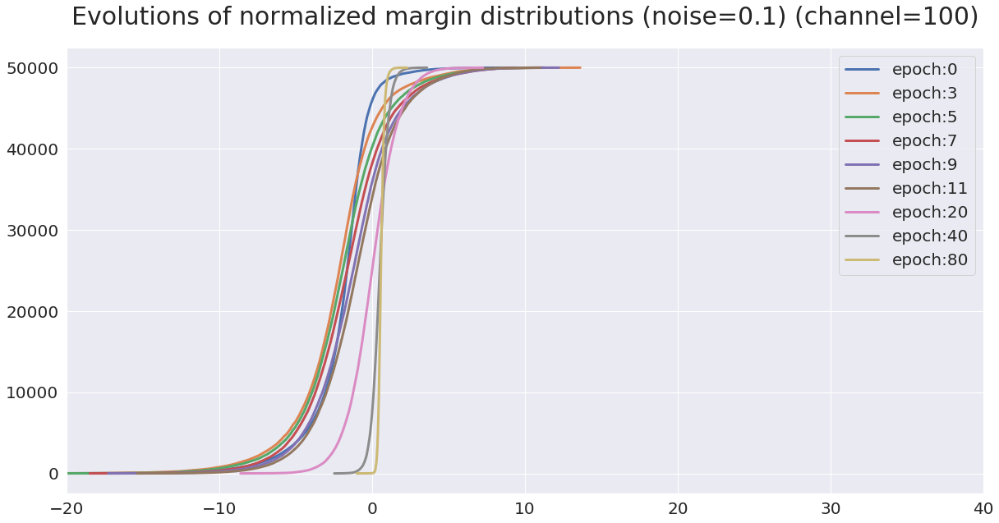

total parameters: 831400
Epoch 1/100
----------
train1 Loss: 4.2288 rLoss: 4.5003 Error: 0.9008 RampLoss: 0.999565 MarginError: 1.0000 Margin: -8.2519 Lip: 4.2712e+00
test Loss: 4.2490 rLoss: 4.5046 Error: 0.9087 RampLoss: 0.999602 MarginError: 1.0000 Margin: -6.7737 Lip: 4.2712e+00
Saving..
Epoch 2/100
----------
train1 Loss: 4.0410 rLoss: 4.4467 Error: 0.8811 RampLoss: 0.999345 MarginError: 1.0000 Margin: -7.0790 Lip: 4.3963e+00
test Loss: 4.0754 rLoss: 4.4539 Error: 0.8917 RampLoss: 0.999403 MarginError: 1.0000 Margin: -6.6909 Lip: 4.3963e+00
Epoch 3/100
----------
train1 Loss: 3.8862 rLoss: 4.4088 Error: 0.8575 RampLoss: 0.999160 MarginError: 1.0000 Margin: -6.8899 Lip: 4.6692e+00
test Loss: 3.9422 rLoss: 4.4201 Error: 0.8749 RampLoss: 0.999262 MarginError: 1.0000 Margin: -7.4431 Lip: 4.6692e+00
Epoch 4/100
----------
train1 Loss: 3.7279 rLoss: 4.3835 Error: 0.8273 RampLoss: 0.998984 MarginError: 1.0000 Margin: -6.9366 Lip: 5.2254e+00
test Loss: 3.8088 rLoss: 4.3986 Error: 0.8492 R

test Loss: 3.9279 rLoss: 4.5081 Error: 0.7539 RampLoss: 0.999492 MarginError: 1.0000 Margin: -17.5040 Lip: 5.1803e+01
Epoch 33/100
----------
train1 Loss: 0.3014 rLoss: 4.4154 Error: 0.0398 RampLoss: 0.997360 MarginError: 1.0000 Margin: -9.0372 Lip: 5.4851e+01
test Loss: 4.0441 rLoss: 4.5108 Error: 0.7514 RampLoss: 0.999499 MarginError: 1.0000 Margin: -20.8709 Lip: 5.4851e+01
Epoch 34/100
----------
train1 Loss: 0.2327 rLoss: 4.4233 Error: 0.0216 RampLoss: 0.997322 MarginError: 1.0000 Margin: -5.5593 Lip: 5.8325e+01
test Loss: 4.0495 rLoss: 4.5166 Error: 0.7560 RampLoss: 0.999534 MarginError: 1.0000 Margin: -19.5949 Lip: 5.8325e+01
Epoch 35/100
----------
train1 Loss: 0.1960 rLoss: 4.4249 Error: 0.0166 RampLoss: 0.997298 MarginError: 1.0000 Margin: -5.1273 Lip: 6.0957e+01
test Loss: 4.1664 rLoss: 4.5184 Error: 0.7589 RampLoss: 0.999541 MarginError: 1.0000 Margin: -18.9912 Lip: 6.0957e+01
Epoch 36/100
----------
train1 Loss: 0.1630 rLoss: 4.4255 Error: 0.0118 RampLoss: 0.997235 MarginEr

train1 Loss: 0.0102 rLoss: 4.4544 Error: 0.0004 RampLoss: 0.996919 MarginError: 1.0000 Margin: -10.6999 Lip: 9.7408e+01
test Loss: 5.0451 rLoss: 4.5417 Error: 0.7694 RampLoss: 0.999628 MarginError: 1.0000 Margin: -25.6494 Lip: 9.7408e+01
Epoch 65/100
----------
train1 Loss: 0.0102 rLoss: 4.4554 Error: 0.0004 RampLoss: 0.996917 MarginError: 1.0000 Margin: -21.4189 Lip: 9.7602e+01
test Loss: 5.0519 rLoss: 4.5427 Error: 0.7687 RampLoss: 0.999632 MarginError: 1.0000 Margin: -25.0486 Lip: 9.7602e+01
Epoch 66/100
----------
train1 Loss: 0.0096 rLoss: 4.4523 Error: 0.0003 RampLoss: 0.996855 MarginError: 1.0000 Margin: -8.0581 Lip: 9.6234e+01
test Loss: 5.0492 rLoss: 4.5412 Error: 0.7666 RampLoss: 0.999623 MarginError: 1.0000 Margin: -24.0908 Lip: 9.6234e+01
Epoch 67/100
----------
train1 Loss: 0.0090 rLoss: 4.4542 Error: 0.0003 RampLoss: 0.996886 MarginError: 1.0000 Margin: -8.4880 Lip: 9.8251e+01
test Loss: 5.0799 rLoss: 4.5420 Error: 0.7679 RampLoss: 0.999627 MarginError: 1.0000 Margin: -25

test Loss: 5.3528 rLoss: 4.5463 Error: 0.7697 RampLoss: 0.999641 MarginError: 1.0000 Margin: -26.0931 Lip: 1.0934e+02
Epoch 96/100
----------
train1 Loss: 0.0050 rLoss: 4.4601 Error: 0.0003 RampLoss: 0.996872 MarginError: 1.0000 Margin: -8.5831 Lip: 1.0900e+02
test Loss: 5.3658 rLoss: 4.5458 Error: 0.7700 RampLoss: 0.999639 MarginError: 1.0000 Margin: -25.8147 Lip: 1.0900e+02
Epoch 97/100
----------
train1 Loss: 0.0047 rLoss: 4.4614 Error: 0.0003 RampLoss: 0.996874 MarginError: 1.0000 Margin: -7.4641 Lip: 1.0964e+02
test Loss: 5.3532 rLoss: 4.5467 Error: 0.7704 RampLoss: 0.999647 MarginError: 1.0000 Margin: -26.4612 Lip: 1.0964e+02
Epoch 98/100
----------
train1 Loss: 0.0047 rLoss: 4.4593 Error: 0.0003 RampLoss: 0.996840 MarginError: 1.0000 Margin: -9.3137 Lip: 1.0821e+02
test Loss: 5.3618 rLoss: 4.5458 Error: 0.7684 RampLoss: 0.999640 MarginError: 1.0000 Margin: -25.9666 Lip: 1.0821e+02
Epoch 99/100
----------
train1 Loss: 0.0044 rLoss: 4.4612 Error: 0.0003 RampLoss: 0.996865 MarginEr

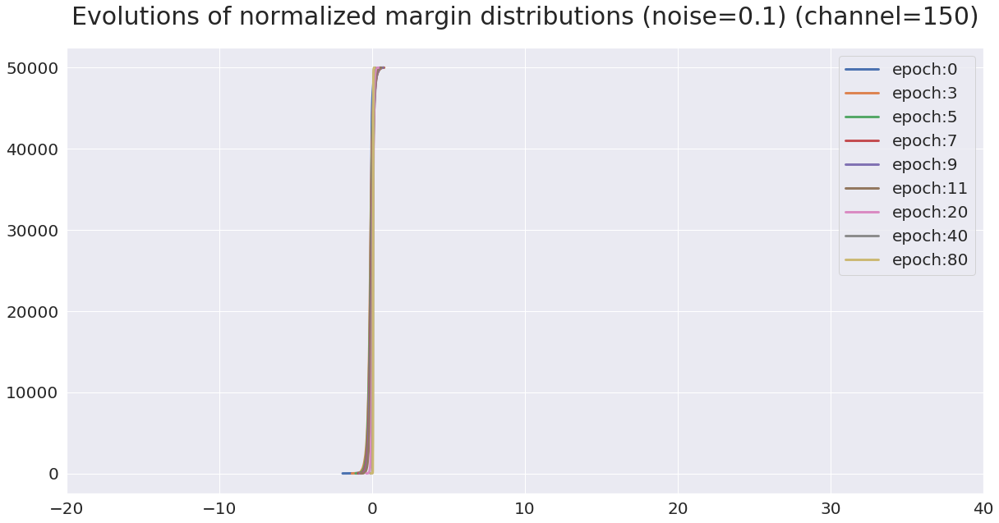

total parameters: 1468500
Epoch 1/100
----------
train1 Loss: 4.1453 rLoss: 4.5859 Error: 0.8891 RampLoss: 0.999912 MarginError: 1.0000 Margin: -7.0939 Lip: 2.9388e+01
test Loss: 4.1684 rLoss: 4.5866 Error: 0.8980 RampLoss: 0.999920 MarginError: 1.0000 Margin: -7.3529 Lip: 2.9388e+01
Saving..
Epoch 2/100
----------
train1 Loss: 3.9247 rLoss: 4.5762 Error: 0.8598 RampLoss: 0.999872 MarginError: 1.0000 Margin: -7.9011 Lip: 3.0489e+01
test Loss: 3.9705 rLoss: 4.5775 Error: 0.8759 RampLoss: 0.999886 MarginError: 1.0000 Margin: -7.2799 Lip: 3.0489e+01
Epoch 3/100
----------
train1 Loss: 3.7129 rLoss: 4.5682 Error: 0.8287 RampLoss: 0.999821 MarginError: 1.0000 Margin: -7.4055 Lip: 3.3326e+01
test Loss: 3.7933 rLoss: 4.5705 Error: 0.8508 RampLoss: 0.999844 MarginError: 1.0000 Margin: -7.0616 Lip: 3.3326e+01
Epoch 4/100
----------
train1 Loss: 3.5541 rLoss: 4.5663 Error: 0.7927 RampLoss: 0.999803 MarginError: 1.0000 Margin: -6.4547 Lip: 3.7162e+01
test Loss: 3.6679 rLoss: 4.5694 Error: 0.8232 

test Loss: 4.0783 rLoss: 4.5912 Error: 0.7414 RampLoss: 0.999913 MarginError: 1.0000 Margin: -23.0015 Lip: 3.6517e+02
Epoch 33/100
----------
train1 Loss: 0.0428 rLoss: 4.5736 Error: 0.0007 RampLoss: 0.999385 MarginError: 1.0000 Margin: -13.1399 Lip: 3.7651e+02
test Loss: 4.1161 rLoss: 4.5916 Error: 0.7461 RampLoss: 0.999915 MarginError: 1.0000 Margin: -21.7572 Lip: 3.7651e+02
Epoch 34/100
----------
train1 Loss: 0.0354 rLoss: 4.5738 Error: 0.0005 RampLoss: 0.999379 MarginError: 1.0000 Margin: -8.8778 Lip: 3.8557e+02
test Loss: 4.1625 rLoss: 4.5919 Error: 0.7453 RampLoss: 0.999917 MarginError: 1.0000 Margin: -21.2155 Lip: 3.8557e+02
Epoch 35/100
----------
train1 Loss: 0.0324 rLoss: 4.5744 Error: 0.0006 RampLoss: 0.999383 MarginError: 1.0000 Margin: -9.5120 Lip: 3.9467e+02
test Loss: 4.1755 rLoss: 4.5921 Error: 0.7466 RampLoss: 0.999919 MarginError: 1.0000 Margin: -21.1957 Lip: 3.9467e+02
Epoch 36/100
----------
train1 Loss: 0.0276 rLoss: 4.5742 Error: 0.0004 RampLoss: 0.999373 MarginE

train1 Loss: 0.0061 rLoss: 4.5769 Error: 0.0003 RampLoss: 0.999355 MarginError: 1.0000 Margin: -6.9495 Lip: 5.0571e+02
test Loss: 4.6675 rLoss: 4.5940 Error: 0.7512 RampLoss: 0.999926 MarginError: 1.0000 Margin: -23.6061 Lip: 5.0571e+02
Epoch 65/100
----------
train1 Loss: 0.0063 rLoss: 4.5772 Error: 0.0003 RampLoss: 0.999362 MarginError: 1.0000 Margin: -8.1832 Lip: 5.1096e+02
test Loss: 4.6908 rLoss: 4.5942 Error: 0.7558 RampLoss: 0.999927 MarginError: 1.0000 Margin: -23.5295 Lip: 5.1096e+02
Epoch 66/100
----------
train1 Loss: 0.0063 rLoss: 4.5771 Error: 0.0003 RampLoss: 0.999358 MarginError: 1.0000 Margin: -6.9658 Lip: 5.0975e+02
test Loss: 4.6902 rLoss: 4.5941 Error: 0.7541 RampLoss: 0.999926 MarginError: 1.0000 Margin: -24.7151 Lip: 5.0975e+02
Epoch 67/100
----------
train1 Loss: 0.0058 rLoss: 4.5769 Error: 0.0003 RampLoss: 0.999353 MarginError: 1.0000 Margin: -6.2404 Lip: 5.0961e+02
test Loss: 4.7076 rLoss: 4.5940 Error: 0.7533 RampLoss: 0.999925 MarginError: 1.0000 Margin: -23.9

test Loss: 4.8989 rLoss: 4.5946 Error: 0.7541 RampLoss: 0.999929 MarginError: 1.0000 Margin: -24.9469 Lip: 5.5485e+02
Epoch 96/100
----------
train1 Loss: 0.0036 rLoss: 4.5776 Error: 0.0003 RampLoss: 0.999350 MarginError: 1.0000 Margin: -5.4143 Lip: 5.5320e+02
test Loss: 4.9024 rLoss: 4.5945 Error: 0.7546 RampLoss: 0.999928 MarginError: 1.0000 Margin: -24.8160 Lip: 5.5320e+02
Epoch 97/100
----------
train1 Loss: 0.0035 rLoss: 4.5783 Error: 0.0003 RampLoss: 0.999363 MarginError: 1.0000 Margin: -5.6125 Lip: 5.6512e+02
test Loss: 4.9004 rLoss: 4.5949 Error: 0.7555 RampLoss: 0.999929 MarginError: 1.0000 Margin: -24.7679 Lip: 5.6512e+02
Epoch 98/100
----------
train1 Loss: 0.0034 rLoss: 4.5777 Error: 0.0003 RampLoss: 0.999348 MarginError: 1.0000 Margin: -5.8310 Lip: 5.5417e+02
test Loss: 4.9008 rLoss: 4.5946 Error: 0.7550 RampLoss: 0.999928 MarginError: 1.0000 Margin: -25.1441 Lip: 5.5417e+02
Epoch 99/100
----------
train1 Loss: 0.0032 rLoss: 4.5778 Error: 0.0003 RampLoss: 0.999348 MarginEr

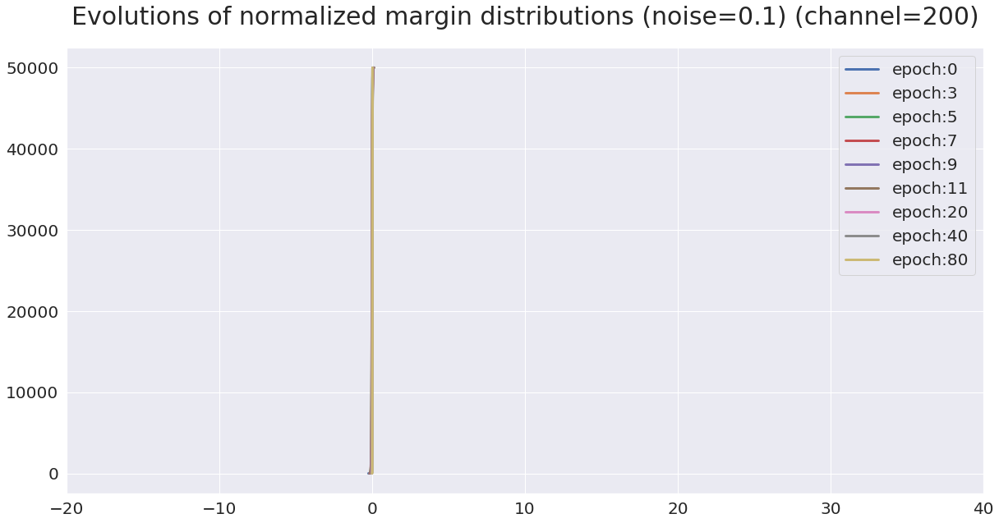

total parameters: 2285600
Epoch 1/100
----------
train1 Loss: 4.0824 rLoss: 4.6005 Error: 0.8762 RampLoss: 0.999981 MarginError: 1.0000 Margin: -7.8693 Lip: 1.3924e+02
test Loss: 4.1125 rLoss: 4.6007 Error: 0.8849 RampLoss: 0.999982 MarginError: 1.0000 Margin: -6.2910 Lip: 1.3924e+02
Saving..
Epoch 2/100
----------
train1 Loss: 3.8338 rLoss: 4.5979 Error: 0.8425 RampLoss: 0.999969 MarginError: 1.0000 Margin: -7.8896 Lip: 1.4397e+02
test Loss: 3.8875 rLoss: 4.5983 Error: 0.8618 RampLoss: 0.999972 MarginError: 1.0000 Margin: -6.2598 Lip: 1.4397e+02
Epoch 3/100
----------
train1 Loss: 3.6429 rLoss: 4.5970 Error: 0.8034 RampLoss: 0.999959 MarginError: 1.0000 Margin: -6.9880 Lip: 1.5854e+02
test Loss: 3.7341 rLoss: 4.5975 Error: 0.8292 RampLoss: 0.999965 MarginError: 1.0000 Margin: -5.9097 Lip: 1.5854e+02
Epoch 4/100
----------
train1 Loss: 3.4483 rLoss: 4.5962 Error: 0.7621 RampLoss: 0.999952 MarginError: 1.0000 Margin: -6.7194 Lip: 1.7693e+02
test Loss: 3.5831 rLoss: 4.5970 Error: 0.8026 

test Loss: 3.9606 rLoss: 4.6017 Error: 0.7368 RampLoss: 0.999977 MarginError: 1.0000 Margin: -21.6074 Lip: 1.4467e+03
Epoch 33/100
----------
train1 Loss: 0.0210 rLoss: 4.5968 Error: 0.0004 RampLoss: 0.999819 MarginError: 1.0000 Margin: -7.6833 Lip: 1.4588e+03
test Loss: 3.9697 rLoss: 4.6017 Error: 0.7366 RampLoss: 0.999977 MarginError: 1.0000 Margin: -21.1564 Lip: 1.4588e+03
Epoch 34/100
----------
train1 Loss: 0.0188 rLoss: 4.5969 Error: 0.0004 RampLoss: 0.999820 MarginError: 1.0000 Margin: -8.7049 Lip: 1.4945e+03
test Loss: 4.0022 rLoss: 4.6018 Error: 0.7368 RampLoss: 0.999977 MarginError: 1.0000 Margin: -22.1988 Lip: 1.4945e+03
Epoch 35/100
----------
train1 Loss: 0.0175 rLoss: 4.5969 Error: 0.0004 RampLoss: 0.999819 MarginError: 1.0000 Margin: -7.2368 Lip: 1.5053e+03
test Loss: 4.0183 rLoss: 4.6018 Error: 0.7353 RampLoss: 0.999977 MarginError: 1.0000 Margin: -21.4710 Lip: 1.5053e+03
Epoch 36/100
----------
train1 Loss: 0.0157 rLoss: 4.5968 Error: 0.0004 RampLoss: 0.999816 MarginEr

train1 Loss: 0.0051 rLoss: 4.5973 Error: 0.0003 RampLoss: 0.999812 MarginError: 1.0000 Margin: -5.1220 Lip: 1.7915e+03
test Loss: 4.3533 rLoss: 4.6021 Error: 0.7409 RampLoss: 0.999978 MarginError: 1.0000 Margin: -23.5648 Lip: 1.7915e+03
Epoch 65/100
----------
train1 Loss: 0.0050 rLoss: 4.5974 Error: 0.0003 RampLoss: 0.999813 MarginError: 1.0000 Margin: -4.2351 Lip: 1.8060e+03
test Loss: 4.3555 rLoss: 4.6022 Error: 0.7381 RampLoss: 0.999978 MarginError: 1.0000 Margin: -24.2476 Lip: 1.8060e+03
Epoch 66/100
----------
train1 Loss: 0.0048 rLoss: 4.5974 Error: 0.0003 RampLoss: 0.999813 MarginError: 1.0000 Margin: -4.2511 Lip: 1.8199e+03
test Loss: 4.3698 rLoss: 4.6022 Error: 0.7394 RampLoss: 0.999978 MarginError: 1.0000 Margin: -24.1884 Lip: 1.8199e+03
Epoch 67/100
----------
train1 Loss: 0.0047 rLoss: 4.5974 Error: 0.0003 RampLoss: 0.999813 MarginError: 1.0000 Margin: -4.6296 Lip: 1.8276e+03
test Loss: 4.3735 rLoss: 4.6022 Error: 0.7415 RampLoss: 0.999978 MarginError: 1.0000 Margin: -23.4

test Loss: 4.5135 rLoss: 4.6023 Error: 0.7412 RampLoss: 0.999979 MarginError: 1.0000 Margin: -24.8587 Lip: 1.9565e+03
Epoch 96/100
----------
train1 Loss: 0.0029 rLoss: 4.5976 Error: 0.0003 RampLoss: 0.999811 MarginError: 1.0000 Margin: -3.0435 Lip: 1.9605e+03
test Loss: 4.5334 rLoss: 4.6023 Error: 0.7424 RampLoss: 0.999979 MarginError: 1.0000 Margin: -25.2676 Lip: 1.9605e+03
Epoch 97/100
----------
train1 Loss: 0.0029 rLoss: 4.5976 Error: 0.0003 RampLoss: 0.999812 MarginError: 1.0000 Margin: -4.8463 Lip: 1.9762e+03
test Loss: 4.5216 rLoss: 4.6023 Error: 0.7398 RampLoss: 0.999979 MarginError: 1.0000 Margin: -25.2785 Lip: 1.9762e+03
Epoch 98/100
----------
train1 Loss: 0.0029 rLoss: 4.5977 Error: 0.0003 RampLoss: 0.999813 MarginError: 1.0000 Margin: -3.5168 Lip: 1.9912e+03
test Loss: 4.5395 rLoss: 4.6024 Error: 0.7406 RampLoss: 0.999979 MarginError: 1.0000 Margin: -24.9250 Lip: 1.9912e+03
Epoch 99/100
----------
train1 Loss: 0.0028 rLoss: 4.5976 Error: 0.0003 RampLoss: 0.999811 MarginEr

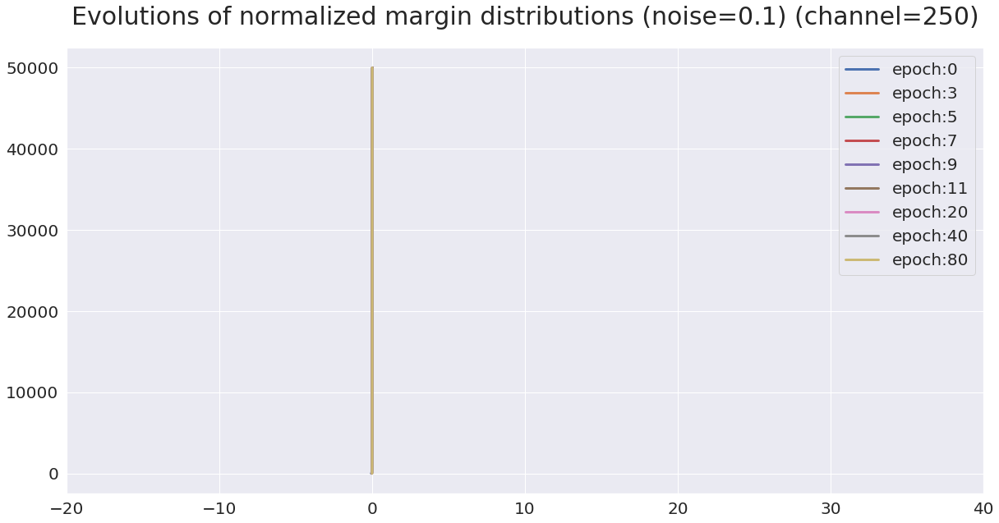

total parameters: 3282700
Epoch 1/100
----------
train1 Loss: 4.0226 rLoss: 4.6037 Error: 0.8672 RampLoss: 0.999994 MarginError: 1.0000 Margin: -6.3379 Lip: 5.1573e+02
test Loss: 4.0583 rLoss: 4.6038 Error: 0.8817 RampLoss: 0.999995 MarginError: 1.0000 Margin: -6.0700 Lip: 5.1573e+02
Saving..
Epoch 2/100
----------
train1 Loss: 3.7630 rLoss: 4.6031 Error: 0.8241 RampLoss: 0.999990 MarginError: 1.0000 Margin: -7.9106 Lip: 5.3018e+02
test Loss: 3.8359 rLoss: 4.6032 Error: 0.8425 RampLoss: 0.999991 MarginError: 1.0000 Margin: -8.2707 Lip: 5.3018e+02
Epoch 3/100
----------
train1 Loss: 3.5349 rLoss: 4.6027 Error: 0.7776 RampLoss: 0.999987 MarginError: 1.0000 Margin: -6.8505 Lip: 5.7477e+02
test Loss: 3.6532 rLoss: 4.6029 Error: 0.8127 RampLoss: 0.999989 MarginError: 1.0000 Margin: -5.6926 Lip: 5.7477e+02
Epoch 4/100
----------
train1 Loss: 3.2970 rLoss: 4.6022 Error: 0.7419 RampLoss: 0.999983 MarginError: 1.0000 Margin: -7.4139 Lip: 6.3346e+02
test Loss: 3.4665 rLoss: 4.6025 Error: 0.7843 

test Loss: 3.8164 rLoss: 4.6040 Error: 0.7277 RampLoss: 0.999992 MarginError: 1.0000 Margin: -22.3152 Lip: 4.2121e+03
Epoch 33/100
----------
train1 Loss: 0.0144 rLoss: 4.6023 Error: 0.0004 RampLoss: 0.999934 MarginError: 1.0000 Margin: -5.6157 Lip: 4.2481e+03
test Loss: 3.8405 rLoss: 4.6040 Error: 0.7280 RampLoss: 0.999992 MarginError: 1.0000 Margin: -22.7256 Lip: 4.2481e+03
Epoch 34/100
----------
train1 Loss: 0.0135 rLoss: 4.6023 Error: 0.0003 RampLoss: 0.999934 MarginError: 1.0000 Margin: -7.2229 Lip: 4.3061e+03
test Loss: 3.8525 rLoss: 4.6040 Error: 0.7302 RampLoss: 0.999992 MarginError: 1.0000 Margin: -22.8683 Lip: 4.3061e+03
Epoch 35/100
----------
train1 Loss: 0.0130 rLoss: 4.6023 Error: 0.0003 RampLoss: 0.999934 MarginError: 1.0000 Margin: -8.1477 Lip: 4.3530e+03
test Loss: 3.8512 rLoss: 4.6040 Error: 0.7298 RampLoss: 0.999992 MarginError: 1.0000 Margin: -23.5768 Lip: 4.3530e+03
Epoch 36/100
----------
train1 Loss: 0.0125 rLoss: 4.6023 Error: 0.0003 RampLoss: 0.999934 MarginEr

train1 Loss: 0.0042 rLoss: 4.6025 Error: 0.0003 RampLoss: 0.999932 MarginError: 1.0000 Margin: -5.2196 Lip: 5.1360e+03
test Loss: 4.1289 rLoss: 4.6042 Error: 0.7330 RampLoss: 0.999992 MarginError: 1.0000 Margin: -25.1723 Lip: 5.1360e+03
Epoch 65/100
----------
train1 Loss: 0.0042 rLoss: 4.6025 Error: 0.0003 RampLoss: 0.999932 MarginError: 1.0000 Margin: -5.4410 Lip: 5.1192e+03
test Loss: 4.1291 rLoss: 4.6042 Error: 0.7343 RampLoss: 0.999992 MarginError: 1.0000 Margin: -25.1537 Lip: 5.1192e+03
Epoch 66/100
----------
train1 Loss: 0.0041 rLoss: 4.6025 Error: 0.0003 RampLoss: 0.999932 MarginError: 1.0000 Margin: -4.6514 Lip: 5.1234e+03
test Loss: 4.1414 rLoss: 4.6042 Error: 0.7344 RampLoss: 0.999992 MarginError: 1.0000 Margin: -26.0667 Lip: 5.1234e+03
Epoch 67/100
----------
train1 Loss: 0.0041 rLoss: 4.6024 Error: 0.0003 RampLoss: 0.999931 MarginError: 1.0000 Margin: -4.4868 Lip: 5.1061e+03
test Loss: 4.1419 rLoss: 4.6041 Error: 0.7344 RampLoss: 0.999992 MarginError: 1.0000 Margin: -25.3

test Loss: 4.2662 rLoss: 4.6042 Error: 0.7342 RampLoss: 0.999992 MarginError: 1.0000 Margin: -26.9442 Lip: 5.4429e+03
Epoch 96/100
----------
train1 Loss: 0.0026 rLoss: 4.6025 Error: 0.0003 RampLoss: 0.999931 MarginError: 1.0000 Margin: -3.4933 Lip: 5.4630e+03
test Loss: 4.2777 rLoss: 4.6042 Error: 0.7366 RampLoss: 0.999992 MarginError: 1.0000 Margin: -26.9653 Lip: 5.4630e+03
Epoch 97/100
----------
train1 Loss: 0.0025 rLoss: 4.6025 Error: 0.0003 RampLoss: 0.999931 MarginError: 1.0000 Margin: -3.4860 Lip: 5.5083e+03
test Loss: 4.2909 rLoss: 4.6042 Error: 0.7344 RampLoss: 0.999992 MarginError: 1.0000 Margin: -26.9514 Lip: 5.5083e+03
Epoch 98/100
----------
train1 Loss: 0.0025 rLoss: 4.6025 Error: 0.0003 RampLoss: 0.999931 MarginError: 1.0000 Margin: -3.6983 Lip: 5.4889e+03
test Loss: 4.2794 rLoss: 4.6042 Error: 0.7350 RampLoss: 0.999992 MarginError: 1.0000 Margin: -27.0960 Lip: 5.4889e+03
Epoch 99/100
----------
train1 Loss: 0.0025 rLoss: 4.6025 Error: 0.0003 RampLoss: 0.999931 MarginEr

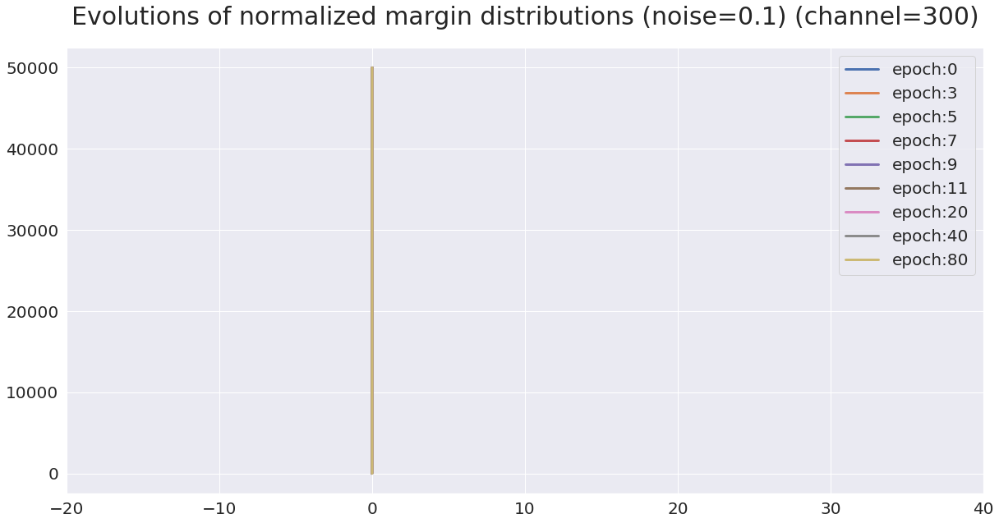

total parameters: 4459800
Epoch 1/100
----------
train1 Loss: 3.9607 rLoss: 4.6046 Error: 0.8599 RampLoss: 0.999998 MarginError: 1.0000 Margin: -6.8788 Lip: 1.5742e+03
test Loss: 4.0054 rLoss: 4.6047 Error: 0.8750 RampLoss: 0.999998 MarginError: 1.0000 Margin: -7.3486 Lip: 1.5742e+03
Saving..
Epoch 2/100
----------
train1 Loss: 3.6729 rLoss: 4.6044 Error: 0.8047 RampLoss: 0.999996 MarginError: 1.0000 Margin: -6.8947 Lip: 1.6187e+03
test Loss: 3.7618 rLoss: 4.6044 Error: 0.8297 RampLoss: 0.999997 MarginError: 1.0000 Margin: -7.0115 Lip: 1.6187e+03
Epoch 3/100
----------
train1 Loss: 3.4182 rLoss: 4.6043 Error: 0.7609 RampLoss: 0.999995 MarginError: 1.0000 Margin: -6.8008 Lip: 1.7725e+03
test Loss: 3.5631 rLoss: 4.6043 Error: 0.7936 RampLoss: 0.999996 MarginError: 1.0000 Margin: -6.1069 Lip: 1.7725e+03
Epoch 4/100
----------
train1 Loss: 3.1940 rLoss: 4.6042 Error: 0.7069 RampLoss: 0.999994 MarginError: 1.0000 Margin: -7.3298 Lip: 1.9634e+03
test Loss: 3.4068 rLoss: 4.6043 Error: 0.7645 

test Loss: 3.7378 rLoss: 4.6048 Error: 0.7309 RampLoss: 0.999997 MarginError: 1.0000 Margin: -18.4430 Lip: 1.1515e+04
Epoch 33/100
----------
train1 Loss: 0.0117 rLoss: 4.6041 Error: 0.0003 RampLoss: 0.999974 MarginError: 1.0000 Margin: -7.8049 Lip: 1.1529e+04
test Loss: 3.7502 rLoss: 4.6048 Error: 0.7306 RampLoss: 0.999997 MarginError: 1.0000 Margin: -18.0392 Lip: 1.1529e+04
Epoch 34/100
----------
train1 Loss: 0.0110 rLoss: 4.6041 Error: 0.0003 RampLoss: 0.999974 MarginError: 1.0000 Margin: -7.8636 Lip: 1.1685e+04
test Loss: 3.7658 rLoss: 4.6048 Error: 0.7293 RampLoss: 0.999997 MarginError: 1.0000 Margin: -18.4649 Lip: 1.1685e+04
Epoch 35/100
----------
train1 Loss: 0.0102 rLoss: 4.6041 Error: 0.0003 RampLoss: 0.999974 MarginError: 1.0000 Margin: -4.6508 Lip: 1.1727e+04
test Loss: 3.7741 rLoss: 4.6048 Error: 0.7283 RampLoss: 0.999997 MarginError: 1.0000 Margin: -18.1857 Lip: 1.1727e+04
Epoch 36/100
----------
train1 Loss: 0.0096 rLoss: 4.6041 Error: 0.0003 RampLoss: 0.999974 MarginEr

train1 Loss: 0.0039 rLoss: 4.6041 Error: 0.0003 RampLoss: 0.999973 MarginError: 1.0000 Margin: -4.8014 Lip: 1.3386e+04
test Loss: 3.9984 rLoss: 4.6048 Error: 0.7300 RampLoss: 0.999997 MarginError: 1.0000 Margin: -19.3910 Lip: 1.3386e+04
Epoch 65/100
----------
train1 Loss: 0.0038 rLoss: 4.6042 Error: 0.0003 RampLoss: 0.999974 MarginError: 1.0000 Margin: -4.4329 Lip: 1.3497e+04
test Loss: 3.9978 rLoss: 4.6048 Error: 0.7323 RampLoss: 0.999997 MarginError: 1.0000 Margin: -19.5608 Lip: 1.3497e+04
Epoch 66/100
----------
train1 Loss: 0.0037 rLoss: 4.6042 Error: 0.0003 RampLoss: 0.999974 MarginError: 1.0000 Margin: -5.1610 Lip: 1.3598e+04
test Loss: 4.0135 rLoss: 4.6048 Error: 0.7336 RampLoss: 0.999997 MarginError: 1.0000 Margin: -20.1563 Lip: 1.3598e+04
Epoch 67/100
----------
train1 Loss: 0.0037 rLoss: 4.6041 Error: 0.0003 RampLoss: 0.999973 MarginError: 1.0000 Margin: -5.1504 Lip: 1.3528e+04
test Loss: 4.0117 rLoss: 4.6048 Error: 0.7324 RampLoss: 0.999997 MarginError: 1.0000 Margin: -19.7

test Loss: 4.1210 rLoss: 4.6048 Error: 0.7354 RampLoss: 0.999997 MarginError: 1.0000 Margin: -20.1059 Lip: 1.4167e+04
Epoch 96/100
----------
train1 Loss: 0.0024 rLoss: 4.6042 Error: 0.0003 RampLoss: 0.999973 MarginError: 1.0000 Margin: -3.4299 Lip: 1.4280e+04
test Loss: 4.1183 rLoss: 4.6048 Error: 0.7327 RampLoss: 0.999997 MarginError: 1.0000 Margin: -20.2181 Lip: 1.4280e+04
Epoch 97/100
----------
train1 Loss: 0.0024 rLoss: 4.6042 Error: 0.0003 RampLoss: 0.999973 MarginError: 1.0000 Margin: -3.1439 Lip: 1.4258e+04
test Loss: 4.1164 rLoss: 4.6048 Error: 0.7357 RampLoss: 0.999997 MarginError: 1.0000 Margin: -20.3856 Lip: 1.4258e+04
Epoch 98/100
----------
train1 Loss: 0.0024 rLoss: 4.6042 Error: 0.0003 RampLoss: 0.999973 MarginError: 1.0000 Margin: -4.4159 Lip: 1.4344e+04
test Loss: 4.1246 rLoss: 4.6048 Error: 0.7339 RampLoss: 0.999997 MarginError: 1.0000 Margin: -20.4613 Lip: 1.4344e+04
Epoch 99/100
----------
train1 Loss: 0.0024 rLoss: 4.6042 Error: 0.0003 RampLoss: 0.999973 MarginEr

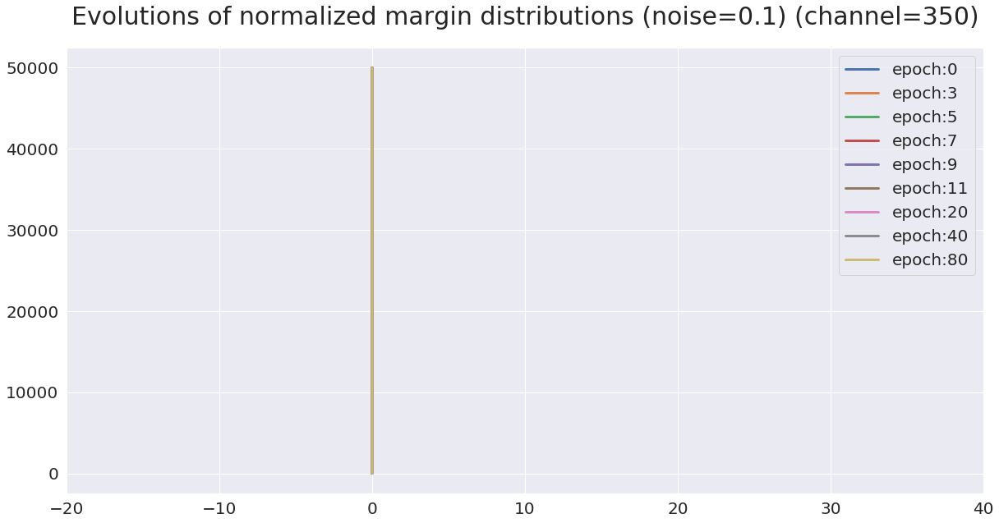

total parameters: 5816900
Epoch 1/100
----------
train1 Loss: 3.9195 rLoss: 4.6049 Error: 0.8544 RampLoss: 0.999999 MarginError: 1.0000 Margin: -6.8929 Lip: 3.7040e+03
test Loss: 3.9629 rLoss: 4.6049 Error: 0.8669 RampLoss: 0.999999 MarginError: 1.0000 Margin: -5.9466 Lip: 3.7040e+03
Saving..
Epoch 2/100
----------
train1 Loss: 3.6371 rLoss: 4.6048 Error: 0.8052 RampLoss: 0.999998 MarginError: 1.0000 Margin: -6.6618 Lip: 3.8505e+03
test Loss: 3.7282 rLoss: 4.6049 Error: 0.8332 RampLoss: 0.999999 MarginError: 1.0000 Margin: -7.0882 Lip: 3.8505e+03
Epoch 3/100
----------
train1 Loss: 3.3769 rLoss: 4.6047 Error: 0.7519 RampLoss: 0.999998 MarginError: 1.0000 Margin: -6.7350 Lip: 4.0439e+03
test Loss: 3.5272 rLoss: 4.6048 Error: 0.7895 RampLoss: 0.999998 MarginError: 1.0000 Margin: -6.9907 Lip: 4.0439e+03
Epoch 4/100
----------
train1 Loss: 3.1424 rLoss: 4.6047 Error: 0.7054 RampLoss: 0.999997 MarginError: 1.0000 Margin: -7.0050 Lip: 4.5817e+03
test Loss: 3.3599 rLoss: 4.6048 Error: 0.7653 

test Loss: 3.6228 rLoss: 4.6050 Error: 0.7174 RampLoss: 0.999999 MarginError: 1.0000 Margin: -17.9398 Lip: 2.5408e+04
Epoch 33/100
----------
train1 Loss: 0.0104 rLoss: 4.6047 Error: 0.0003 RampLoss: 0.999988 MarginError: 1.0000 Margin: -7.2565 Lip: 2.5640e+04
test Loss: 3.6370 rLoss: 4.6050 Error: 0.7172 RampLoss: 0.999999 MarginError: 1.0000 Margin: -18.4765 Lip: 2.5640e+04
Epoch 34/100
----------
train1 Loss: 0.0097 rLoss: 4.6047 Error: 0.0003 RampLoss: 0.999988 MarginError: 1.0000 Margin: -5.3848 Lip: 2.6072e+04
test Loss: 3.6521 rLoss: 4.6050 Error: 0.7215 RampLoss: 0.999999 MarginError: 1.0000 Margin: -18.2358 Lip: 2.6072e+04
Epoch 35/100
----------
train1 Loss: 0.0095 rLoss: 4.6047 Error: 0.0003 RampLoss: 0.999988 MarginError: 1.0000 Margin: -15.2657 Lip: 2.6179e+04
test Loss: 3.6532 rLoss: 4.6050 Error: 0.7193 RampLoss: 0.999999 MarginError: 1.0000 Margin: -18.3281 Lip: 2.6179e+04
Epoch 36/100
----------
train1 Loss: 0.0087 rLoss: 4.6047 Error: 0.0003 RampLoss: 0.999988 MarginE

train1 Loss: 0.0036 rLoss: 4.6047 Error: 0.0003 RampLoss: 0.999988 MarginError: 1.0000 Margin: -4.2579 Lip: 2.9387e+04
test Loss: 3.8482 rLoss: 4.6050 Error: 0.7240 RampLoss: 0.999999 MarginError: 1.0000 Margin: -20.4926 Lip: 2.9387e+04
Epoch 65/100
----------
train1 Loss: 0.0035 rLoss: 4.6047 Error: 0.0003 RampLoss: 0.999988 MarginError: 1.0000 Margin: -3.9010 Lip: 2.9646e+04
test Loss: 3.8496 rLoss: 4.6050 Error: 0.7238 RampLoss: 0.999999 MarginError: 1.0000 Margin: -20.2835 Lip: 2.9646e+04
Epoch 66/100
----------
train1 Loss: 0.0034 rLoss: 4.6047 Error: 0.0003 RampLoss: 0.999988 MarginError: 1.0000 Margin: -3.8998 Lip: 2.9625e+04
test Loss: 3.8573 rLoss: 4.6050 Error: 0.7220 RampLoss: 0.999999 MarginError: 1.0000 Margin: -20.0924 Lip: 2.9625e+04
Epoch 67/100
----------
train1 Loss: 0.0035 rLoss: 4.6047 Error: 0.0003 RampLoss: 0.999988 MarginError: 1.0000 Margin: -4.6556 Lip: 2.9711e+04
test Loss: 3.8626 rLoss: 4.6050 Error: 0.7234 RampLoss: 0.999999 MarginError: 1.0000 Margin: -20.3

test Loss: 3.9560 rLoss: 4.6050 Error: 0.7240 RampLoss: 0.999999 MarginError: 1.0000 Margin: -21.1095 Lip: 3.1153e+04
Epoch 96/100
----------
train1 Loss: 0.0022 rLoss: 4.6047 Error: 0.0003 RampLoss: 0.999987 MarginError: 1.0000 Margin: -3.3322 Lip: 3.1339e+04
test Loss: 3.9650 rLoss: 4.6050 Error: 0.7234 RampLoss: 0.999999 MarginError: 1.0000 Margin: -21.0694 Lip: 3.1339e+04
Epoch 97/100
----------
train1 Loss: 0.0021 rLoss: 4.6047 Error: 0.0003 RampLoss: 0.999987 MarginError: 1.0000 Margin: -3.8087 Lip: 3.1324e+04
test Loss: 3.9579 rLoss: 4.6050 Error: 0.7234 RampLoss: 0.999999 MarginError: 1.0000 Margin: -21.4954 Lip: 3.1324e+04
Epoch 98/100
----------
train1 Loss: 0.0022 rLoss: 4.6047 Error: 0.0003 RampLoss: 0.999987 MarginError: 1.0000 Margin: -3.7153 Lip: 3.1302e+04
test Loss: 3.9612 rLoss: 4.6050 Error: 0.7236 RampLoss: 0.999999 MarginError: 1.0000 Margin: -21.4219 Lip: 3.1302e+04
Epoch 99/100
----------
train1 Loss: 0.0021 rLoss: 4.6047 Error: 0.0003 RampLoss: 0.999987 MarginEr

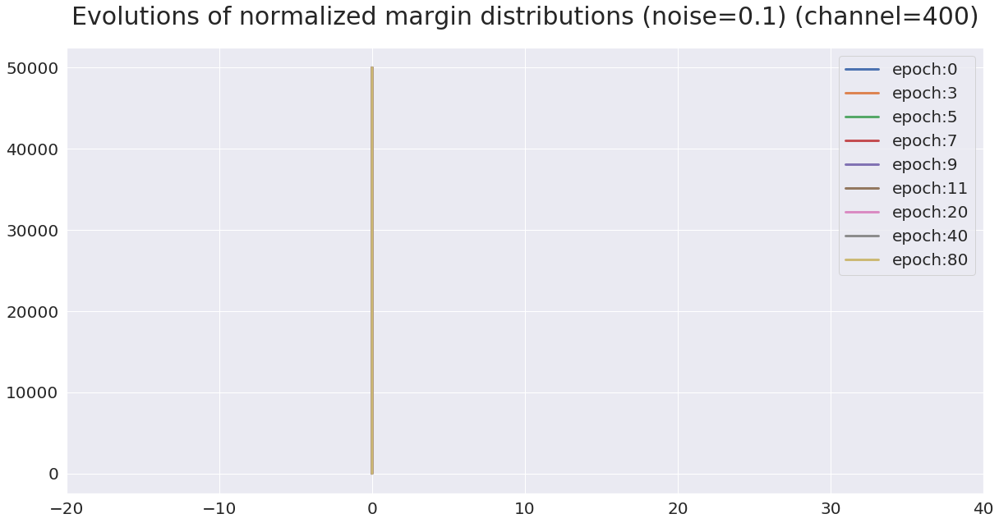

In [4]:
# %%
root = './'
lr = 0.01
BATCH_SIZE = 100
weight_decay = 0.
label_mode = 'partially-0.1'
g0 = 20

print(f'****** label mode: {label_mode} ******')

img_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])
(training_dataset, testing_dataset), \
(training_loader, testing_loader) = get_loader(root, BATCH_SIZE, label_mode, img_transforms,'cifar100')

loaders = {'train': training_loader, 'test': testing_loader}
num_epochs = 100
for channel in [50,100,150,200,250,300,350,400]:
    exec("log_100_%d = {'num_params': [],'train_loss': [],'train_rloss': [],'train_error': [],'train_margin_error': [],'train_ramp_loss': [],'test_ramp_loss': [],'test_loss': [],'test_rloss': [],'test_error': [],'test_margin_error': [],'Lip': [],'w0': [],'w1': [],'w2': [],'w3': [],'w4': [],'w_fc': [],'margin_train': [],'margin_test': []}"%channel)

    # here use with_bn to control batch normalisation
    model = basic_cnn.CNN(channel, 100, with_bn=True)

    number_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f'total parameters: {number_params}')

    eval("log_100_%d['num_params'].append(number_params)"%channel)

    if use_gpu:
        model = model.cuda()

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=lr, weight_decay=weight_decay)
    exec("model, log_100_%d = train_model(model, criterion, optimizer, log_100_%d, g0, num_epochs=num_epochs)"%(channel,channel))
    fig = plt.figure(1, figsize=(20, 10))
    ax = fig.add_subplot(111)
    plt.title('Evolutions of normalized margin distributions (noise=0.1) (channel=%d)'%channel, fontsize=30, y=1.04)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    for i in [0, 3,5, 7, 9, 11,20, 40, 80]:
        exec("ax.plot(np.sort(log_100_%d['margin_train'][i])/log_100_%d['Lip'][i], range(50000),label=f'epoch:{i}',linewidth=3)"%(channel,channel))
    ax.set_xlim([-20, 40])
    ax.legend(fontsize=20)
    fig.savefig('./results_p0.1/cifar100_nMargin_distribution_%d.png'%channel)
    plt.show()-

In [35]:
for channel in [50,100,150,200,250,300,350,400]:
    exec("pickle.dump(log_100_%d,open('./results_p0.1/log_100_%d.log','wb'))"%(channel,channel))

In [108]:
for channel in [50,100,150,200,250,300,350,400]:
    exec("log_100_%d=pickle.load(open('./results_p0.1/log_100_%d.log','rb'))"%(channel,channel))

In [109]:
def plot_channel_cifar100(channel,interval,g0):
    fig = plt.figure(1, figsize=(20, 10))
    ax = fig.add_subplot(111)
    #plt.title('Evolutions of normalized margin distributions (noise=0.1) (channel=%d)'%channel, fontsize=30, y=1.04)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    for i in [0, 2,4, 6, 8, 10,15,20, 40, 80]:
        exec("ax.plot(np.sort(log_100_%d['margin_train'][i])/log_100_%d['Lip'][i], np.arange(50000)/50000,label=f'epoch:{i}',linewidth=3)"%(channel,channel))
    ax.set_xlim(interval)
    ax.set_xticks([0])
    ax.legend(fontsize=20)
    exec("fig.savefig('./results_p0.1/cifar100_nMargin_distribution_%d.png'%channel)")
    plt.show()

    fig = plt.figure(1, figsize=(20, 10))
    ax = fig.add_subplot(111)
    #plt.title('Evolutions of test normalized margin distributions (noise=0.1) (channel=%d)'%channel, fontsize=30, y=1.04)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    for i in [0, 2,4, 6, 8, 10,15,20, 40, 80]:
        exec("ax.plot(np.sort(log_100_%d['margin_test'][i])/log_100_%d['Lip'][i], np.arange(10000)/10000,label=f'epoch:{i}',linewidth=3)"%(channel,channel))
    ax.set_xlim(interval)
    ax.set_xticks([0])
    ax.legend(fontsize=20)
    exec("fig.savefig('./results_p0.1/cifar100_test_nMargin_distribution_%d.png'%channel)")
    plt.show()

    fig = plt.figure(1, figsize=(20, 10))
    ax = fig.add_subplot(111)

    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)

    train_merror=eval("[margin_error(margin, lip * %f) for (margin, lip) in zip(log_100_%d['margin_train'], log_100_%d['Lip'])]"%(g0,channel,channel))
    ax.plot(train_merror,'r',linewidth=3,
        label='train margin_error '+r'($\rho^{\ast}=$'+'{})'.format(g0))
    exec("ax.plot(log_100_%d['test_error'],'b',linewidth=3,label='test error')"%channel)
    ax.legend(fontsize=20,loc='upper right')
    #ax.set_xlim(0,100)
    ax.set_ylim(0,1.05)
    plt.title('test error and training margin error (noise=0.1) (channel=%d)'%channel, fontsize=30, y=1.04)
    x1=eval("np.argmin(log_100_%d['test_error'])"%channel)
    exec("ax.plot([x1,x1],[0,log_100_%d['test_error'][x1]],'b--')"%channel)
    x2=np.argmin(train_merror)
    ax.plot([x2,x2],[0,train_merror[x2]],'r--')
    ax.set_xticks([0,x1,x2,40,60,80,100])
    ax.set_xlabel('Number of epochs',fontdict={'size': 30})
    exec("plt.savefig('./results_p0.1/cifar100_margin_error_and_test_error_%d.png')"%channel)
    plt.show()
    
def plot_heatmap_cifar100(channel,interval):
    n=len(interval)
    corr=np.zeros((n,n))
    corr_linear=np.zeros((n,n))
    for i in range(n):
        g1=interval[i]
        train_merror=eval("[margin_error(margin, lip * %f) for (margin, lip) in zip(log_100_%d['margin_train'], log_100_%d['Lip'])]"%(g1,channel,channel))
        for j in range(n):
            g2=interval[j]
            test_merror=eval("[margin_error(margin, lip * %f) for (margin, lip) in zip(log_100_%d['margin_test'], log_100_%d['Lip'])]"%(g2,channel,channel))
            corr[i,j]=scipy.stats.spearmanr(train_merror,test_merror)[0]
            corr_linear[i,j]=np.corrcoef(train_merror,test_merror)[0,1]
    fig = plt.figure(1, figsize=(10, 10))
    ax = fig.add_subplot(111)
    im=ax.pcolormesh(interval,interval,corr)
    fig.colorbar(im)
    ax.axis('tight')
    from matplotlib import ticker
    formatter=ticker.ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.xaxis.set_major_formatter(formatter)
    ax.yaxis.set_major_formatter(formatter)
    exec("fig.savefig('./results_p0.1/cifar100_margin_error_rankcorr_%d.png'%channel)")
    plt.show()
    
    fig = plt.figure(1, figsize=(10, 10))
    ax = fig.add_subplot(111)
    im=ax.pcolormesh(interval,interval,corr_linear)
    fig.colorbar(im)
    ax.axis('tight')
    from matplotlib import ticker
    formatter=ticker.ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-1,1))
    ax.xaxis.set_major_formatter(formatter)
    ax.yaxis.set_major_formatter(formatter)
    exec("fig.savefig('./results_p0.1/cifar100_margin_error_linearcorr_%d.png'%channel)")
    plt.show()

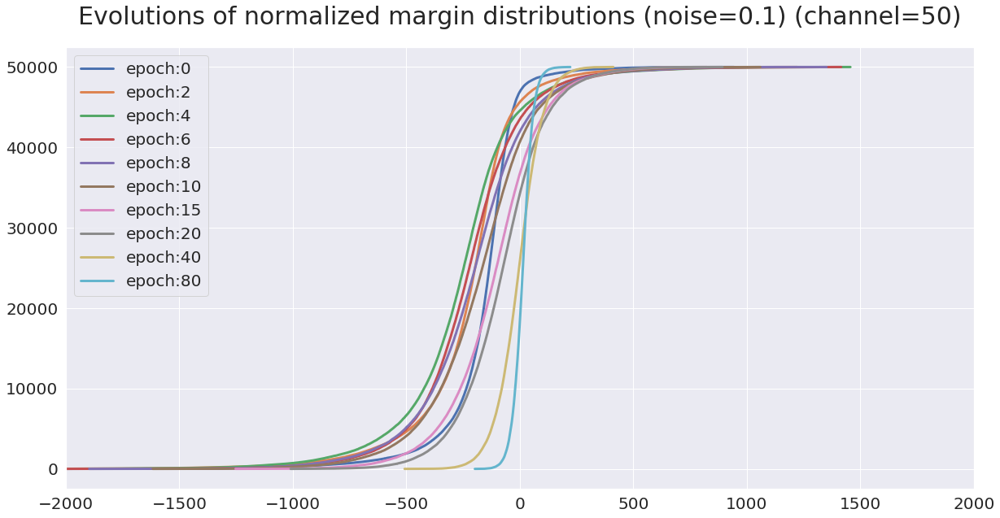

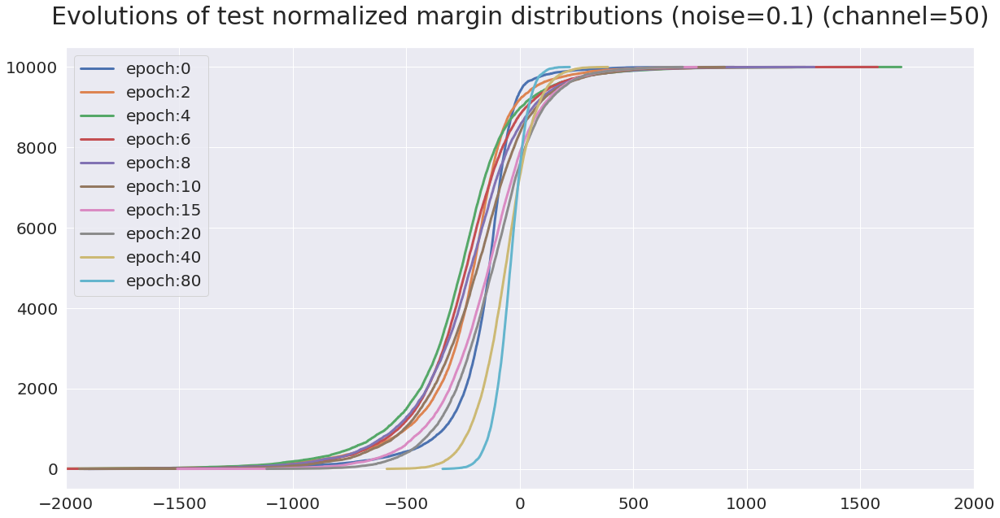

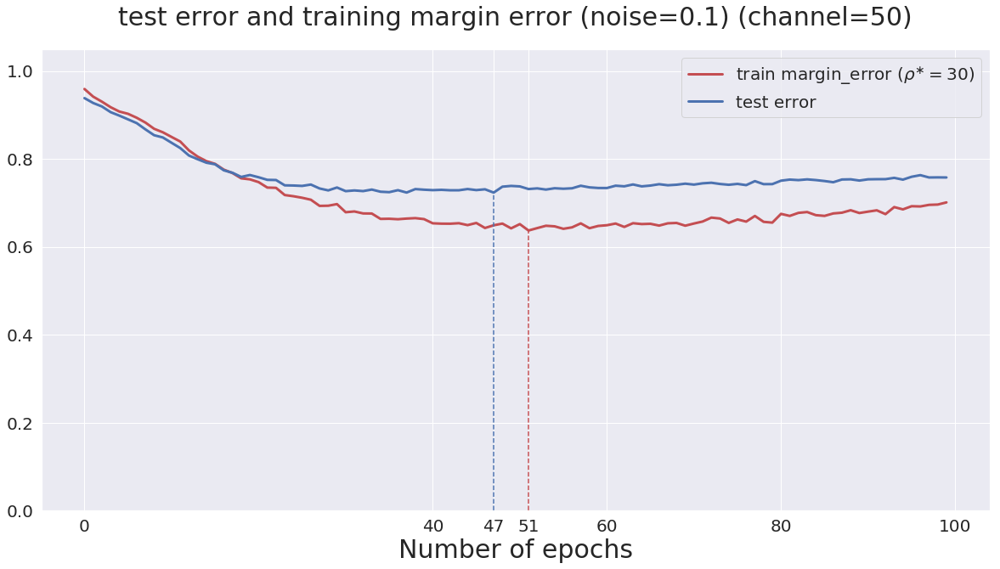

In [22]:
plot_channel_cifar100(50,[-2000,2000],30)

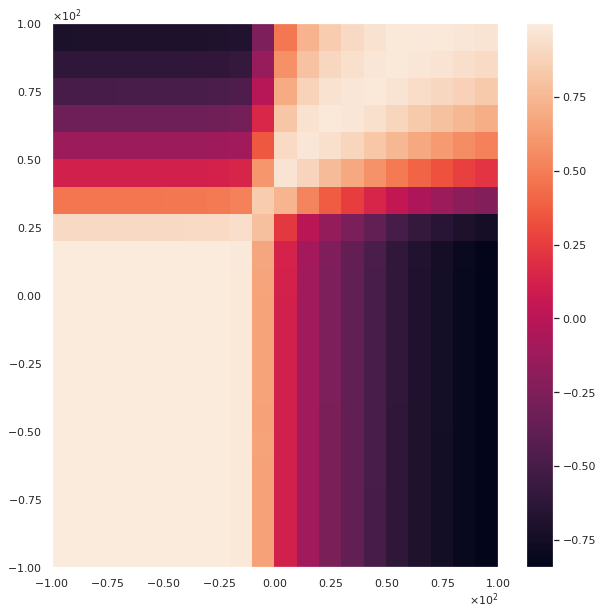

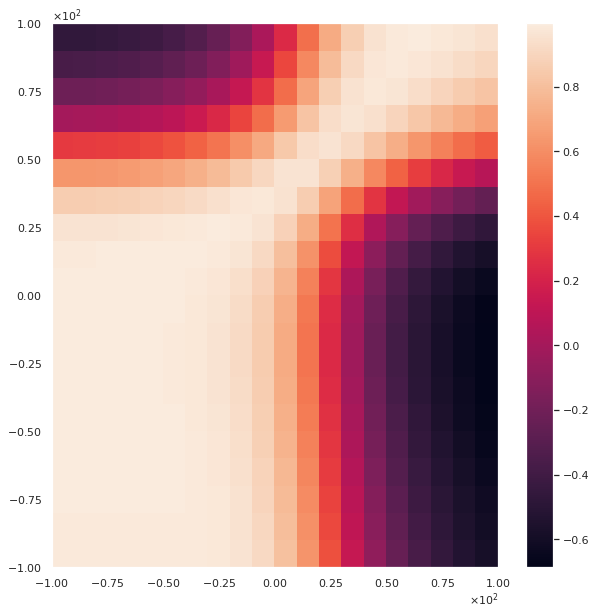

In [20]:
plot_heatmap_cifar100(50,np.linspace(-100,100,21))

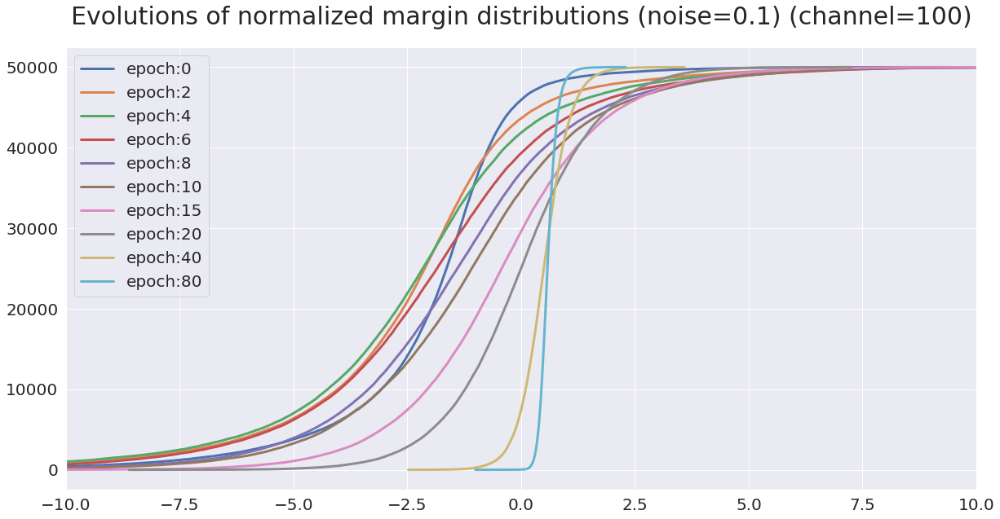

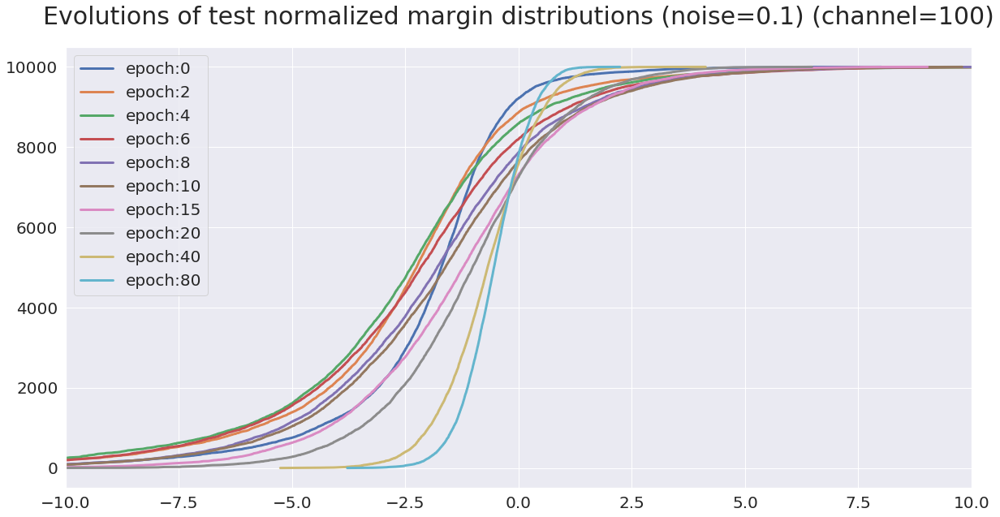

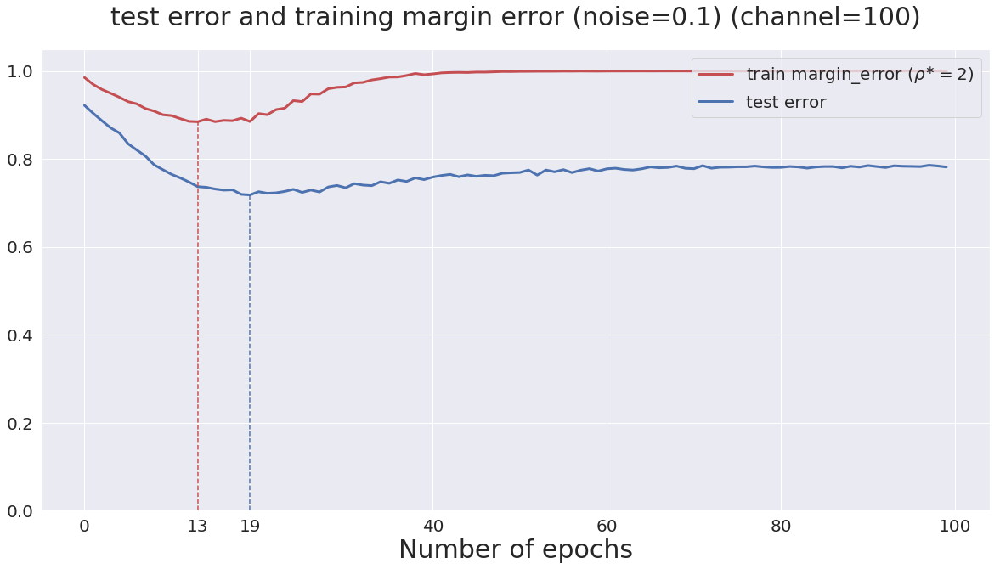

In [25]:
plot_channel_cifar100(100,[-10,10],2)

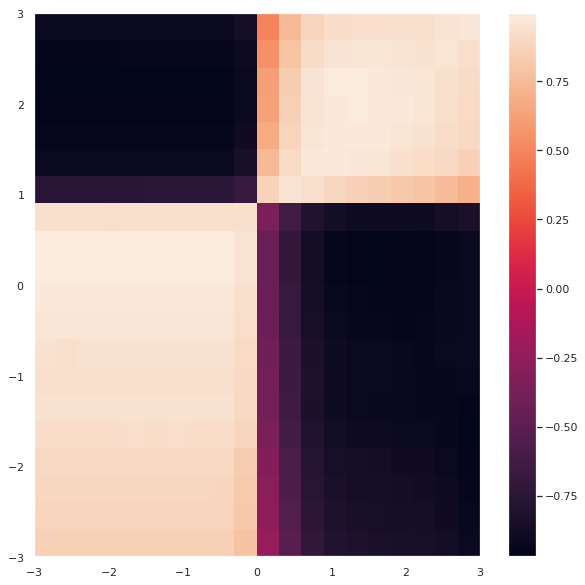

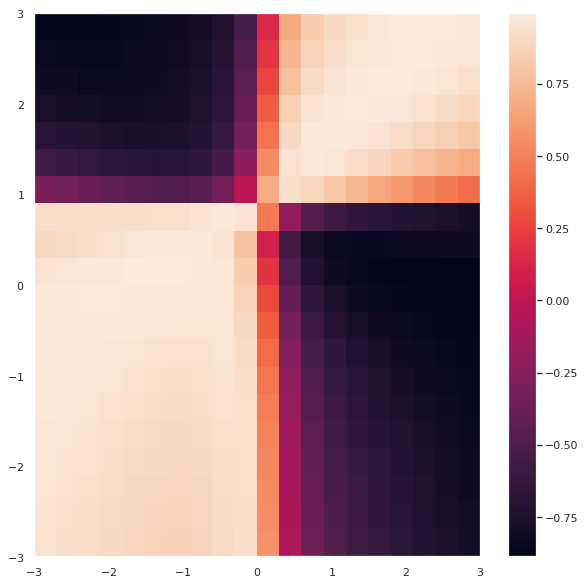

In [26]:
plot_heatmap_cifar100(100,np.linspace(-3,3,21))

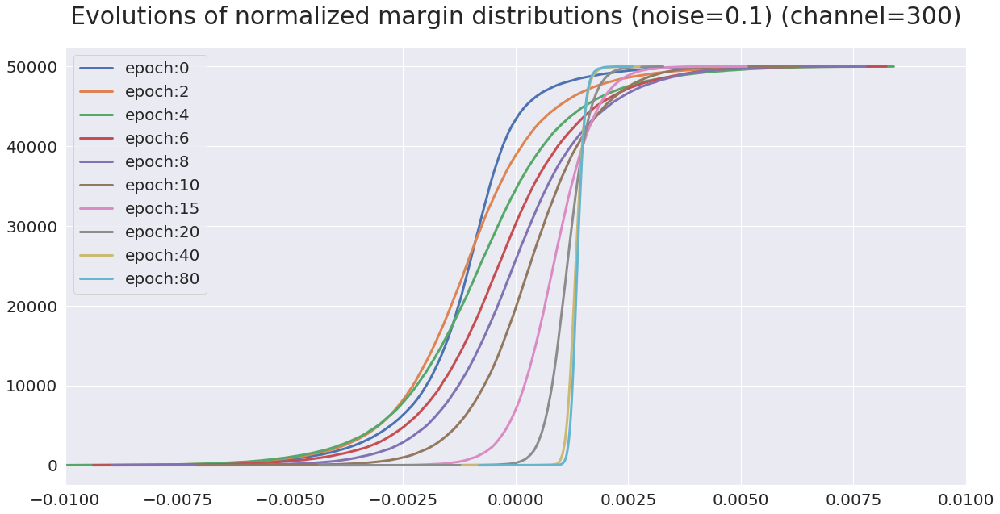

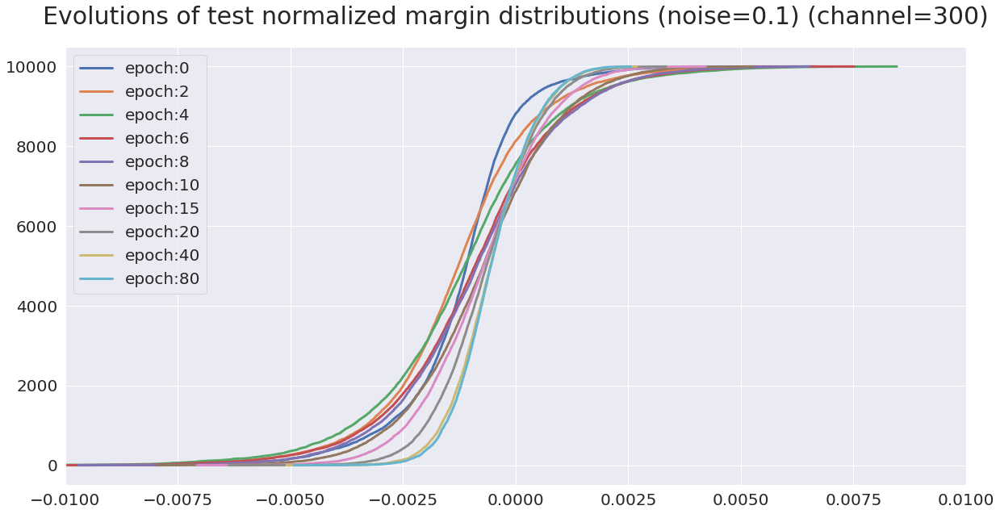

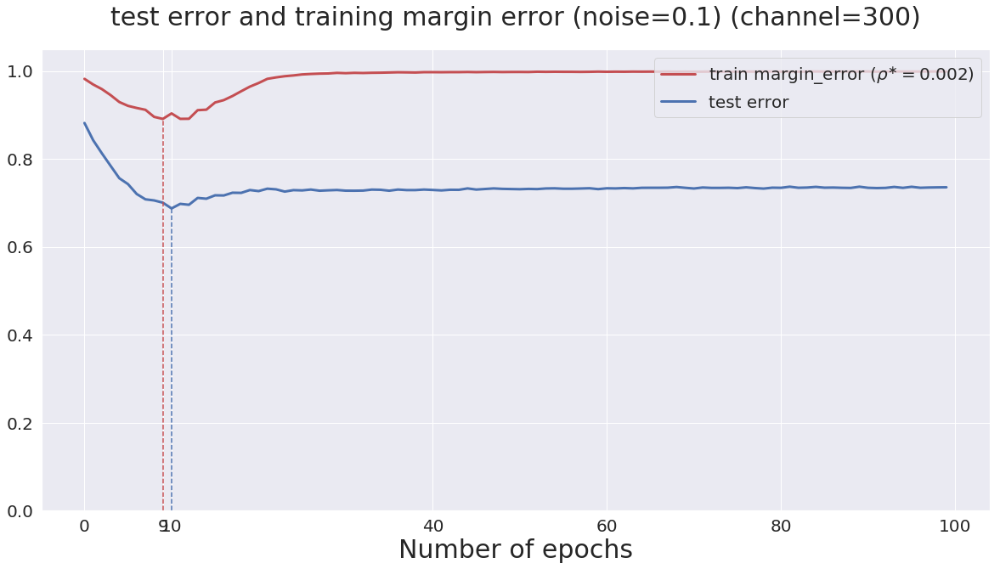

In [30]:
plot_channel_cifar100(300,[-1e-2,1e-2],2e-3)

/home/yhuangcc/.conda/envs/pytorch/lib/python3.6/site-packages/numpy/lib/function_base.py:3183: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/yhuangcc/.conda/envs/pytorch/lib/python3.6/site-packages/numpy/lib/function_base.py:3184: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/home/yhuangcc/.conda/envs/pytorch/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/home/yhuangcc/.conda/envs/pytorch/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/home/yhuangcc/.conda/envs/pytorch/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


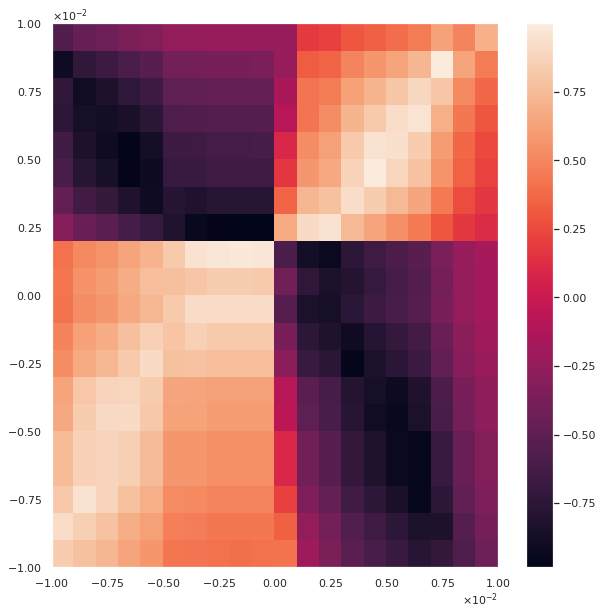

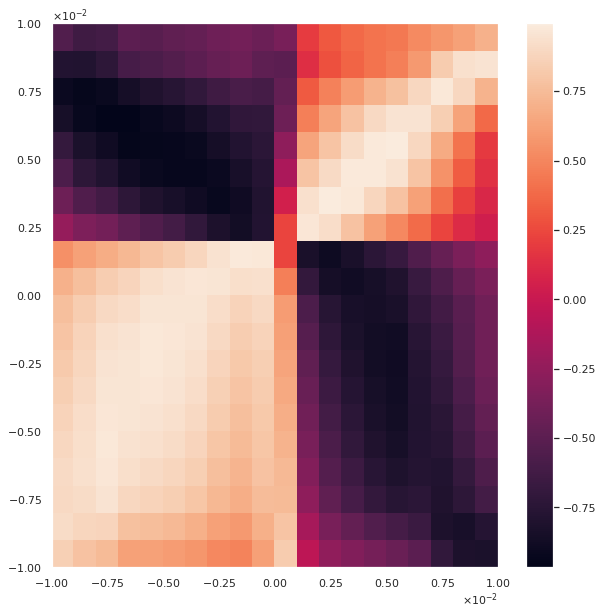

In [37]:
plot_heatmap_cifar100(300,np.linspace(-1e-2,1e-2,21))

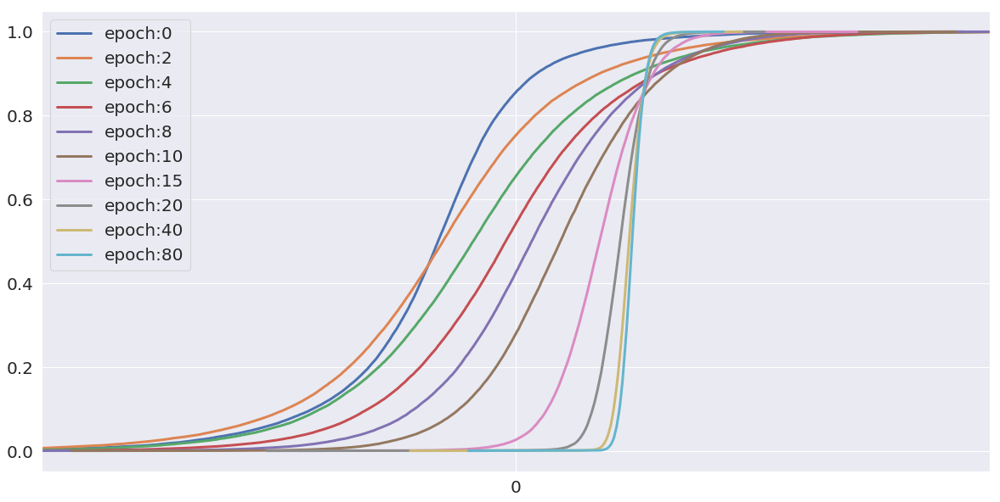

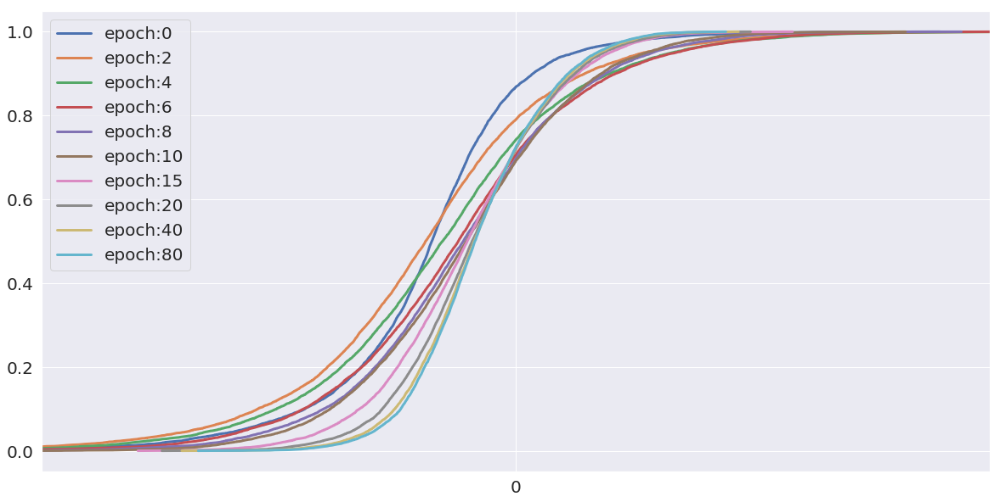

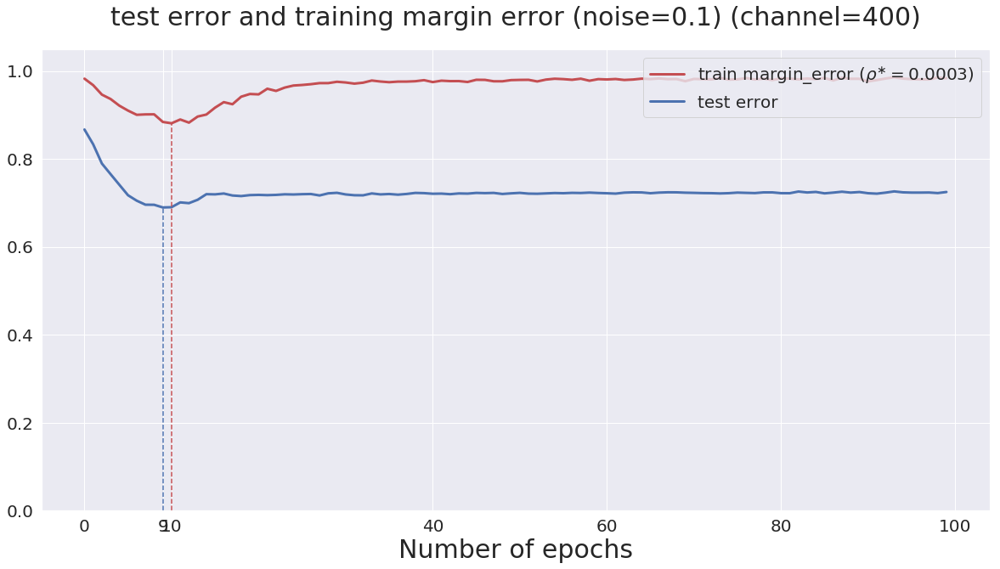

In [110]:
plot_channel_cifar100(400,[-1e-3,1e-3],3e-4)

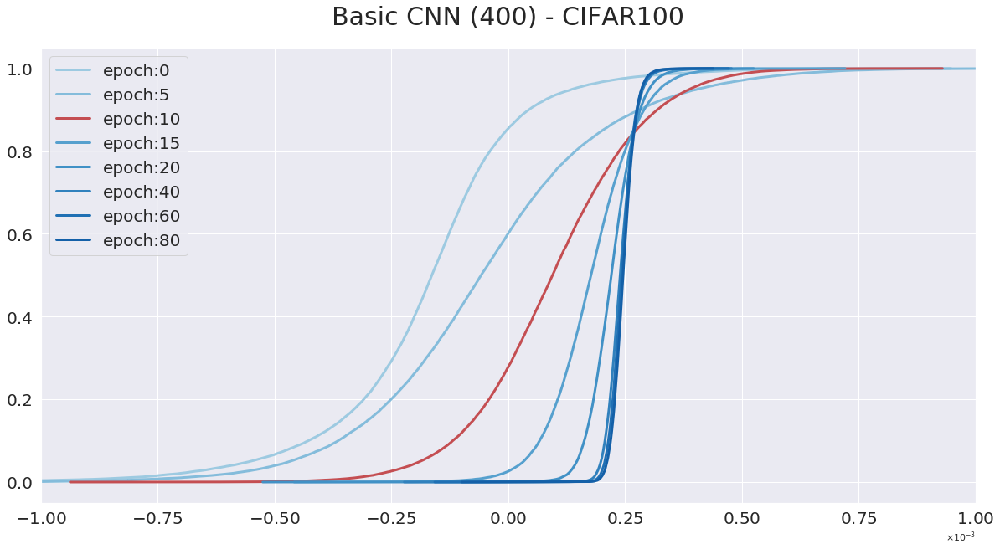

In [269]:
channel=400
interval=[-1e-3,1e-3]
fig = plt.figure(1, figsize=(20, 10))
ax = fig.add_subplot(111)
plt.title('Basic CNN (%d) - CIFAR100'%channel, fontsize=30, y=1.04)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
for j,i in enumerate([0, 5,10,15,20, 40,60, 80]):
    if i==10:
        c='r'
        d=5
    else:
        c=sbn.color_palette('Blues',15)[j+5]
        d=3
    exec("ax.plot(np.sort(log_100_%d['margin_train'][i])/log_100_%d['Lip'][i], np.arange(50000)/50000,label=f'epoch:{i}',c=c,linewidth=3)"%(channel,channel))
ax.set_xlim(interval)
from matplotlib import ticker
formatter=ticker.ScalarFormatter(useMathText=True)
formatter.set_scientific(True)
formatter.set_powerlimits((-1,1))
ax.xaxis.set_major_formatter(formatter)
#ax.set_xticks([0])
ax.legend(fontsize=20)
exec("fig.savefig('./results_p0.1/cifar100_nMargin_distribution_%d.png'%channel)")
plt.show()

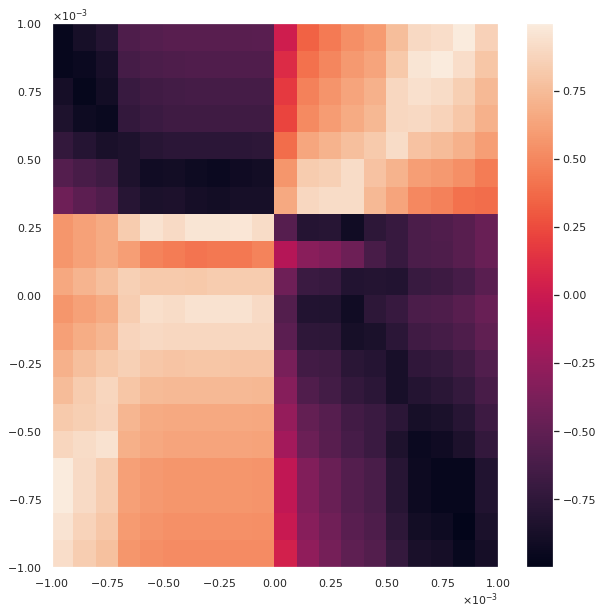

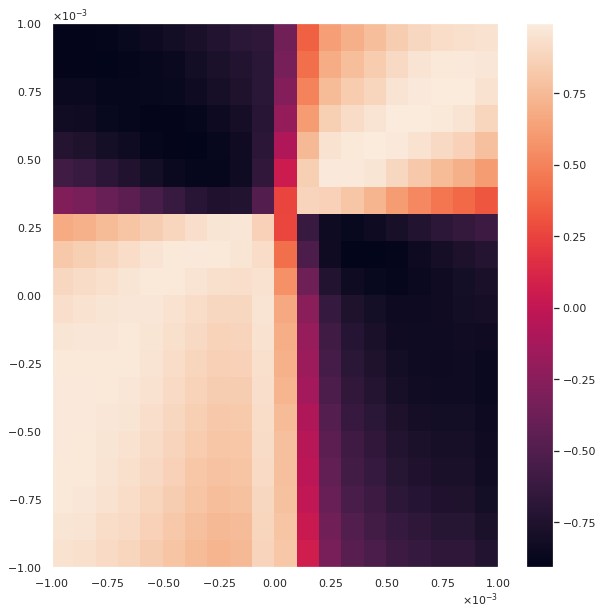

In [38]:
plot_heatmap_cifar100(400,np.linspace(-1e-3,1e-3,21))